In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!nvidia-cdl

Driver version: 510.85.02
------------------- Device 0 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 24055MiB / 24576MiB
Temperature: 43C
Running processes not found

------------------- Device 1 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 13770MiB / 24576MiB
Temperature: 27C
Running processes not found

------------------- Device 2 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage:   310MiB / 24576MiB
Temperature: 24C
Running processes not found

------------------- Device 3 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:   247MiB / 11264MiB
Temperature: 29C
Running processes not found

------------------- Device 4 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:   247MiB / 11264MiB
Temperature: 26C
Running processes not found



In [3]:
########## import libraries
import numpy as np
import random
import scipy.stats
import math
import torch
from torch import nn
import pandas as pd
import matplotlib.pyplot as plt
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

from tqdm import tqdm
import pickle
from wikidataintegrator import wdi_core
from wikidata.client import Client
import wikidata
from itertools import compress

import en_core_web_sm
import spacy
from numpy import trapz
import warnings
warnings.filterwarnings("ignore")

########## import functions
from uncertainty import sinlge_model_ue, predict_and_proba, aggregation_plot_sinle_measures
from uncertainty import area_under_rejection_curve, count_AURC_sinle_model_UE
from utils import get_description_name, getScores
from utils import topkSample, greedyPredict, check_t5_sq, stable_experiments

########## reproducibility
stable_experiments(42)

########## necessary soft
# spacy.prefer_gpu()
nlp = spacy.load("en_core_web_sm")
#nlp = en_core_web_sm.load()
client = wikidata.client.Client()


########## model
t5_qa_model = AutoModelForSeq2SeqLM.from_pretrained("google/t5-xl-ssm-nq")
t5_tok = AutoTokenizer.from_pretrained("google/t5-xl-ssm-nq")

########## device
#!nvidia-cdl
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
t5_qa_model.to(device)



T5ForConditionalGeneration(
  (shared): Embedding(32128, 2048)
  (encoder): T5Stack(
    (embed_tokens): Embedding(32128, 2048)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=2048, out_features=2048, bias=False)
              (k): Linear(in_features=2048, out_features=2048, bias=False)
              (v): Linear(in_features=2048, out_features=2048, bias=False)
              (o): Linear(in_features=2048, out_features=2048, bias=False)
              (relative_attention_bias): Embedding(32, 32)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseGatedActDense(
              (wi_0): Linear(in_features=2048, out_features=5120, bias=False)
              (wi_1): Linear(in_features=2048, out_features=5120, bias=False)
       

In [4]:
def area_under_rejection_curve(data, name, topk, num_quantiles, number_of_digids_round = 4):
    """
    This function calculates absolute Area under Rejection curve to 
    estimate overall quality of uncertainty estimation
    """
    max_area = (100 - 100 / num_quantiles) * 100

    x = (100.0 - np.array(list(data[f"{name}"][topk].keys())).astype(float))[::-1]
    y = np.array(list(data[f"{name}"][topk].values())).astype(float)[::-1]
    area = np.round(trapz(y = y, x = x, dx=1) / max_area, number_of_digids_round)

    return area


    
def count_AURC_sinle_model_UE(data, num_quantiles, beam_size):
    
    name_of_dataset = data["name_of_dataset"]
    
    names = [
        "accuracy_for_each_topk_entropy",
        "accuracy_for_each_topk_maxprob",
        "accuracy_for_each_topk_delta"
    ]    

    X = [[area_under_rejection_curve(data = data, name = name, topk=topk, num_quantiles = num_quantiles) for topk in data["top_ks"]] for name in names]

    if beam_size == 20:
        df = pd.DataFrame(X)
        df["UE"] = ["entropy", "score", "delta"]
        df.set_index("UE", inplace=True)
        df.columns = [f"{name_of_dataset} top-1 acc",
                      f"{name_of_dataset} top-2 acc",
                      f"{name_of_dataset} top-5 acc",
                      f"{name_of_dataset} top-10 acc",
                      f"{name_of_dataset} top-20 acc"]
        mux = pd.MultiIndex.from_product([[f"{name_of_dataset}"], ['top-1 acc', 'top-2 acc', 'top-5 acc', 'top-10 acc', 'top-20 acc']])

        dta = df.reset_index()[[f"{name_of_dataset} top-1 acc", f"{name_of_dataset} top-2 acc",
                                f"{name_of_dataset} top-5 acc", f"{name_of_dataset} top-10 acc",
                                f"{name_of_dataset} top-20 acc"]]

        new_dta = pd.DataFrame(np.array(dta), columns=mux)
        new_dta["Model"] = ["Single"]*3
        beam_size = data["num_beams"]
        new_dta["Beam Size"] = beam_size
        new_dta["UE"] = ["entropy", "score", "delta"]


        new_dta = new_dta[["Model", "Beam Size", "UE", f"{name_of_dataset}"]]
        new_dta.to_csv(f"AURC_{name_of_dataset}_single_model_bs_{beam_size}.csv")
        
    elif beam_size == 10:
        df = pd.DataFrame(X)
        df["UE"] = ["entropy", "score", "delta"]
        df.set_index("UE", inplace=True)
        df.columns = [f"{name_of_dataset} top-1 acc",
                      f"{name_of_dataset} top-2 acc",
                      f"{name_of_dataset} top-5 acc",
                      f"{name_of_dataset} top-10 acc"]
        mux = pd.MultiIndex.from_product([[f"{name_of_dataset}"], ['top-1 acc', 'top-2 acc', 'top-5 acc', 'top-10 acc']])

        dta = df.reset_index()[[f"{name_of_dataset} top-1 acc", f"{name_of_dataset} top-2 acc",
                                f"{name_of_dataset} top-5 acc", f"{name_of_dataset} top-10 acc"]]

        new_dta = pd.DataFrame(np.array(dta), columns=mux)
        new_dta["Model"] = ["Single"]*3
        beam_size = data["num_beams"]
        new_dta["Beam Size"] = beam_size
        new_dta["UE"] = ["entropy", "score", "delta"]


        new_dta = new_dta[["Model", "Beam Size", "UE", f"{name_of_dataset}"]]
        new_dta.to_csv(f"AURC_{name_of_dataset}_single_model_bs_{beam_size}.csv")
    
    return new_dta

In [5]:
########## data for establish relations with words and wikidata ids
##! wget https://dl.fbaipublicfiles.com/GENRE/lang_title2wikidataID-normalized_with_redirect.pkl    
with open("lang_title2wikidataID-normalized_with_redirect.pkl", "rb") as f:
    lang_title2wikidataID = pickle.load(f)

In [58]:
########## define functions
softmax = nn.Softmax()
def from_text_to_id(x):
    try:
        return list(lang_title2wikidataID[("en", x)])[0]
    except:
        return "None"
    
    
def sinlge_model_ue(
    name_of_metric,
    name_of_dataset,
    probas,
    predictions,
    num_quantiles,
    answers,
    top_ks,
    sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
):
    
    if (name_of_metric == "delta") or (name_of_metric == "max_prob"):
        quants = [thresh / num_quantiles for thresh in range(0, num_quantiles)]
    else:    
        quants = [thresh / num_quantiles for thresh in range(1, num_quantiles+1)]
        
    #print("quants", quants,"\n")

    
    if name_of_metric == "entropy":
        ue_metrics = [scipy.stats.entropy(i) for i in probas]
    elif name_of_metric == "delta":
        ue_metrics = [i[0] - i[1] for i in probas]
        ue_metrics = torch.stack(ue_metrics).tolist()
    elif name_of_metric == "max_prob":
        ue_metrics = [i[0] for i in probas]
        ue_metrics = torch.stack(ue_metrics).tolist()
    
    #print("ue_metrics", ue_metrics,"\n")
        
    
    thresholds_ue_metric = [np.quantile(ue_metrics, q) for q in quants]
    
    if (name_of_metric == "delta") or (name_of_metric == "max_prob"):
        thresholds_ue_metric = thresholds_ue_metric[::-1]
    
    #print("thresholds_ue_metric", thresholds_ue_metric,"\n")
    
    accuracy_for_each_topk_ue_metrics = {}

    #top_k pred
    for top_k in top_ks:

        accuracy_for_each_quantile = {}

        for quantile in range(num_quantiles):

            
            if name_of_metric == "entropy":
                # list of predictions
                list_of_predictions = list(compress(predictions, ue_metrics <= thresholds_ue_metric[quantile]))
                #print("list_of_predictions", list_of_predictions)

                #list of correct answers
                list_of_correct_answers = list(compress(answers[:sample_questions], ue_metrics <= thresholds_ue_metric[quantile]))
                #print("list_of_correct_answers", list_of_correct_answers)
                
            elif name_of_metric == "delta":
                
                # list of predictions
                list_of_predictions = list(compress(predictions, ue_metrics >= thresholds_ue_metric[quantile]))
                #print("len(list_of_predictions)", len(list_of_predictions))

                #list of correct answers
                list_of_correct_answers = list(compress(answers[:sample_questions], ue_metrics >= thresholds_ue_metric[quantile]))
                
            elif name_of_metric == "max_prob":
                
                
                list_of_predictions = list(compress(predictions, ue_metrics >= thresholds_ue_metric[quantile]))
                #print("len(list_of_predictions)", len(list_of_predictions))

                #list of correct answers
                list_of_correct_answers = list(compress(answers[:sample_questions], ue_metrics >= thresholds_ue_metric[quantile]))
        
                

            # choose top k predictions
            top_k_list_of_predictions = [i[:top_k] for i in list_of_predictions]
            #print("top_k_list_of_predictions", top_k_list_of_predictions, "\n")


            top_k_list_of_predicted_ids= []
            for sample in top_k_list_of_predictions:
                new = []
                for prediction in sample:
                    try:
                        x = from_text_to_id(prediction)
                    except:
                        x = "None"
                    new.append(x)

                top_k_list_of_predicted_ids.append(new)

            #print("top_k_list_of_predicted_ids", top_k_list_of_predicted_ids)
            

            right = 0
            for i in range(len(list_of_correct_answers)):
                if any(item in top_k_list_of_predicted_ids[i] for item in list_of_correct_answers[i]):
                    right += 1
                else:
                    pass

            accuracy = np.round(right/len(list_of_correct_answers), 4)*100
            #print("accuracy", accuracy)
            #print(f"Top-{top_k} accuracy on the {(quantile+1)*(int(100/num_quantiles))}% the most confident from the entropy point of view = {accuracy}%")

            accuracy_for_each_quantile[(quantile+1)*(int(100/num_quantiles))] = accuracy
        accuracy_for_each_topk_ue_metrics[top_k] = accuracy_for_each_quantile
        
    #print("accuracy_for_each_topk_ue_metrics", accuracy_for_each_topk_ue_metrics,"\n")
        
    
    if plot_rejection_curves:
        
        font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 16
            }

        font_title = {'family': 'serif',
                      'color': 'darkred',
                      'weight': 'normal',
                      'size': 20
                      }


        plt.figure(figsize = (15, 9))
        plt.title(f"Rejection curves based on {name_of_metric} for {name_of_dataset}", fontdict=font_title)

        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5))
        plt.grid(color='black', linewidth=0.15)

        
        if 1 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[1].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[1].values())),
                     label=f"Top-{1} Accuracy via {name_of_metric}", c="blue", marker='.', markersize=13, linewidth=0.8);
        
        if 2 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[2].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[2].values())),
                     label=f"Top-{2} Accuracy via {name_of_metric}", c="red", marker='.', markersize=13, linewidth=0.8);
        
        if 5 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[5].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[5].values())),
                     label=f"Top-{5} Accuracy via {name_of_metric}", c="green", marker='.', markersize=13, linewidth=0.8);
        if 10 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[10].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[10].values())),
                     label=f"Top-{10} Accuracy via {name_of_metric}", c="orange", marker='.', markersize=13, linewidth=0.8);
        if 20 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[20].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[20].values())),
                     label=f"Top-{20} Accuracy via {name_of_metric}", c="pink", marker='.', markersize=13, linewidth=0.8);

        if 1 in top_ks:
            accuracy_on_full_data_top_1 = np.array(list(accuracy_for_each_topk_ue_metrics[1].values()))[-1]
        if 2 in top_ks:
            accuracy_on_full_data_top_2 = np.array(list(accuracy_for_each_topk_ue_metrics[2].values()))[-1]
        if 5 in top_ks:
            accuracy_on_full_data_top_5 = np.array(list(accuracy_for_each_topk_ue_metrics[5].values()))[-1]
        if 10 in top_ks:
            accuracy_on_full_data_top_10 = np.array(list(accuracy_for_each_topk_ue_metrics[10].values()))[-1]
        if 20 in top_ks:
            accuracy_on_full_data_top_20 = np.array(list(accuracy_for_each_topk_ue_metrics[20].values()))[-1]

        if 1 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, accuracy_on_full_data_top_1));
        if 2 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2));
        if 5 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5));
        if 10 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10));
        if 20 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20));

        plt.legend(fontsize=16);

        plt.savefig(f"QA_Rejection_curves_based_on_{name_of_metric}_for_{name_of_dataset}_{model_name}_model.png", dpi = 300)

    
    return accuracy_for_each_topk_ue_metrics, ue_metrics
    

def aggregation_plot_sinle_measures(
    ue_metrics_to_plot: "list",
    top_k_to_plot: "list",
    name_of_dataset,
    accuracy_for_each_topk_delta = None,
    accuracy_for_each_topk_maxprob = None,
    accuracy_for_each_topk_entropy = None,
    model_name = "T5_XL_SSM_NQ"
):
    font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 20
            }

    font_title = {'family': 'serif',
                  'color': 'darkred',
                  'weight': 'normal',
                  'size': 24
                  }

    plt.figure(figsize = (24, 20))
    plt.title(f"Rejection curves based on Single model UE measures for {name_of_dataset}", fontdict=font_title)
    plt.xlabel("Rejection rate, %", fontdict=font)
    plt.ylabel("Accuracy, %", fontdict=font)
    plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
    plt.yticks(size = 14)
    plt.grid(color='black', linewidth=0.15)

    linewidth = 1.8
    markersize = 9
    
    if 1 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[1].keys())),
                     np.array(list(accuracy_for_each_topk_delta[1].values())),
                     label=f"Top-{1} Accuracy via Delta", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "max_prob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[1].keys())),
                     np.array(list(accuracy_for_each_topk_maxprob[1].values())),
                     label=f"Top-{1} Accuracy via Maxprob", c="blue", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[1].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[1].values())),
                 label=f"Top-{1} Accuracy via Entropy", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    if 2 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[2].keys())),
                 np.array(list(accuracy_for_each_topk_delta[2].values())),
                 label=f"Top-{2} Accuracy via Delta", c="red", marker='d', markersize=markersize, linewidth=linewidth);
        
        if "max_prob" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[2].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[2].values())),
                 label=f"Top-{2} Accuracy via Maxprob", c="red", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[2].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[2].values())),
                 label=f"Top-{2} Accuracy via Entropy", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    
    if 5 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[5].keys())),
                 np.array(list(accuracy_for_each_topk_delta[5].values())),
                 label=f"Top-{5} Accuracy via Delta", c="green", marker='d', markersize=markersize, linewidth=linewidth);

        if "max_prob" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[5].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[5].values())),
                 label=f"Top-{5} Accuracy via Maxprob", c="green", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[5].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[5].values())),
                 label=f"Top-{5} Accuracy via Entropy", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');


    if 10 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[10].keys())),
                 np.array(list(accuracy_for_each_topk_delta[10].values())),
                 label=f"Top-{10} Accuracy via Delta", c="orange", marker='d', markersize=markersize, linewidth=linewidth);

        if "max_prob" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[10].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[10].values())),
                 label=f"Top-{10} Accuracy via Maxprob", c="orange", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[10].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[10].values())),
                 label=f"Top-{10} Accuracy via Entropy", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    if 20 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[20].keys())),
                 np.array(list(accuracy_for_each_topk_delta[20].values())),
                 label=f"Top-{20} Accuracy via Delta", c="pink", marker='d', markersize=markersize, linewidth=linewidth);
        
        if "max_prob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[20].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[20].values())),
                 label=f"Top-{20} Accuracy via Maxprob", c="pink", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[20].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[20].values())),
                 label=f"Top-{20} Accuracy via Entropy", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');



    if 1 in top_k_to_plot:
        accuracy_on_full_data_top_1 = np.array(list(accuracy_for_each_topk_delta[1]))[-1]
    if 2 in top_k_to_plot:
        accuracy_on_full_data_top_2 = np.array(list(accuracy_for_each_topk_delta[2]))[-1]
    if 5 in top_k_to_plot:
        accuracy_on_full_data_top_5 = np.array(list(accuracy_for_each_topk_delta[5]))[-1]
    if 10 in top_k_to_plot:
        accuracy_on_full_data_top_10 = np.array(list(accuracy_for_each_topk_delta[10]))[-1]
    if 20 in top_k_to_plot:
        accuracy_on_full_data_top_20 = np.array(list(accuracy_for_each_topk_delta[20].values()))[-1]
    
    if 1 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, accuracy_on_full_data_top_1), size = 14);
    if 2 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2), size = 14);
    if 5 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5), size = 14);
    if 10 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10), size = 14);
    if 20 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20), size = 14);

    plt.legend(fontsize=16);

    plt.savefig(f"QA_Rejection_curves_based_on_single_model_UE_mes_for_{name_of_dataset}_{model_name}_model.png", dpi = 200)


    
def total_experiment_uncertainty_single_model(
    questions,
    sample_questions,
    answers,
    metrics: "list",
    top_k_to_plot = [1, 2, 5, 10, 20],
    need_fitting = False,
    source = "single_model_result_sq_in_qraph_bs_20",
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = 10,
    seed = 42,
    name_of_dataset = "RUBQ 2.0 1-hop test",
    num_quantiles = 20,
    top_ks = [1,2,5,10,20],
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ",
    plot_all = True  
):
        
    if need_fitting:
    
        ######## generate predictions with probabilities
        result = []
        for i in tqdm(range(sample_questions)):
            result.append(predict_and_proba(questions[i], model = model,
                                            tokenizer=tokenizer, device=device,
                                            num_beams = num_beams))

        result = [(result[i][0],result[i][1].to("cpu")) for i in range(len(result))]
        predictions = [i[0] for i in result]
        probas = [i[1] for i in result]
        probas = [i.detach().to("cpu") for i in probas]
        
        if "entropy" in metrics:
            res_entropy, entropies = sinlge_model_ue(name_of_metric="entropy",
                                                     name_of_dataset=name_of_dataset, 
                                                     probas = probas,
                                                     predictions = predictions,
                                                     num_quantiles = num_quantiles,
                                                     answers = answers,
                                                     top_ks = top_ks,
                                                     sample_questions = sample_questions,
                                                     plot_rejection_curves=plot_rejection_curves)

        if "delta" in metrics:
            res_delta, deltas = sinlge_model_ue(name_of_metric="delta",
                                                name_of_dataset=name_of_dataset, 
                                                probas = probas,
                                                predictions = predictions,
                                                num_quantiles = num_quantiles,
                                                answers = answers,
                                                top_ks = top_ks,
                                                sample_questions = sample_questions,
                                                plot_rejection_curves=plot_rejection_curves)
        if "maxprob" in metrics:
            res_maxprob, maxprobs = sinlge_model_ue(name_of_metric="max_prob",
                                                    name_of_dataset=name_of_dataset, 
                                                    probas = probas,
                                                    predictions = predictions,
                                                    num_quantiles = num_quantiles,
                                                    answers = answers,
                                                    top_ks = top_ks,
                                                    sample_questions = sample_questions,
                                                    plot_rejection_curves=plot_rejection_curves)
        
        data = {
                "predictive_distribution":result,    
                "predictions":predictions,
                "probabilities":probas,


                "entropies":entropies,
                "max_probs":maxprobs,
                "deltas":deltas,


                "accuracy_for_each_topk_entropy":res_entropy,
                "accuracy_for_each_topk_maxprob":res_maxprob,
                "accuracy_for_each_topk_delta":res_delta,

                "num_quantiles":num_quantiles,
                "top_ks":top_ks,
                "dataset_name":name_of_dataset,
                "num_beams":num_beams,
                "model":model_name,
                "name_of_dataset":name_of_dataset
        }
        
        with open(f'{source}.pickle', 'wb') as handle:
            pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL)
            
    if source != None:
        
        
        with open(f"{source}.pickle", "rb") as f:
            data = pickle.load(f)

        
        predictions = data["predictions"]
        probas = data["probabilities"]

    
    if "entropy" in metrics:
        res_entropy, entropies = sinlge_model_ue(name_of_metric="entropy",
                                                 name_of_dataset=name_of_dataset, 
                                                 probas = probas,
                                                 predictions = predictions,
                                                 num_quantiles = num_quantiles,
                                                 answers = answers,
                                                 top_ks = top_ks,
                                                 sample_questions = sample_questions,
                                                 plot_rejection_curves=plot_rejection_curves)

    if "delta" in metrics:
        res_delta, deltas = sinlge_model_ue(name_of_metric="delta",
                                            name_of_dataset=name_of_dataset, 
                                            probas = probas,
                                            predictions = predictions,
                                            num_quantiles = num_quantiles,
                                            answers = answers,
                                            top_ks = top_ks,
                                            sample_questions = sample_questions,
                                            plot_rejection_curves=plot_rejection_curves)
    if "maxprob" in metrics:
        res_maxprob, maxprobs = sinlge_model_ue(name_of_metric="max_prob",
                                                name_of_dataset=name_of_dataset, 
                                                probas = probas,
                                                predictions = predictions,
                                                num_quantiles = num_quantiles,
                                                answers = answers,
                                                top_ks = top_ks,
                                                sample_questions = sample_questions,
                                                plot_rejection_curves=plot_rejection_curves)
    if plot_all:
        
        aggregation_plot_sinle_measures(ue_metrics_to_plot = metrics,
                                        top_k_to_plot = top_k_to_plot,
                                        name_of_dataset = name_of_dataset,
                                        accuracy_for_each_topk_delta = res_delta,
                                        accuracy_for_each_topk_entropy = res_entropy,
                                        accuracy_for_each_topk_maxprob = res_maxprob,
                                        model_name = model_name)
        
    result_table = count_AURC_sinle_model_UE(data = data, num_quantiles=num_quantiles, beam_size = num_beams)
    return result_table
        
        
        
        
      

        


In [23]:
######################### <- HERE DETERMINE DATA 

########## load data
sq_mask = np.load("sq_mask_present_in_graph.npy")
sq_test = list(np.load("simple_questions_test.npy")[:,3])
sq_test_answers = np.array([[el] for el in list(np.load("simple_questions_test.npy")[:,2])])

########## mask for data (sq in graph)
sq_test = list(compress(sq_test, sq_mask))
sq_test_answers = np.array(list((compress(sq_test_answers, sq_mask))))

sample_questions = len(sq_test)
questions = sq_test[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "SQ in graph"
num_quantiles = 50
num_beams = 20
answers = sq_test_answers
top_ks = [1, 2, 5, 10, 20]
model_type = "t5-xl-ssm-nq"

In [43]:
######### generate predictions with probabilities
# result = []
# for i in tqdm(range(sample_questions)):
#     result.append(predict_and_proba(questions[i], model = t5_qa_model,
#                                     tokenizer=t5_tok, device=device,
#                                     num_beams = num_beams))

# result = [(result[i][0],result[i][1].to("cpu")) for i in range(len(result))]
# predictions = [i[0] for i in result]
# probas = [i[1] for i in result]
# probas = [i.detach().to("cpu") for i in probas]


In [36]:
with open('single_model_result_sq_in_qraph_bs_20.pickle', 'rb') as handle:
    single_model_result_sq_in_qraph_bs_20 = pickle.load(handle)


predictions = single_model_result_sq_in_qraph_bs_20["predictions"]
probas = single_model_result_sq_in_qraph_bs_20["probabilities"]

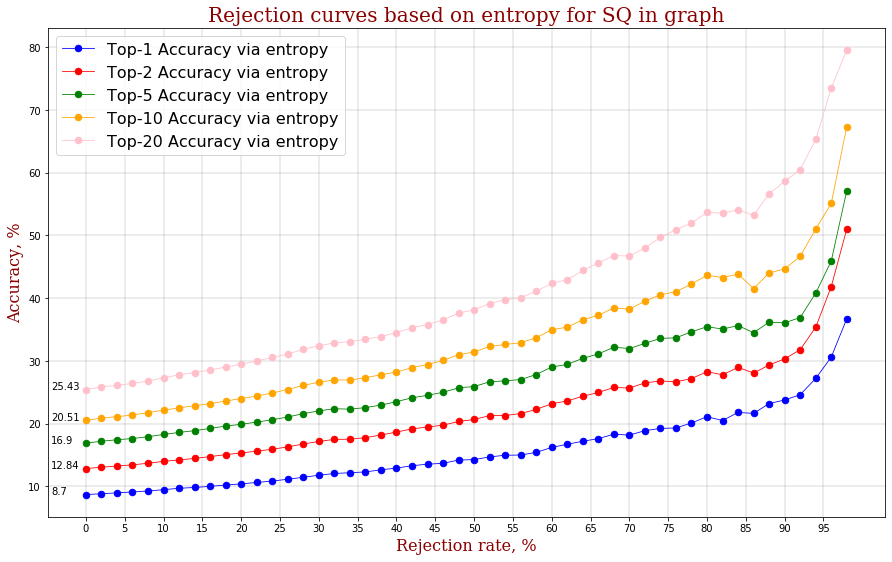

In [37]:
res_entropy, entropies = sinlge_model_ue(name_of_metric="entropy",
                                        name_of_dataset="SQ in graph", 
                                        probas = probas,
                                        predictions = predictions,
                                        num_quantiles = 50,
                                        answers = answers,
                                        top_ks = [1,2,5,10,20],
                                        sample_questions = sample_questions,
                                        plot_rejection_curves=True)

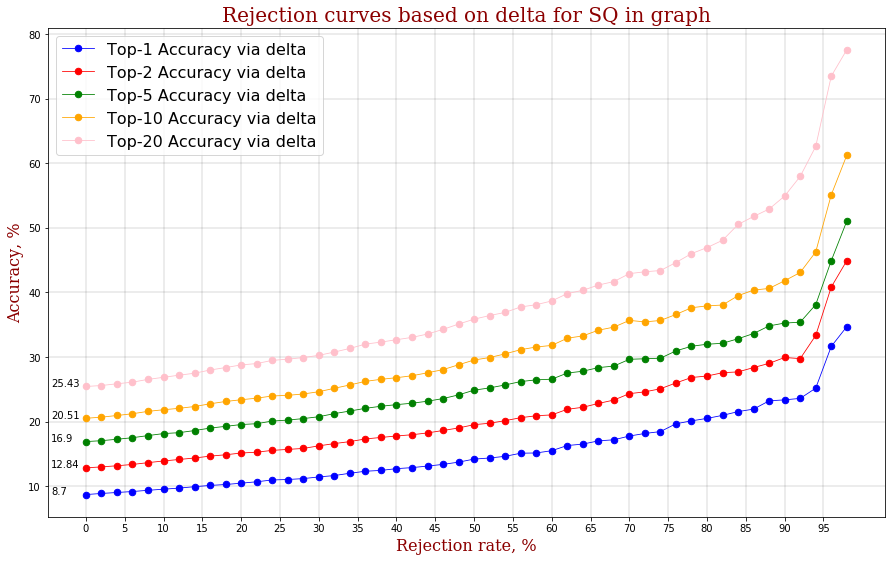

In [38]:
res_delta, deltas = sinlge_model_ue(name_of_metric="delta",
                                    name_of_dataset="SQ in graph", 
                                    probas = probas,
                                    predictions = predictions,
                                    num_quantiles = 50,
                                    answers = answers,
                                    top_ks = [1,2,5,10,20],
                                    sample_questions = sample_questions,
                                    plot_rejection_curves=True)

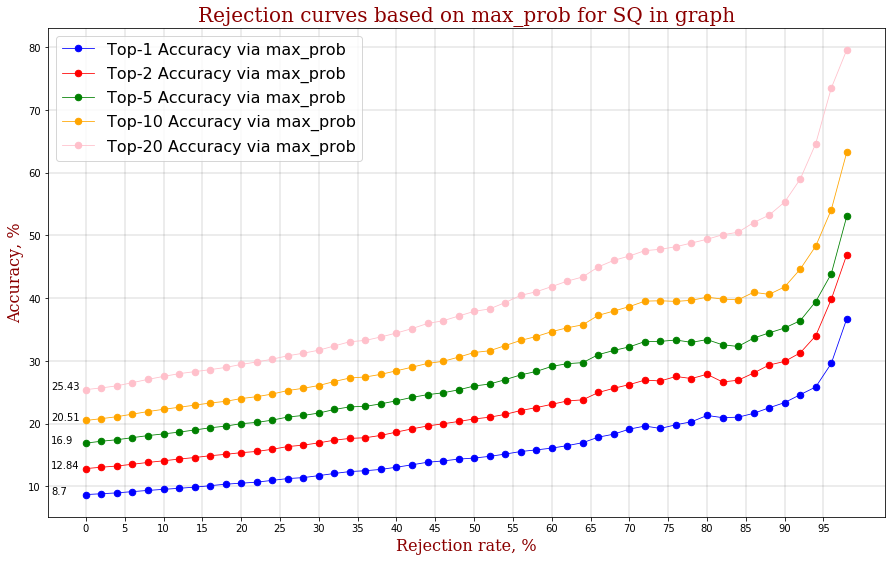

In [39]:
res_maxprob, maxprobs = sinlge_model_ue(name_of_metric="max_prob",
                                        name_of_dataset="SQ in graph", 
                                        probas = probas,
                                        predictions = predictions,
                                        num_quantiles = 50,
                                        answers = answers,
                                        top_ks = [1,2,5,10,20],
                                        sample_questions = sample_questions,
                                        plot_rejection_curves=True)

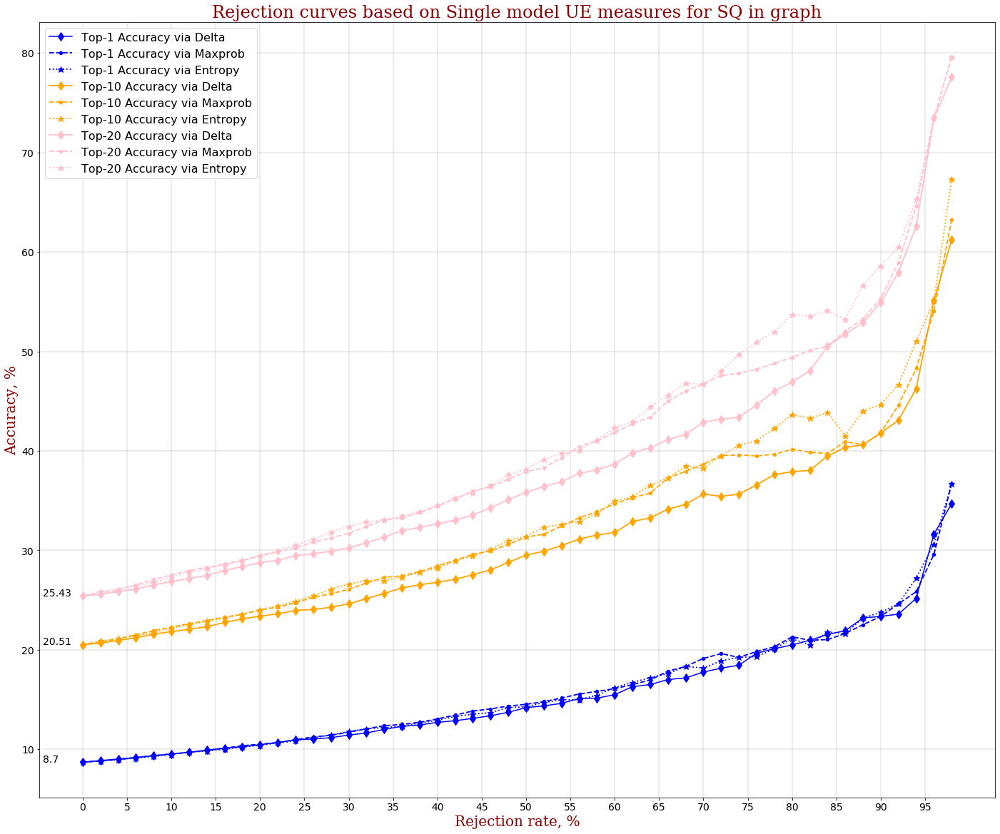

In [40]:
aggregation_plot_sinle_measures(ue_metrics_to_plot = ["delta", "entropy", "max_prob"],
                                top_k_to_plot = [1, 10, 20], name_of_dataset = "SQ in graph",
                                accuracy_for_each_topk_delta = res_delta,
                                accuracy_for_each_topk_entropy = res_entropy,
                                accuracy_for_each_topk_maxprob = res_maxprob)

In [41]:
res = count_AURC_sinle_model_UE(data = single_model_result_sq_in_qraph_bs_20, num_quantiles=num_quantiles)
res

Model Beam Size       UE SQ in graph                                 \
                               top-1 acc top-2 acc top-5 acc top-10 acc   
0  Single        20  entropy      0.1600    0.2242    0.2796     0.3391   
1  Single        20    score      0.1731    0.2355    0.2883     0.3450   
2  Single        20    delta      0.1701    0.2273    0.2774     0.3297   

              
  top-20 acc  
0     0.4197  
1     0.4255  
2     0.4073

# All in 1 functions

## SQ in graph bs20

100%|██████████| 2438/2438 [07:50<00:00,  5.18it/s]


Model Beam Size       UE SQ in graph                                 \
                               top-1 acc top-2 acc top-5 acc top-10 acc   
0  Single        20  entropy      0.1500    0.2109    0.2645     0.3209   
1  Single        20    score      0.1510    0.2102    0.2617     0.3144   
2  Single        20    delta      0.1483    0.2025    0.2508     0.2995   

              
  top-20 acc  
0     0.3965  
1     0.3877  
2     0.3711

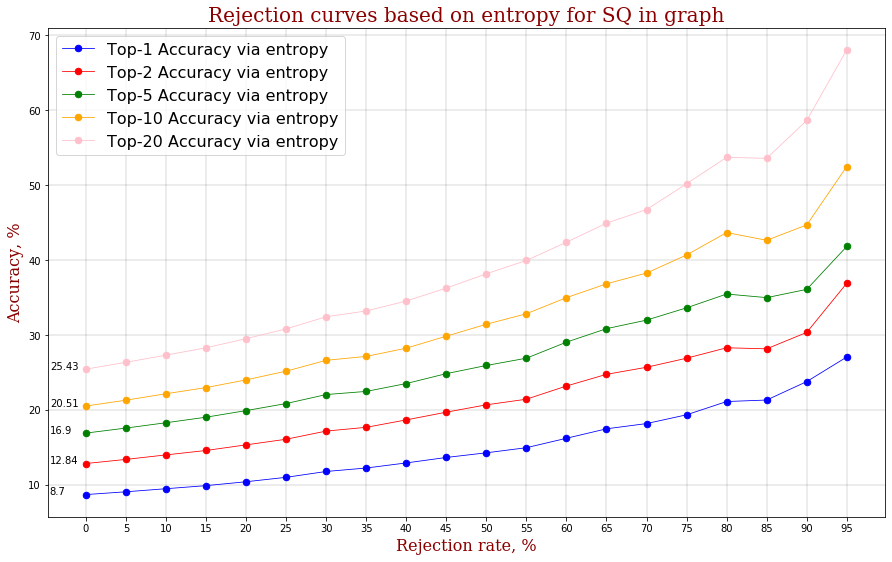

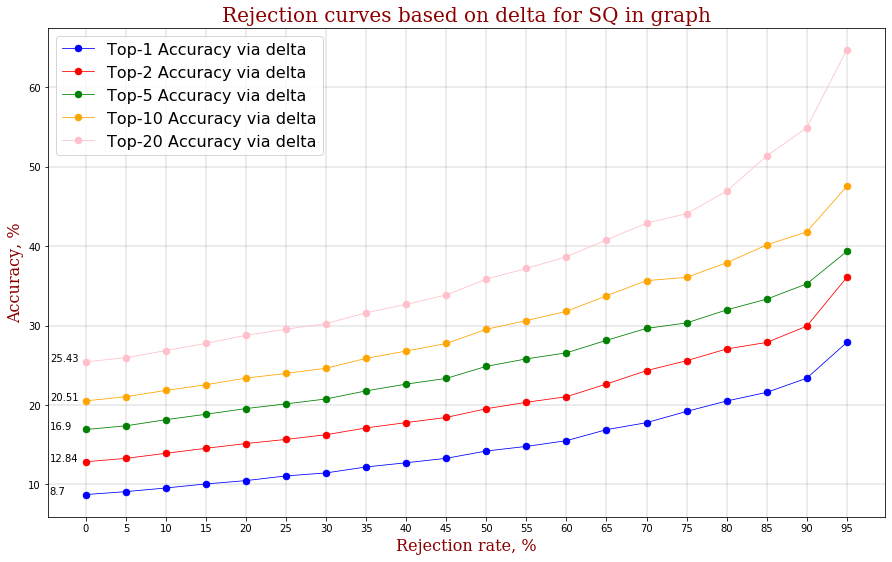

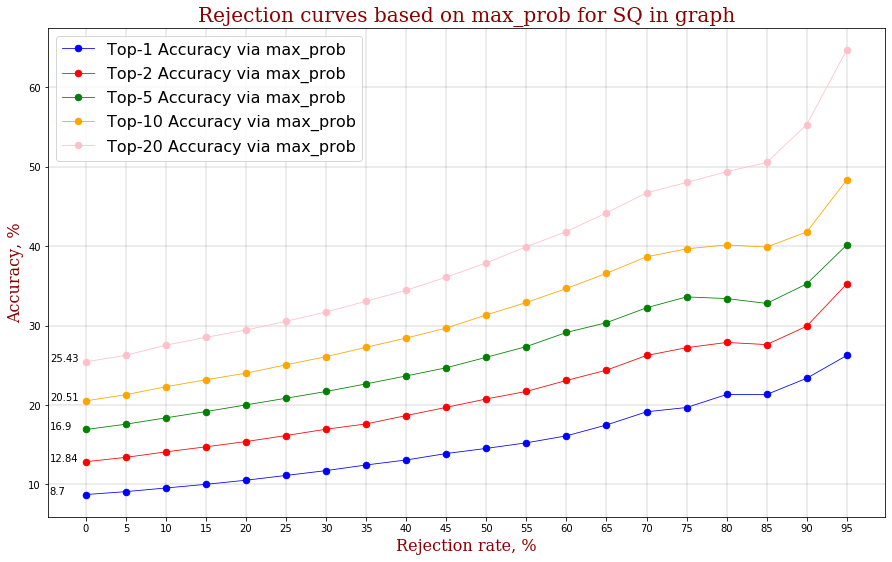

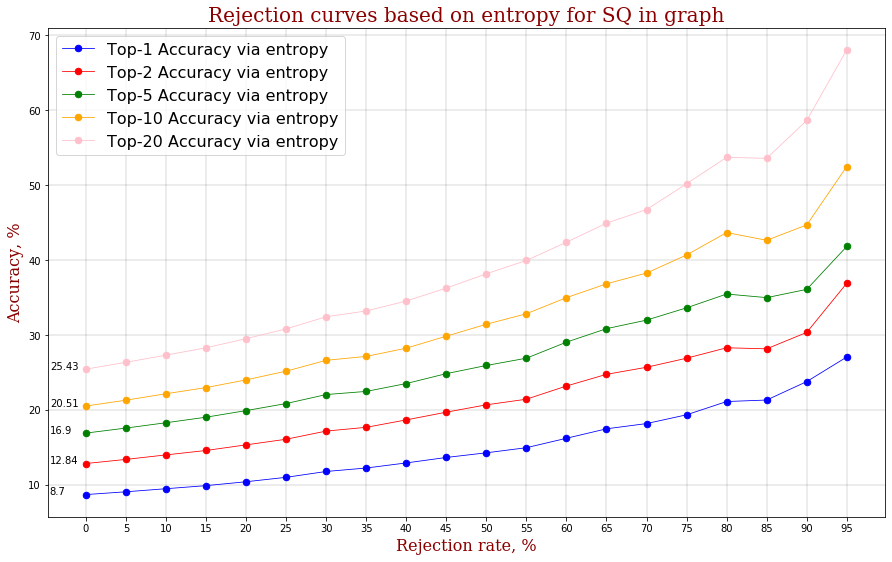

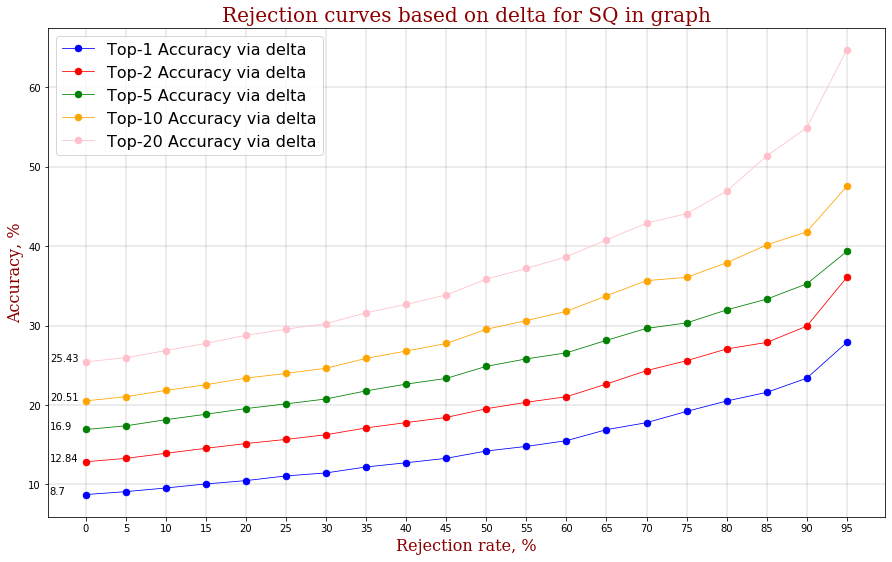

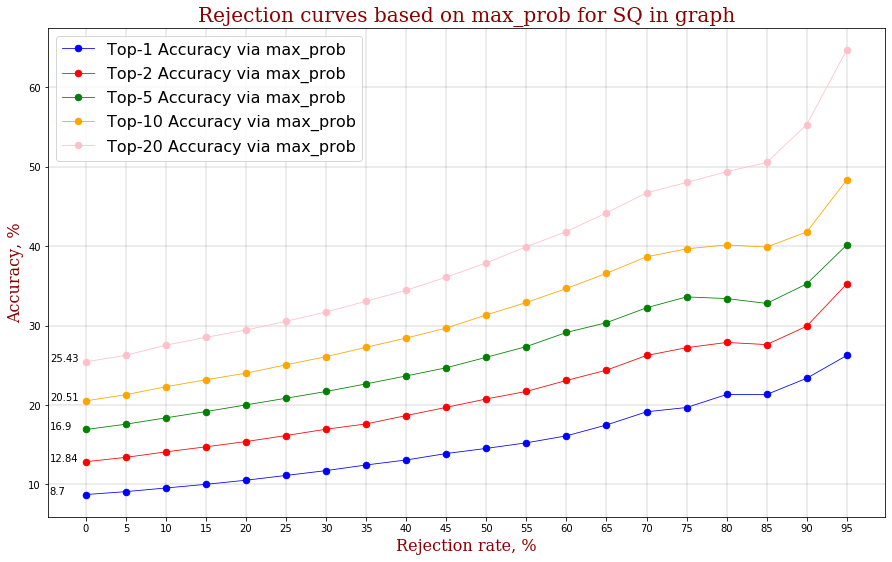

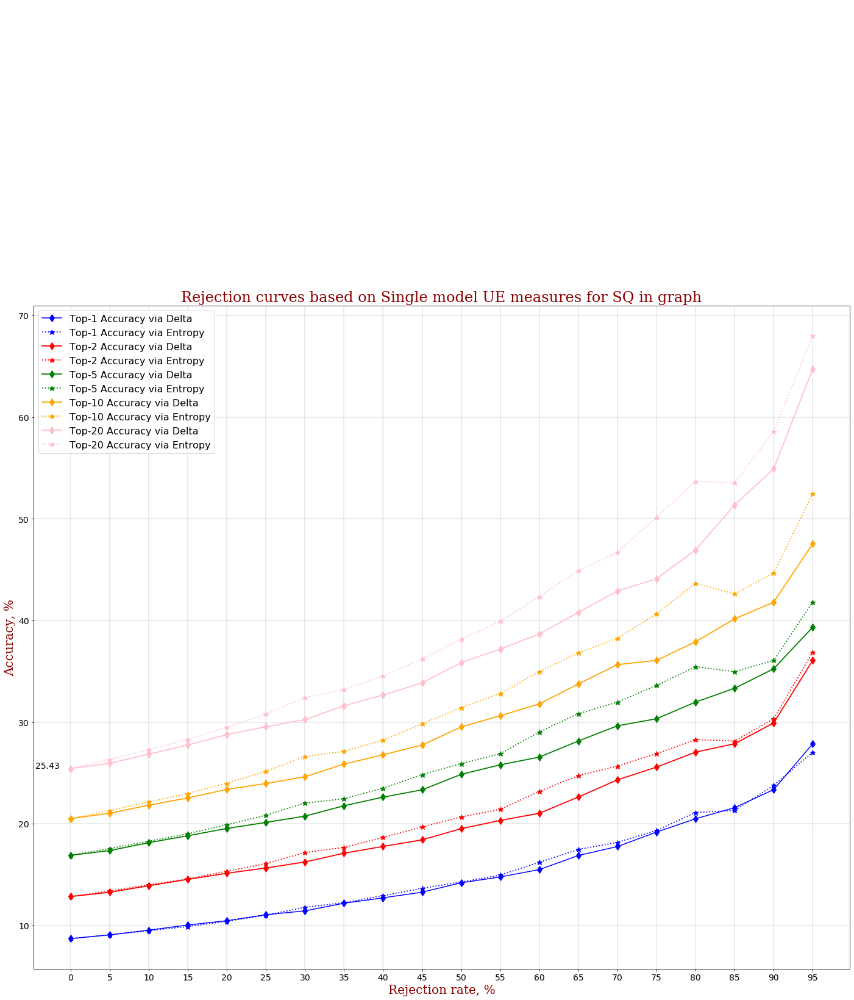

In [79]:
######################### <- HERE DETERMINE DATA 

########## load data
sq_mask = np.load("sq_mask_present_in_graph.npy")
sq_test = list(np.load("simple_questions_test.npy")[:,3])
sq_test_answers = np.array([[el] for el in list(np.load("simple_questions_test.npy")[:,2])])

########## mask for data (sq in graph)
sq_test = list(compress(sq_test, sq_mask))
sq_test_answers = np.array(list((compress(sq_test_answers, sq_mask))))

sample_questions = len(sq_test)
questions = sq_test[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "SQ in graph"
num_quantiles = 20
num_beams = 20
answers = sq_test_answers
top_ks = [1, 2, 5, 10, 20]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_SQ_IN_GRAPH_TEST_BS_20"


# with open(f'single_model_result_sq_in_qraph_bs_20.pickle', 'rb') as handle:
#     data = pickle.load(handle)

res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10, 20],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = 20,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = 20,
    top_ks = [1,2,5,10,20],
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ",
    plot_all = True)

res

## SQ in graph bs10

100%|██████████| 2438/2438 [07:27<00:00,  5.45it/s]


Model Beam Size       UE SQ in graph                               
                               top-1 acc top-2 acc top-5 acc top-10 acc
0  Single        10  entropy      0.1492    0.2088    0.2785     0.3475
1  Single        10    score      0.1510    0.2079    0.2759     0.3418
2  Single        10    delta      0.1475    0.2002    0.2651     0.3279

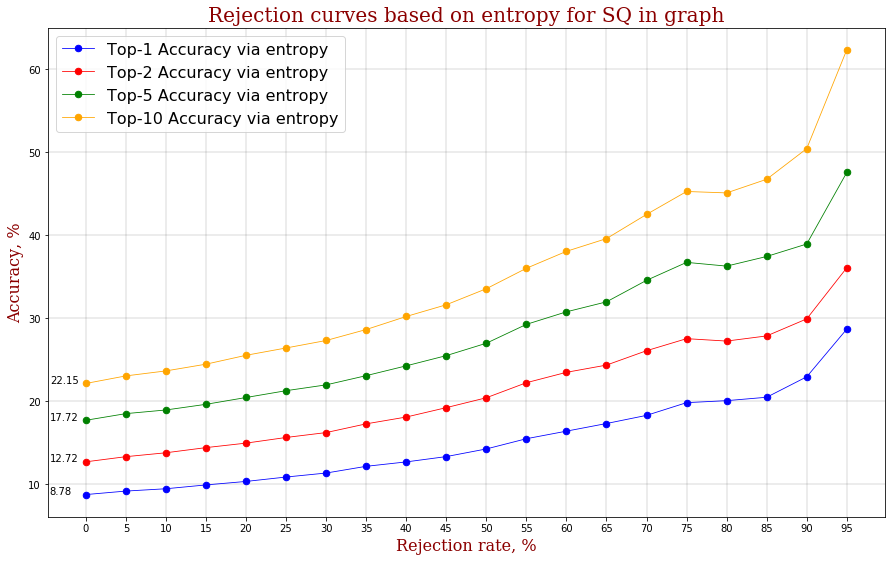

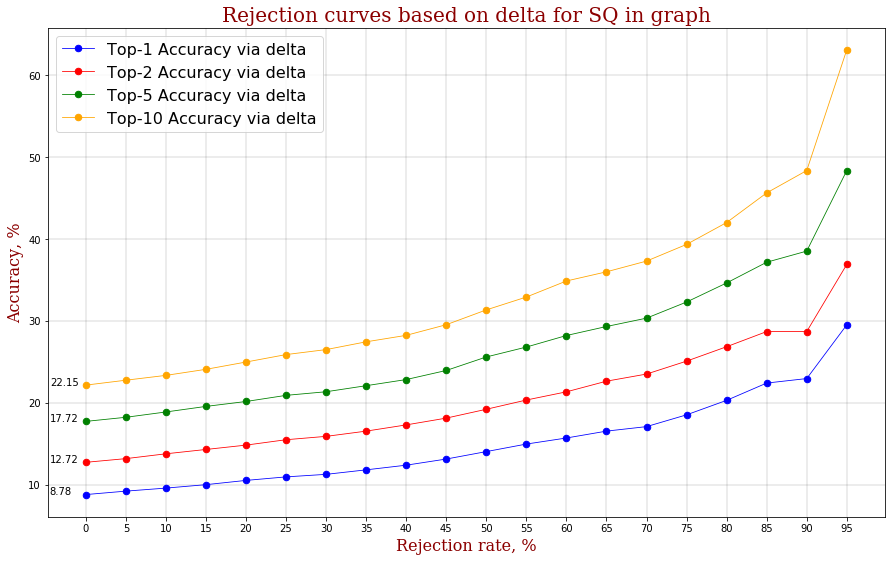

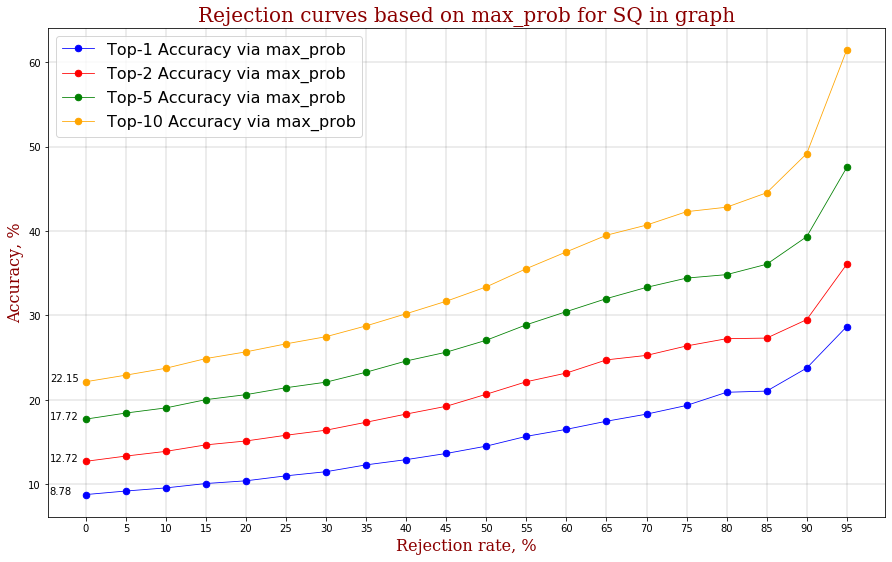

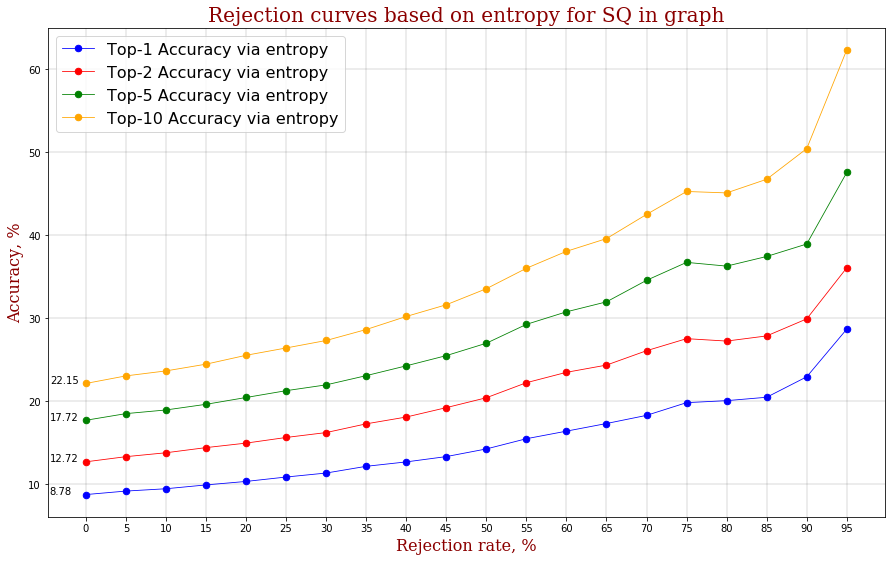

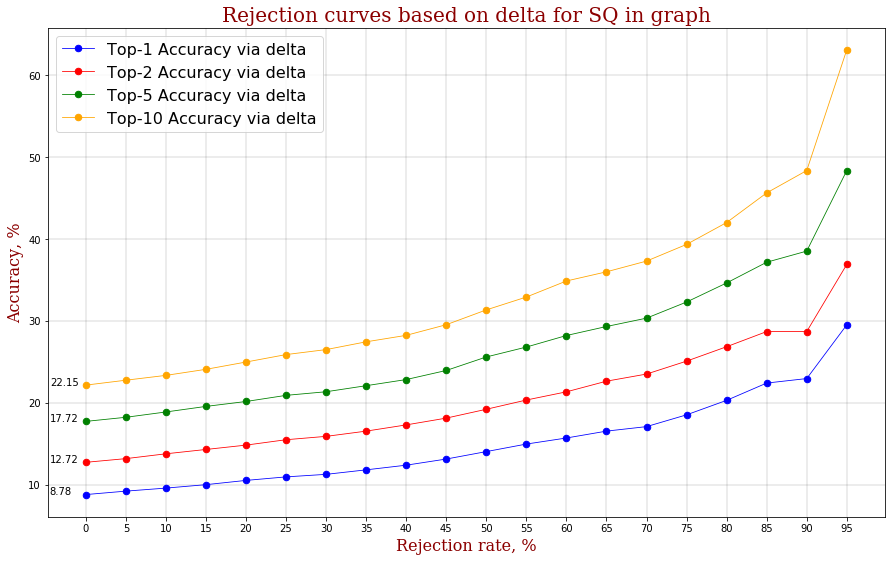

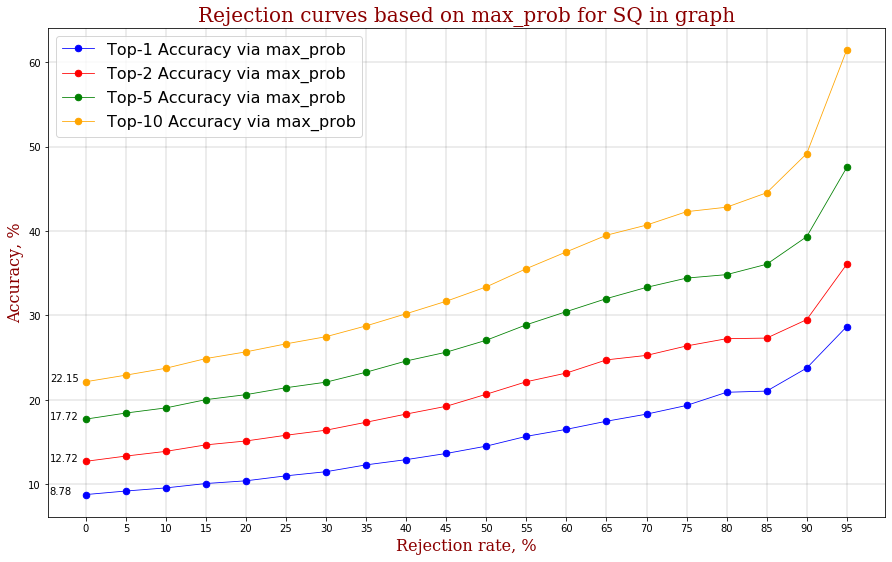

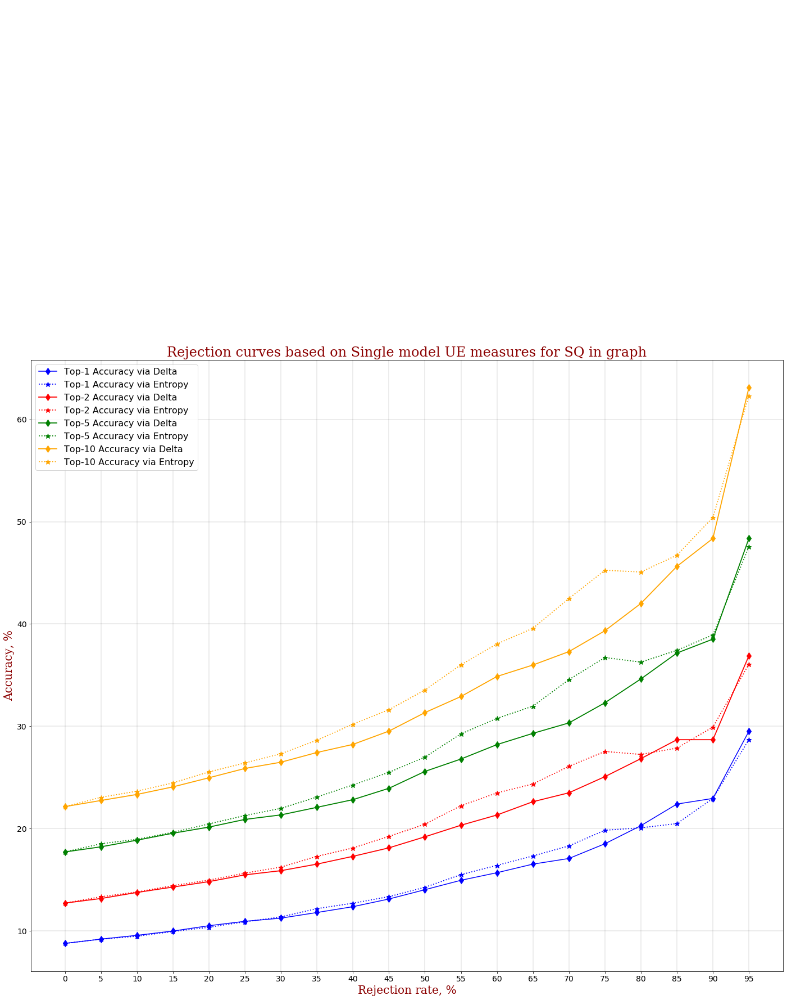

In [80]:
######################### <- HERE DETERMINE DATA 

########## load data
sq_mask = np.load("sq_mask_present_in_graph.npy")
sq_test = list(np.load("simple_questions_test.npy")[:,3])
sq_test_answers = np.array([[el] for el in list(np.load("simple_questions_test.npy")[:,2])])

########## mask for data (sq in graph)
sq_test = list(compress(sq_test, sq_mask))
sq_test_answers = np.array(list((compress(sq_test_answers, sq_mask))))

sample_questions = len(sq_test)
questions = sq_test[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "SQ in graph"
num_quantiles = 20
num_beams = 10
answers = sq_test_answers
top_ks = [1, 2, 5, 10]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_SQ_IN_GRAPH_TEST_BS_10"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res

## SQ full test bs20

Model Beam Size       UE SQ full test                                 \
                                top-1 acc top-2 acc top-5 acc top-10 acc   
0  Single        20  entropy       0.1608    0.2245    0.2973     0.3646   
1  Single        20    score       0.1606    0.2220    0.2920     0.3566   
2  Single        20    delta       0.1577    0.2146    0.2808     0.3415   

              
  top-20 acc  
0     0.4472  
1     0.4374  
2     0.4192

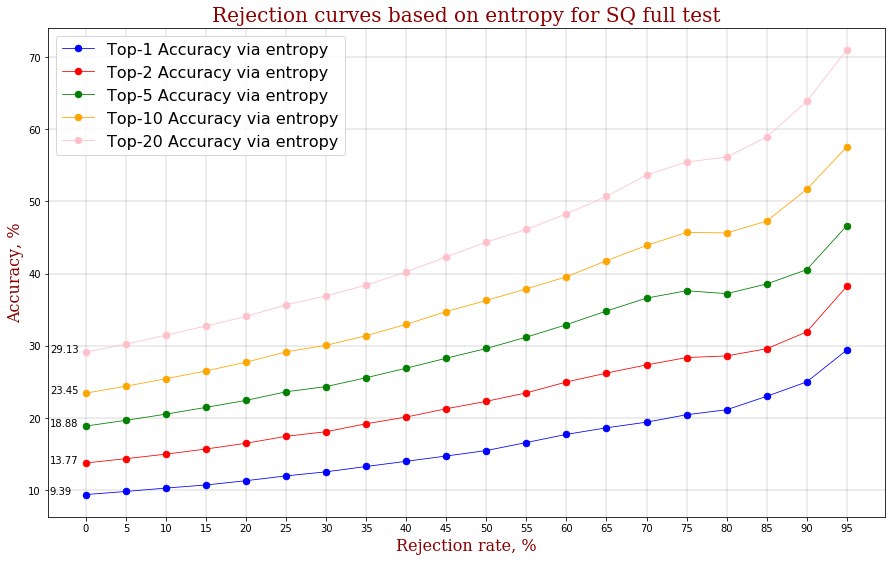

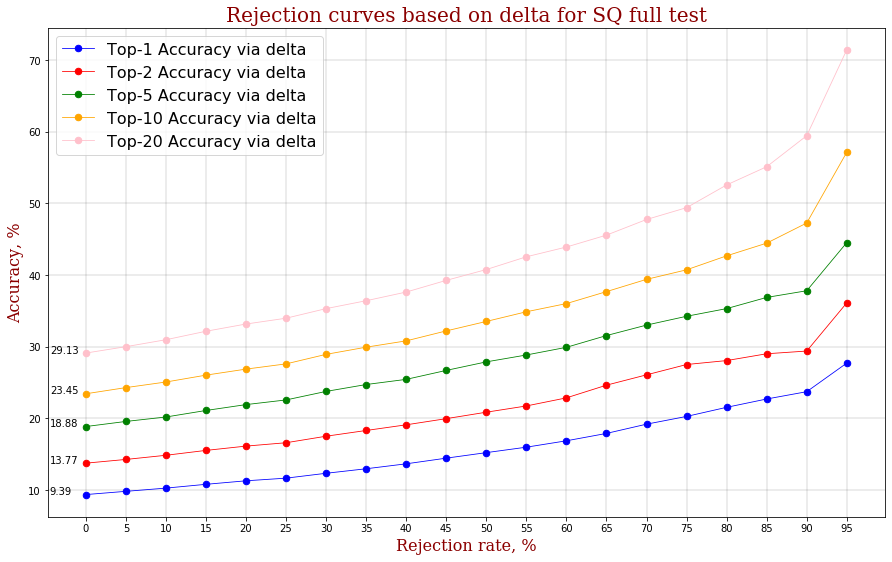

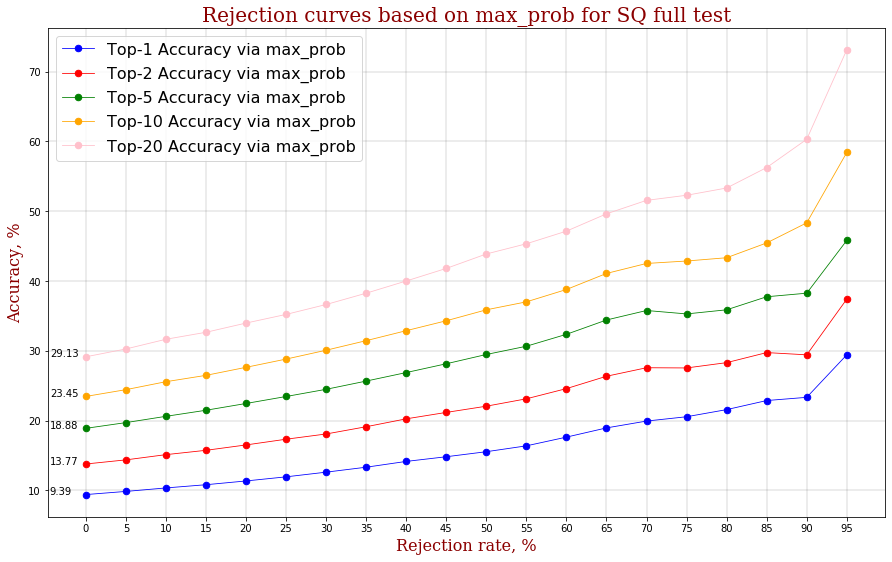

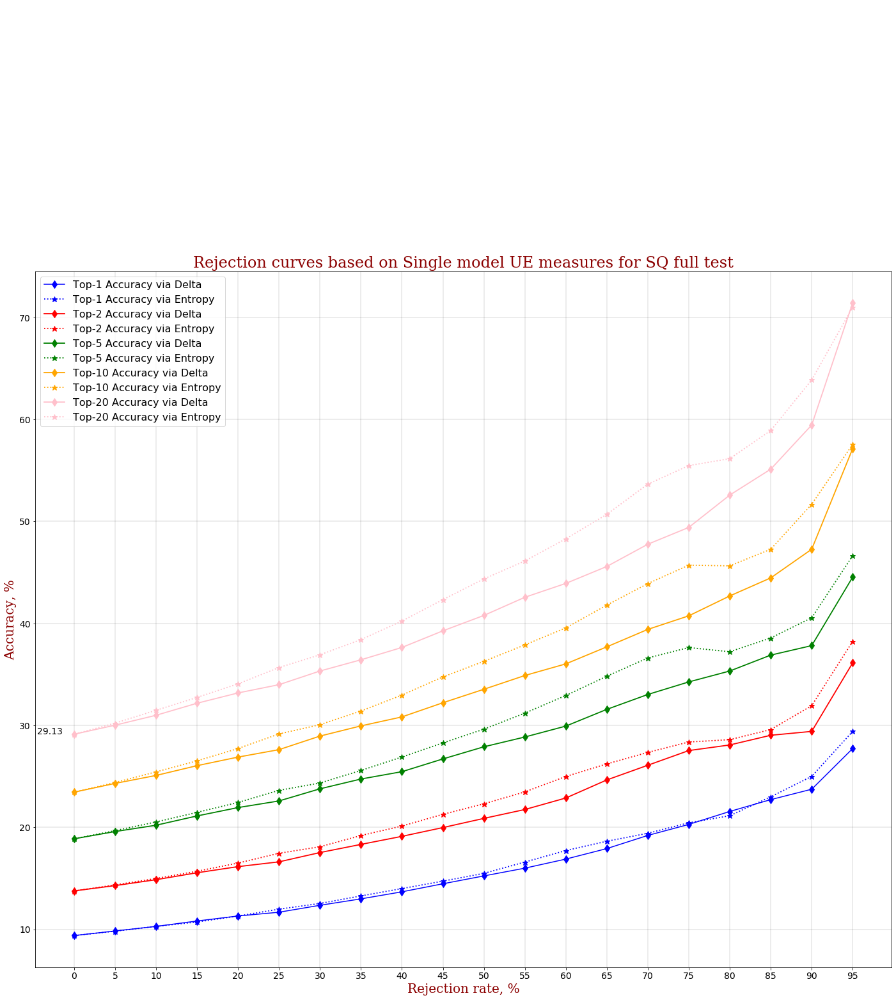

In [73]:
######################### <- HERE DETERMINE DATA 

########## load data

sq_test = list(np.load("simple_questions_test.npy")[:,3])
sq_test_answers = np.array([[el] for el in list(np.load("simple_questions_test.npy")[:,2])])


sample_questions = len(sq_test)
questions = sq_test[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "SQ full test"
num_quantiles = 20
num_beams = 20
answers = sq_test_answers[:sample_questions]
top_ks = [1, 2, 5, 10, 20]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_SQ_FULL_TEST_BS_20"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10, 20],
    need_fitting = False,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res

## SQ full test bs10

100%|██████████| 4751/4751 [13:59<00:00,  5.66it/s]


Model Beam Size       UE SQ full test                               
                                top-1 acc top-2 acc top-5 acc top-10 acc
0  Single        10  entropy       0.1574    0.2237    0.3047     0.3841
1  Single        10    score       0.1583    0.2224    0.3012     0.3784
2  Single        10    delta       0.1545    0.2141    0.2899     0.3634

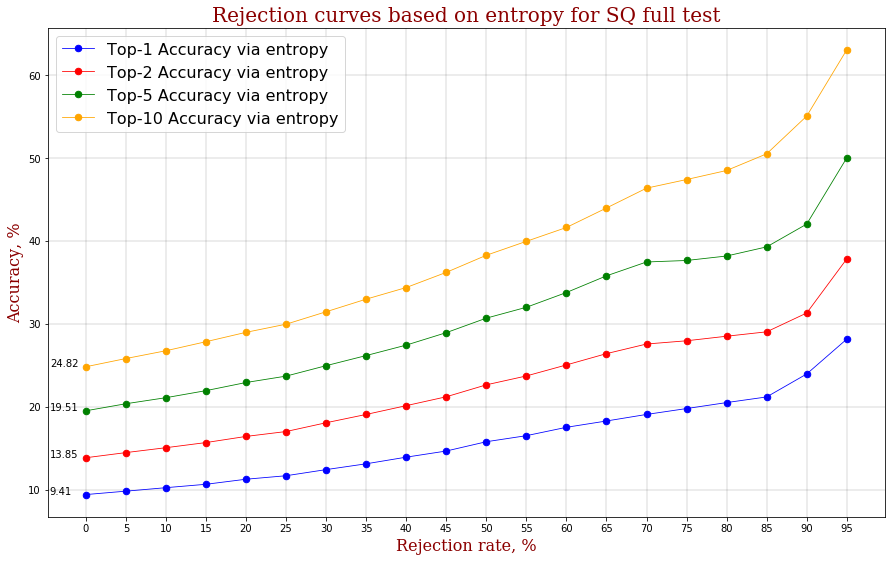

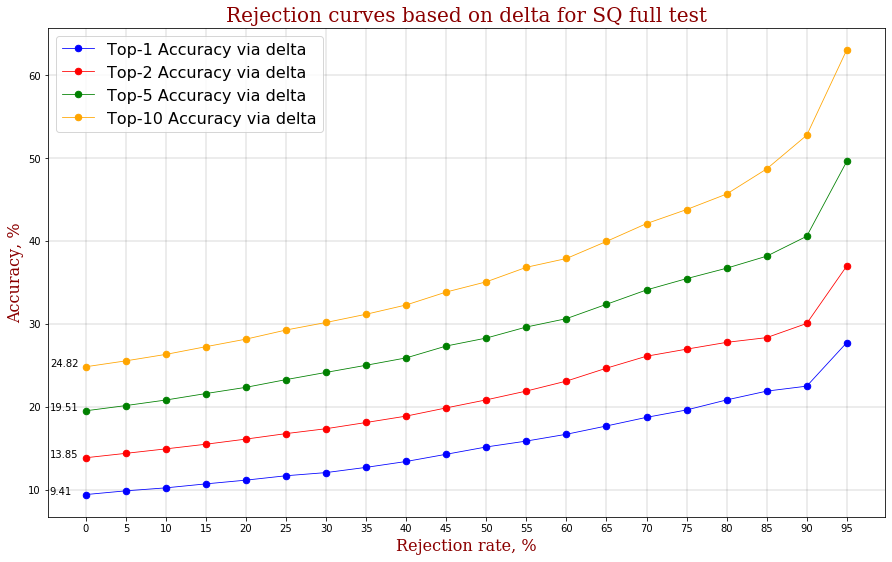

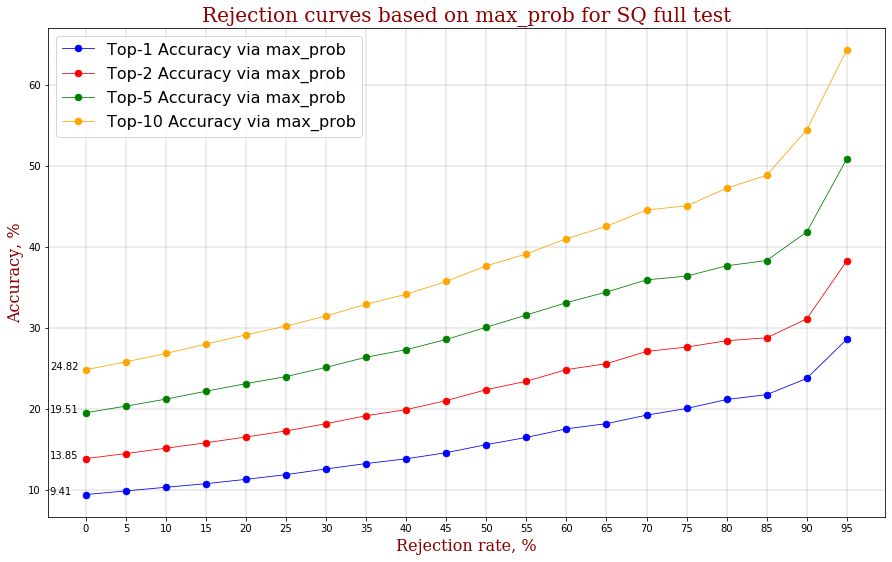

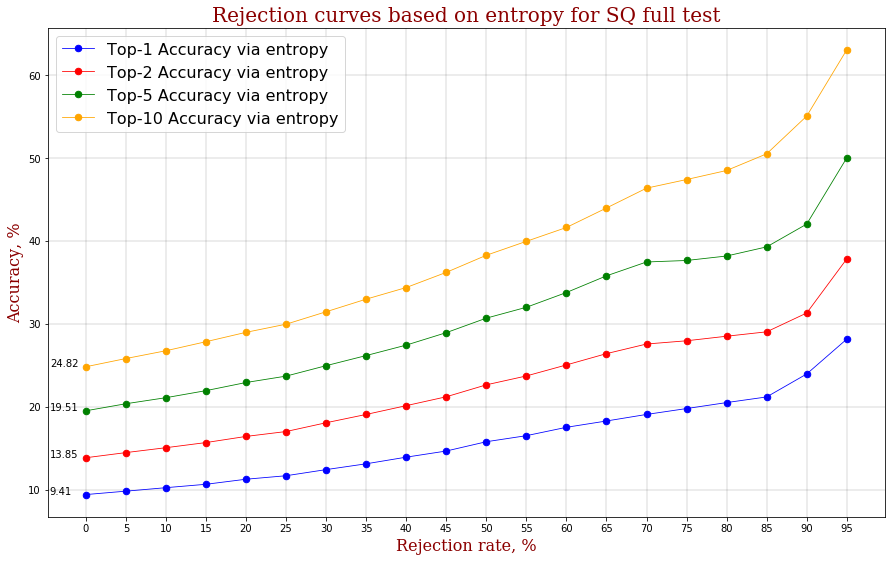

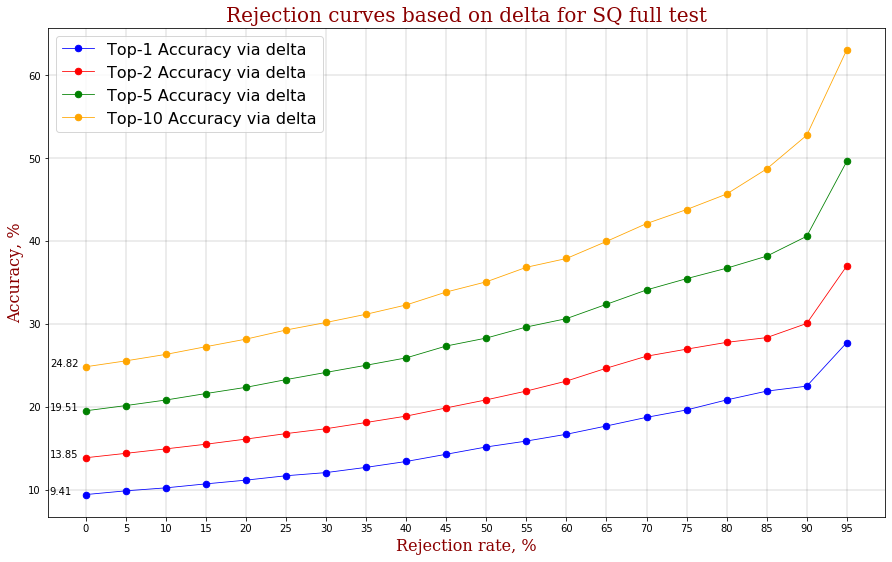

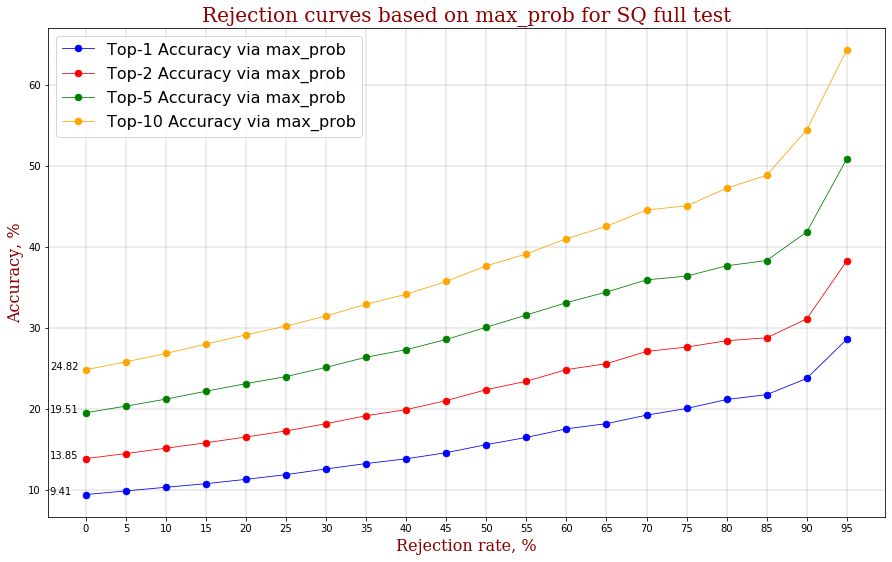

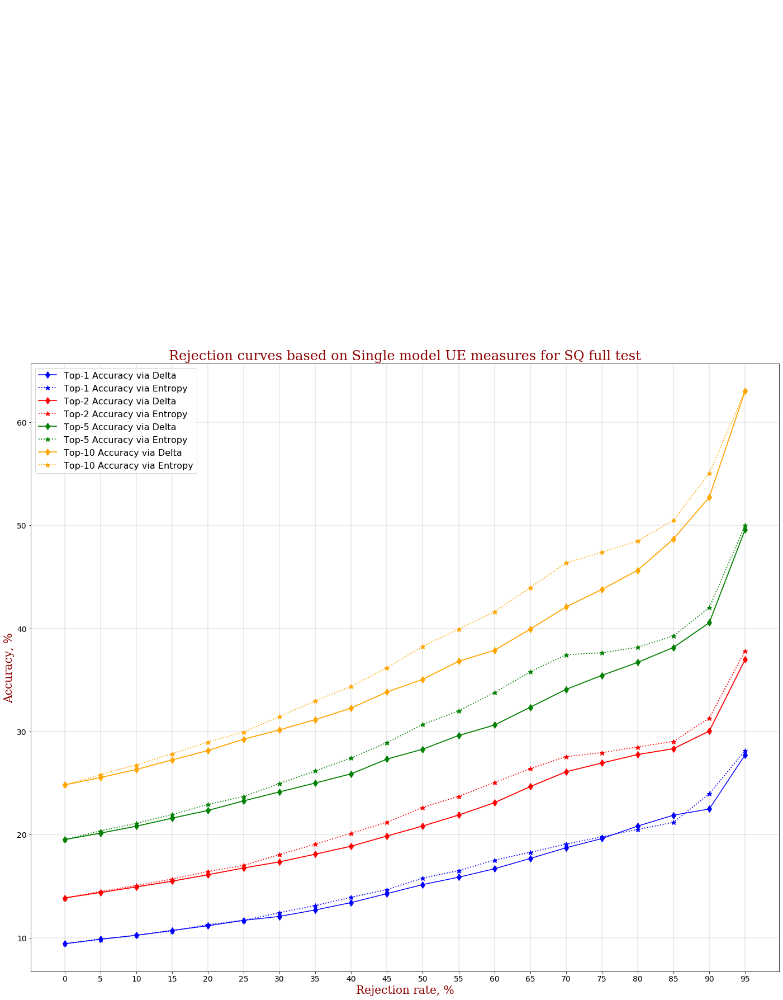

In [74]:
######################### <- HERE DETERMINE DATA 

########## load data

sq_test = list(np.load("simple_questions_test.npy")[:,3])
sq_test_answers = np.array([[el] for el in list(np.load("simple_questions_test.npy")[:,2])])


sample_questions = len(sq_test)
questions = sq_test[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "SQ full test"
num_quantiles = 20
num_beams = 10
answers = sq_test_answers
top_ks = [1, 2, 5, 10]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_SQ_FULL_TEST_BS_10"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res

# RuBQ 1hop bs 20

100%|██████████| 1186/1186 [04:14<00:00,  4.66it/s]


Model Beam Size       UE RUBQ2_1hop_test                                 \
                                   top-1 acc top-2 acc top-5 acc top-10 acc   
0  Single        20  entropy          0.5508    0.6052    0.6665     0.6978   
1  Single        20    score          0.5584    0.6104    0.6683     0.6983   
2  Single        20    delta          0.5583    0.6025    0.6544     0.6835   

              
  top-20 acc  
0     0.7408  
1     0.7405  
2     0.7264

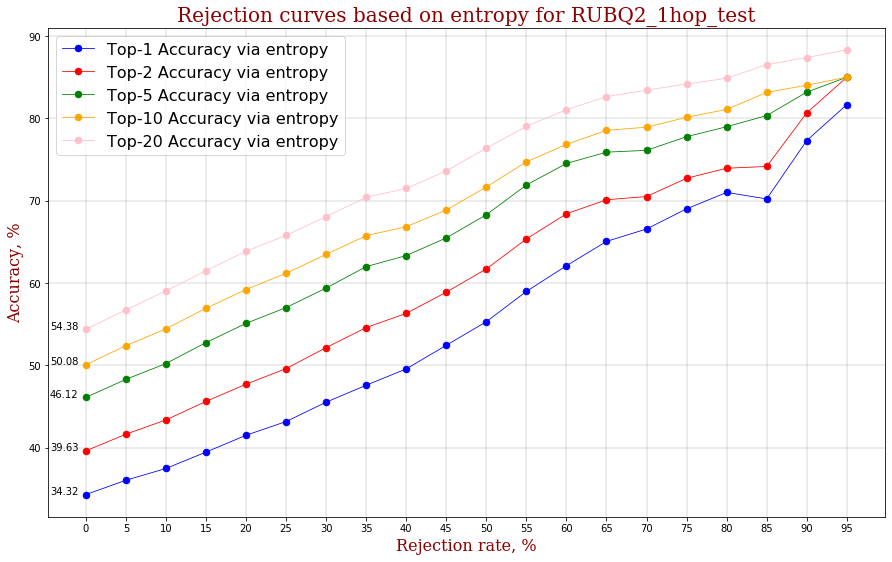

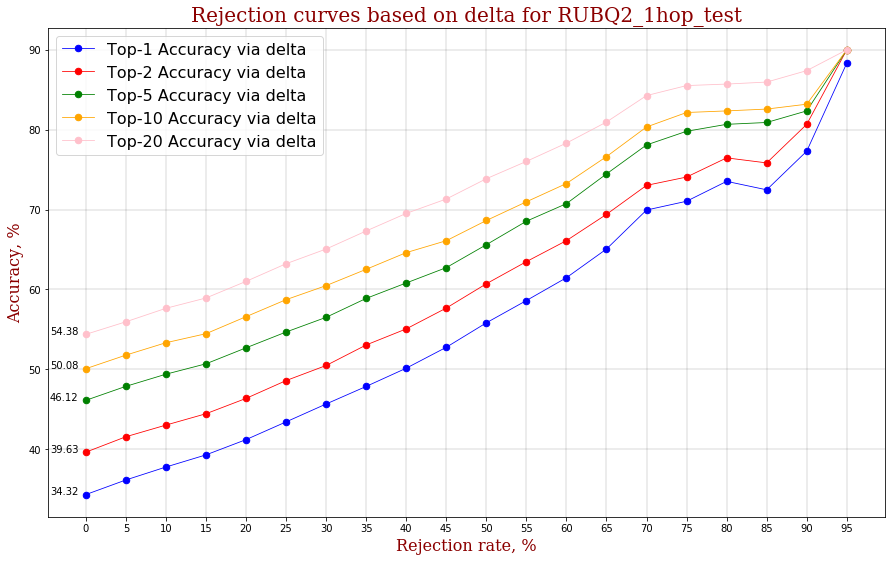

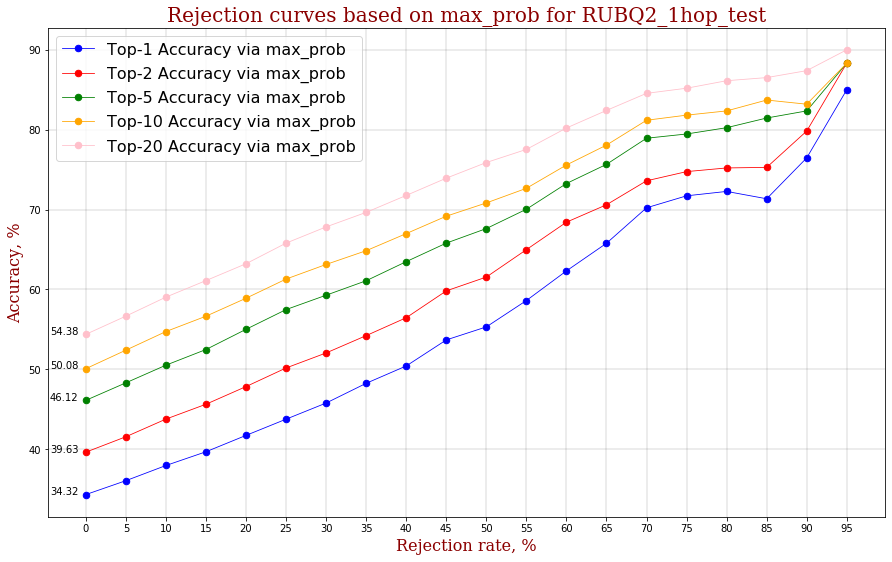

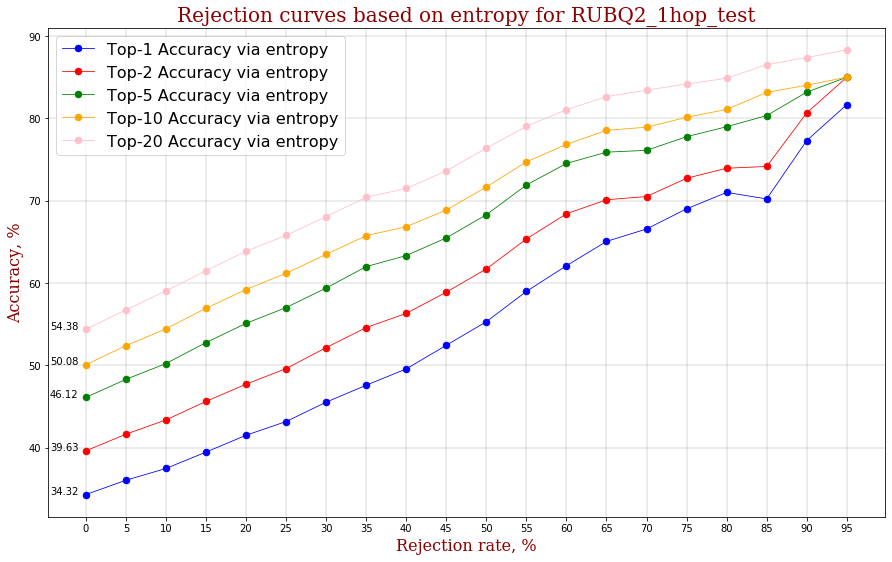

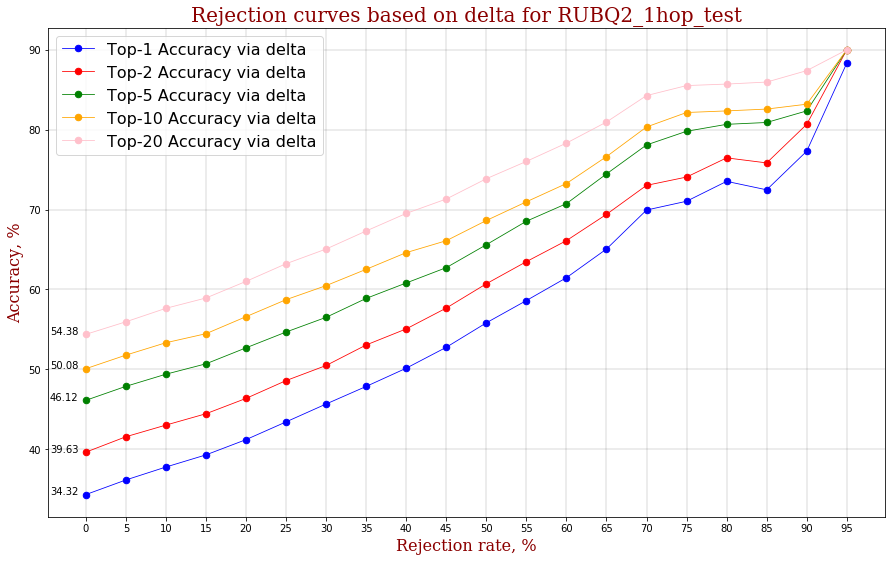

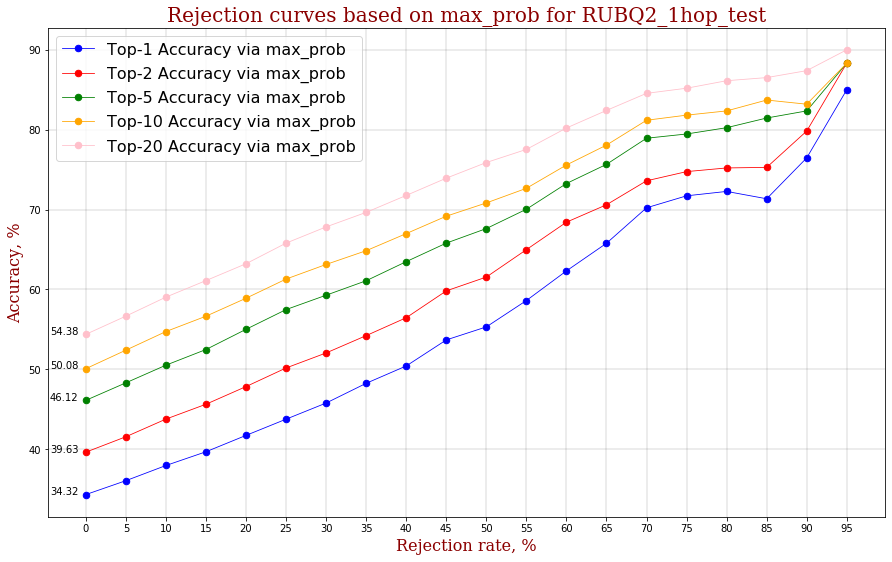

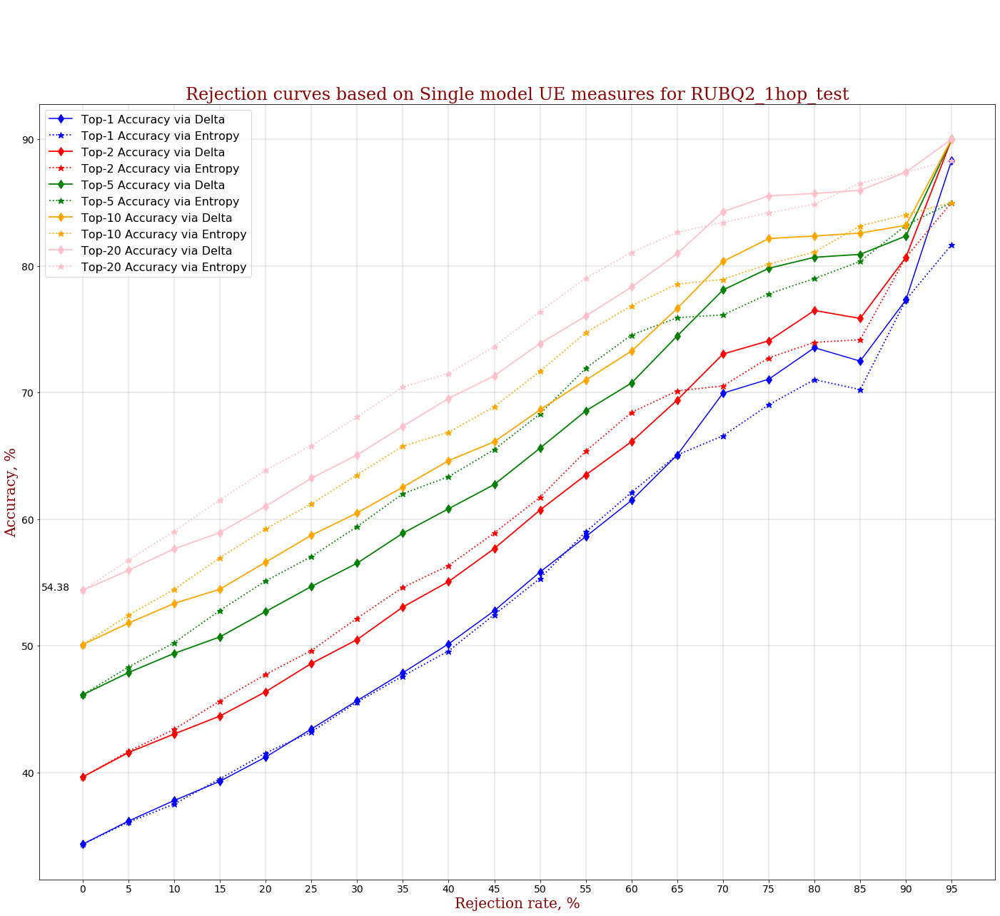

In [75]:
######################### <- HERE DETERMINE DATA 

########## load data

rubq_test = np.load("all_EN_rubq_test_questions_1_hop_uri.npy")
rubq_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
entities_test_rubq = np.load("entities_test_rubq.npy")
rubq_test_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
rubq_test = pd.DataFrame({"subject":entities_test_rubq, "question":rubq_test})

sample_questions = len(list(rubq_test.question))
questions = list(rubq_test.question)[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_1hop_test"
num_quantiles = 20
num_beams = 20
answers = list(rubq_test_answers)
top_ks = [1, 2, 5, 10, 20]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10, 20],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res

# RuBQ 1hop bs 10

100%|██████████| 1186/1186 [04:02<00:00,  4.89it/s]


Model Beam Size       UE RUBQ2_1hop_test                               
                                   top-1 acc top-2 acc top-5 acc top-10 acc
0  Single        10  entropy          0.5522    0.6040    0.6603     0.7119
1  Single        10    score          0.5569    0.6052    0.6585     0.7082
2  Single        10    delta          0.5559    0.5986    0.6490     0.6975

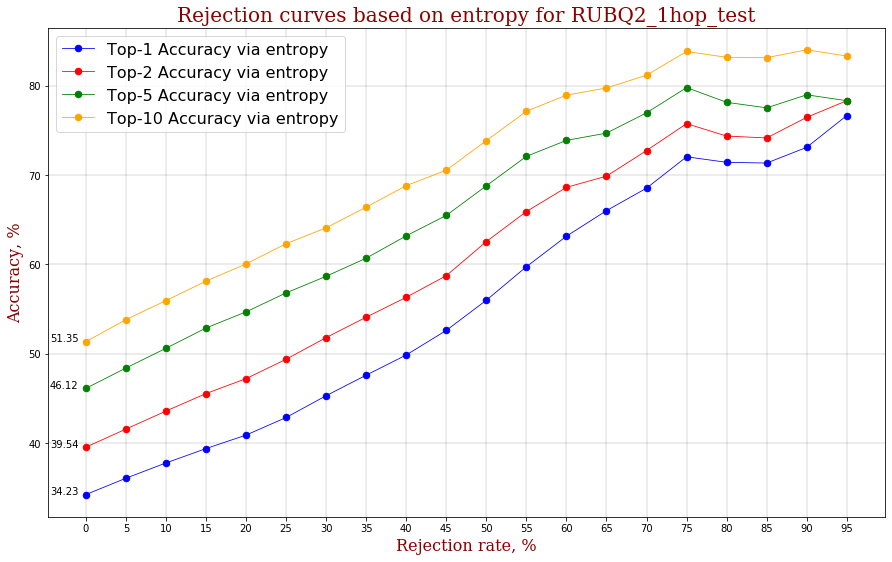

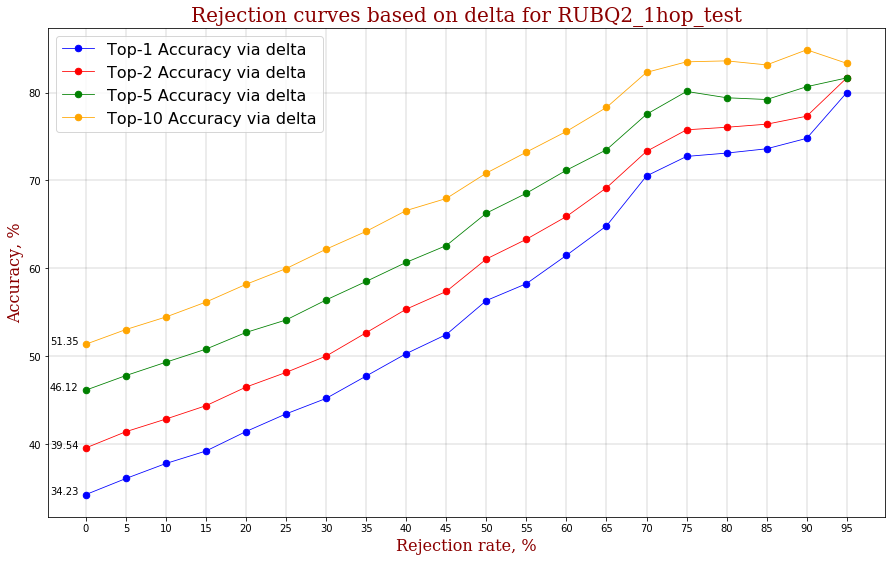

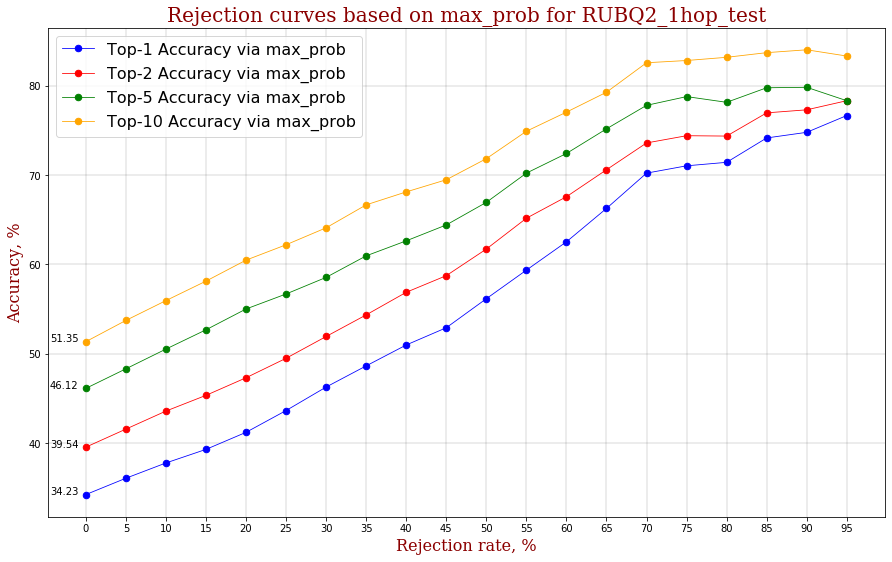

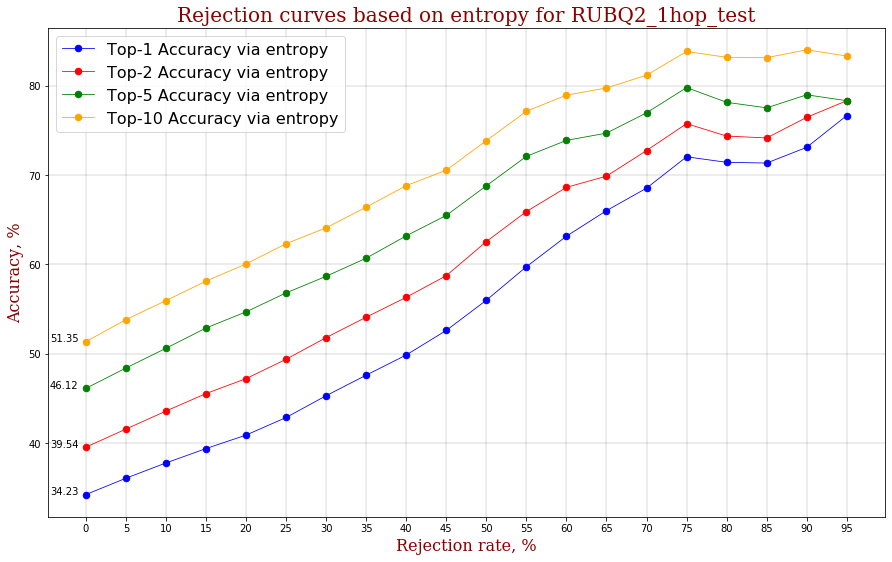

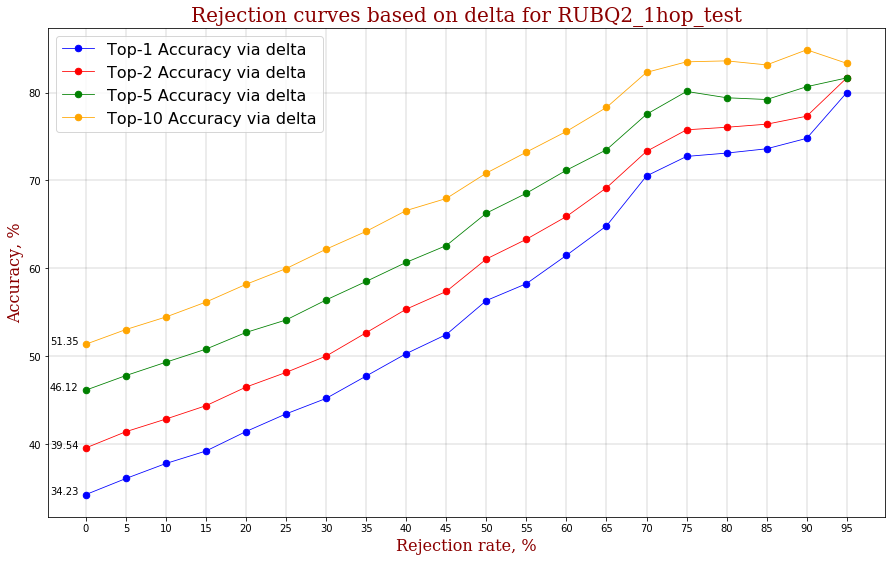

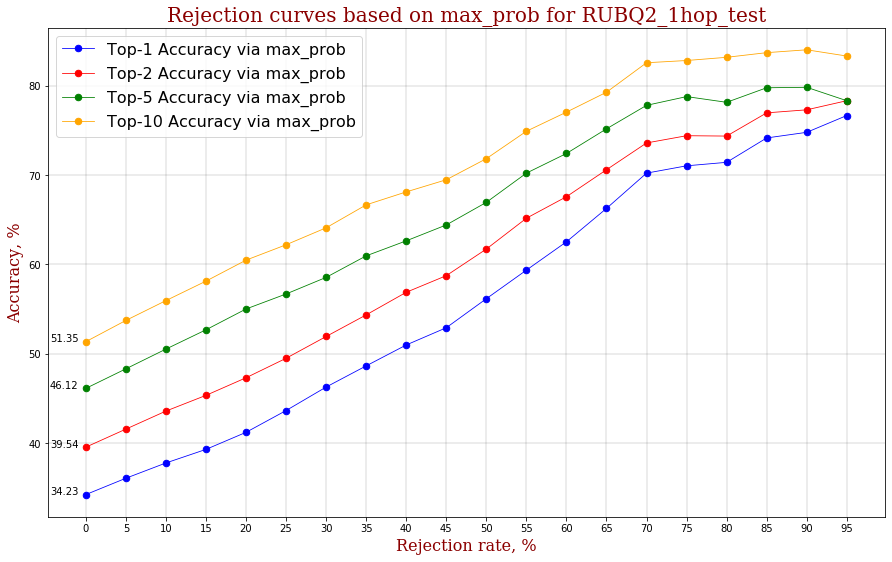

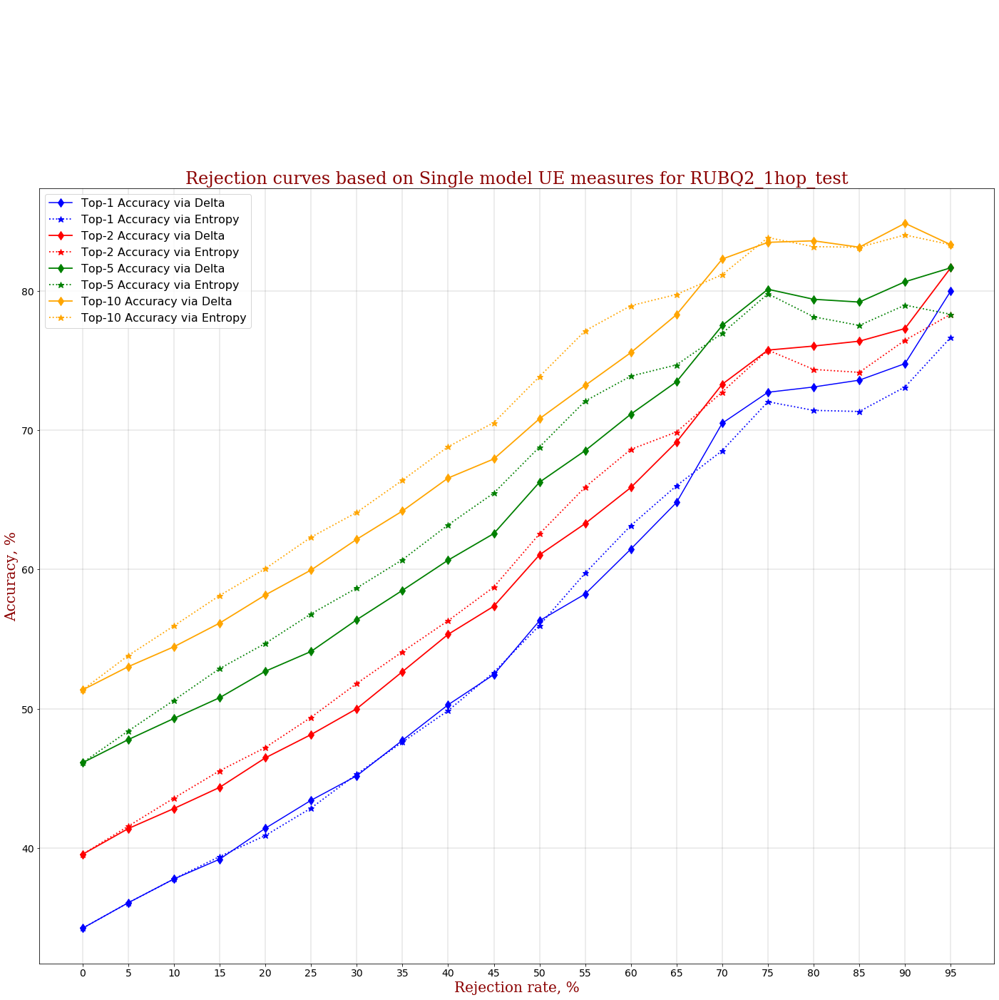

In [76]:
######################### <- HERE DETERMINE DATA 

########## load data

rubq_test = np.load("all_EN_rubq_test_questions_1_hop_uri.npy")
rubq_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
entities_test_rubq = np.load("entities_test_rubq.npy")
rubq_test_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
rubq_test = pd.DataFrame({"subject":entities_test_rubq, "question":rubq_test})

sample_questions = len(list(rubq_test.question))
questions = list(rubq_test.question)[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_1hop_test"
num_quantiles = 20
num_beams = 10
answers = list(rubq_test_answers)
top_ks = [1, 2, 5, 10]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_RUBQ2_1HOP_TEST_BS10"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res

# RuBQ full bs 20

Full test RuBQ 2.0 length = 1809 questions


100%|██████████| 1809/1809 [06:23<00:00,  4.71it/s]


Model Beam Size       UE RUBQ2_full_test                                 \
                                   top-1 acc top-2 acc top-5 acc top-10 acc   
0  Single        20  entropy          0.4560    0.5048    0.5571     0.5831   
1  Single        20    score          0.4627    0.5093    0.5577     0.5826   
2  Single        20    delta          0.4621    0.5019    0.5455     0.5688   

              
  top-20 acc  
0     0.6239  
1     0.6225  
2     0.6085

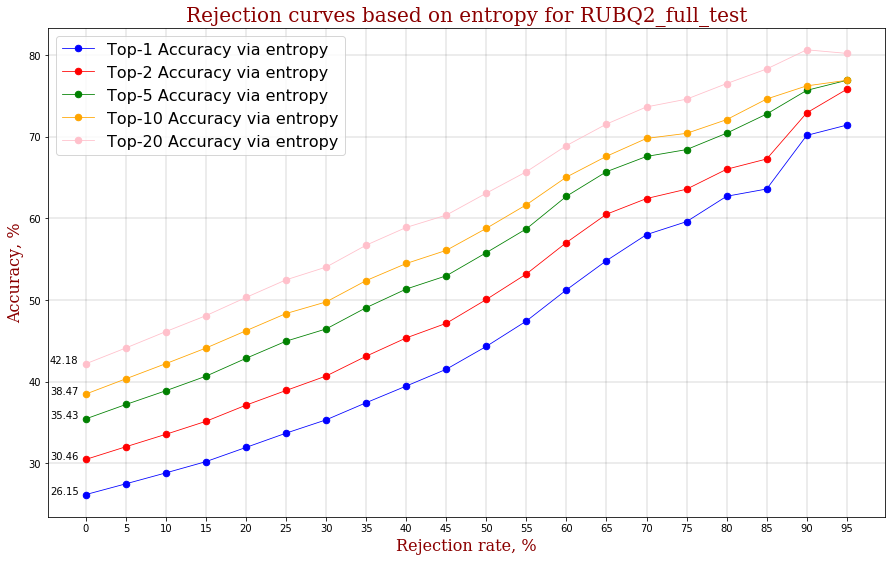

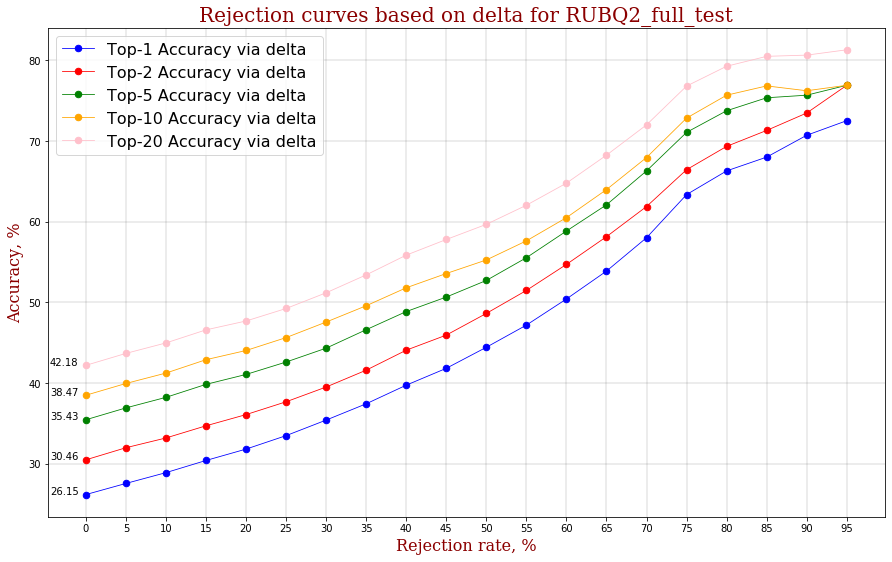

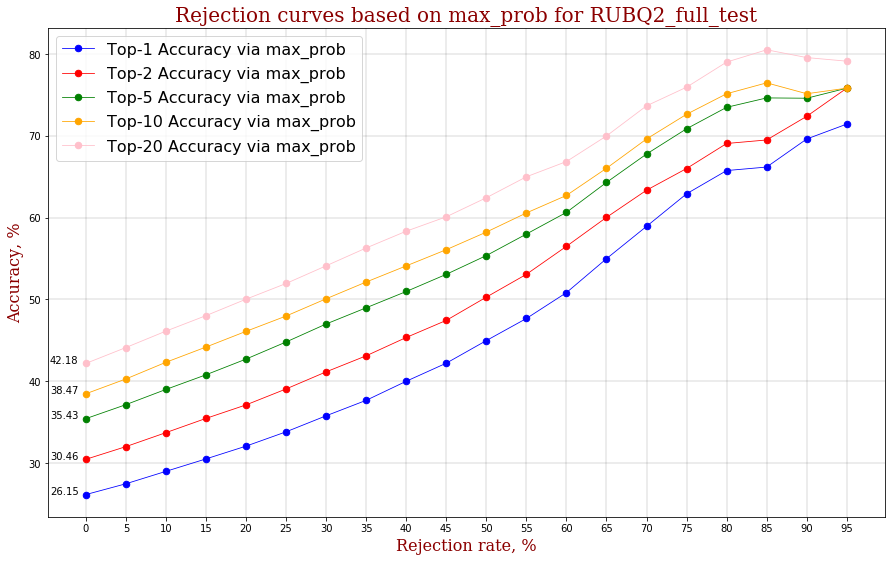

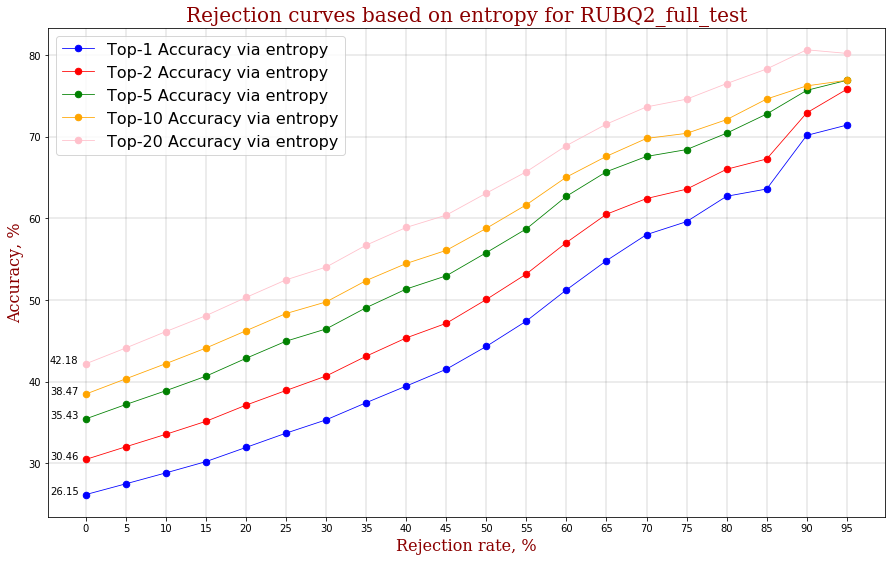

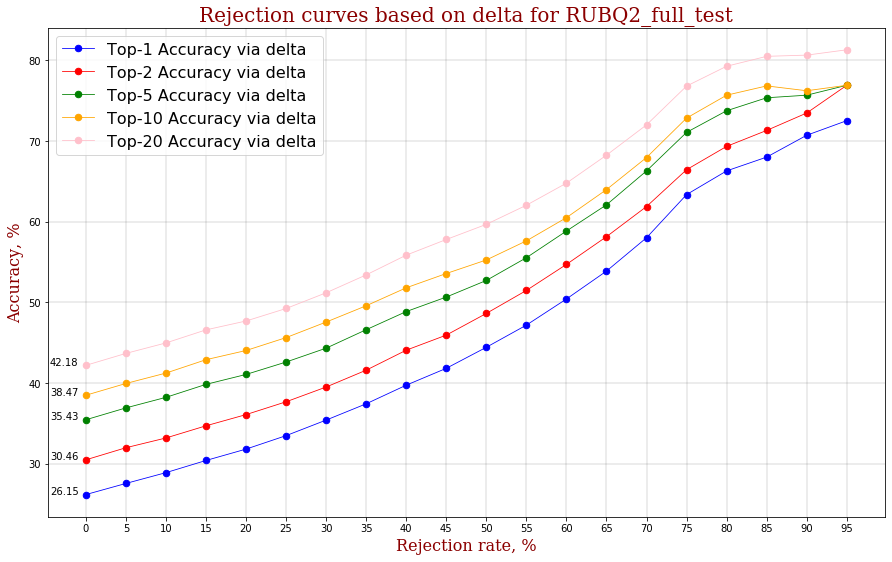

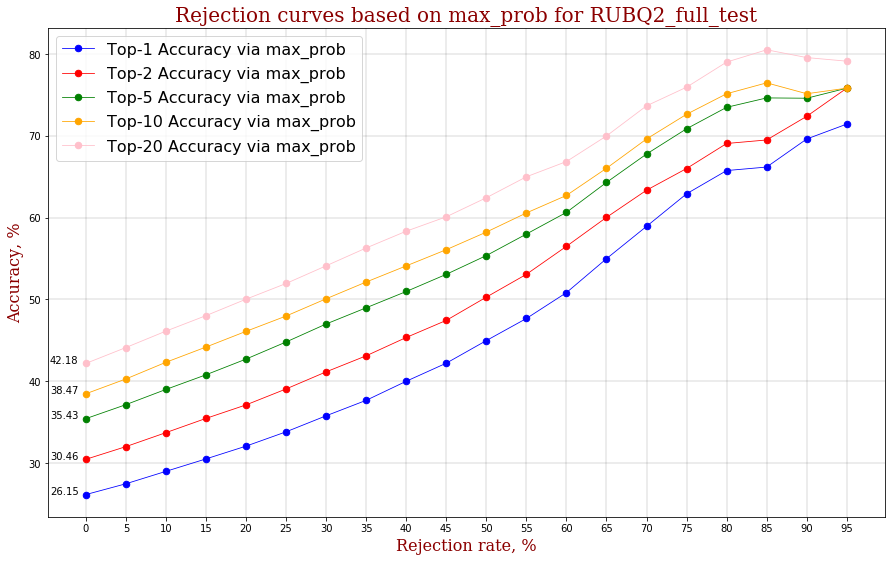

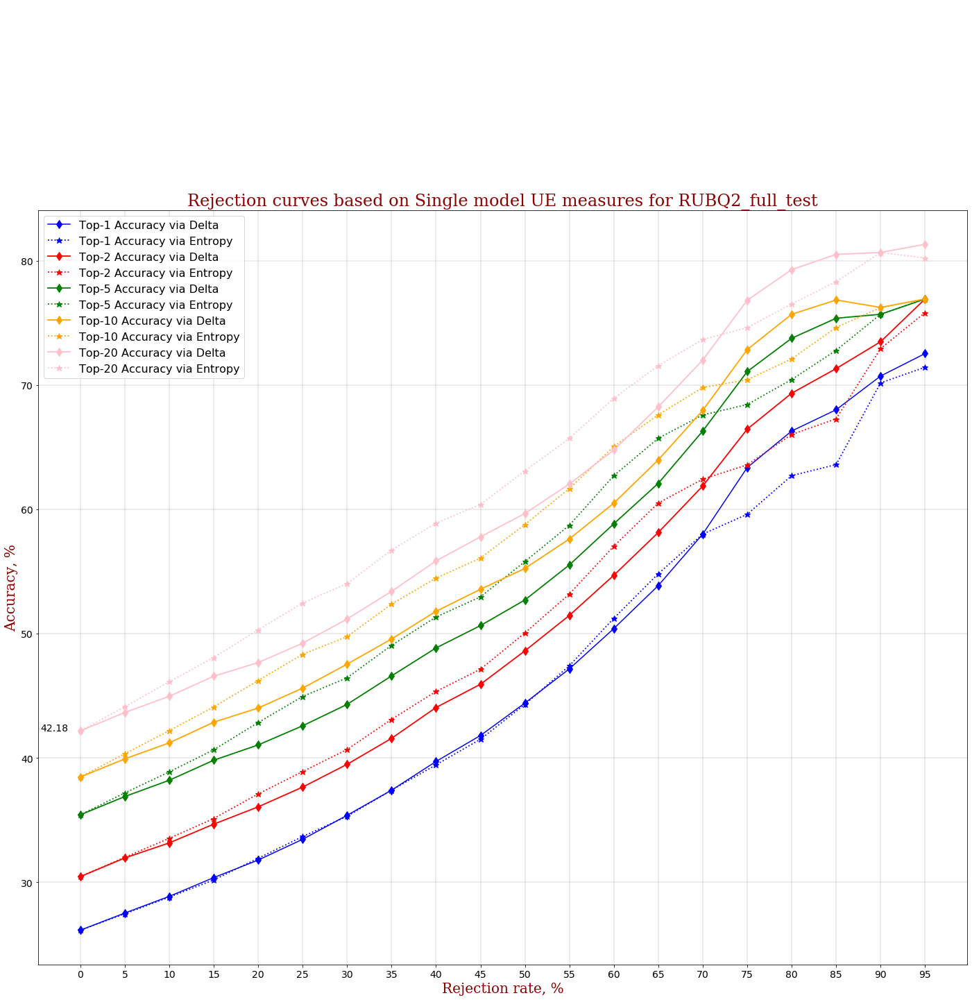

In [77]:
import json

######################### <- HERE DETERMINE DATA 

########## load data

with open('data/RuBQ_2.0_dev.json', 'r') as fp:
    rubq_full_dev = json.load(fp)
    
with open('data/RuBQ_2.0_test.json', 'r') as fp:
    rubq_full_test = json.load(fp)
    
    
dt = pd.read_json("data/RuBQ_2.0_test.json")
answers = [[dt["answers"][j][i]["value"].split("/")[-1] for i in range(len(dt["answers"][j]))] for j in range(len(dt))]

full_rubq_test = pd.read_json("data/RuBQ_2.0_test.json")[["question_text", "question_eng"]]
full_rubq_test["answer"] = answers

appropriate_variants = []
for i in range(len(full_rubq_test)):
    if full_rubq_test.loc[i, "answer"] == []:
        appropriate_variants.append(i)
    elif full_rubq_test.loc[i, "answer"][0][0] == "Q":
        appropriate_variants.append(i)
    else:
        pass

print("Full test RuBQ 2.0 length =", len(appropriate_variants), "questions")
    
    
full_rubq_test_clear = full_rubq_test.iloc[appropriate_variants,:]



questions = list(full_rubq_test.loc[appropriate_variants,"question_eng"])
sample_questions = len(questions)

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_full_test"
num_quantiles = 20
num_beams = 20
answers = list(np.array(full_rubq_test_clear.answer))
top_ks = [1, 2, 5, 10, 20]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_RUBQ2_FULL_TEST_BS20"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10, 20],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res




# RuBQ full bs 10

Full test RuBQ 2.0 length = 1809 questions


100%|██████████| 1809/1809 [06:10<00:00,  4.88it/s]


Model Beam Size       UE RUBQ2_full_test                               
                                   top-1 acc top-2 acc top-5 acc top-10 acc
0  Single        10  entropy          0.4597    0.5076    0.5554     0.6005
1  Single        10    score          0.4648    0.5093    0.5551     0.5986
2  Single        10    delta          0.4630    0.5013    0.5437     0.5858

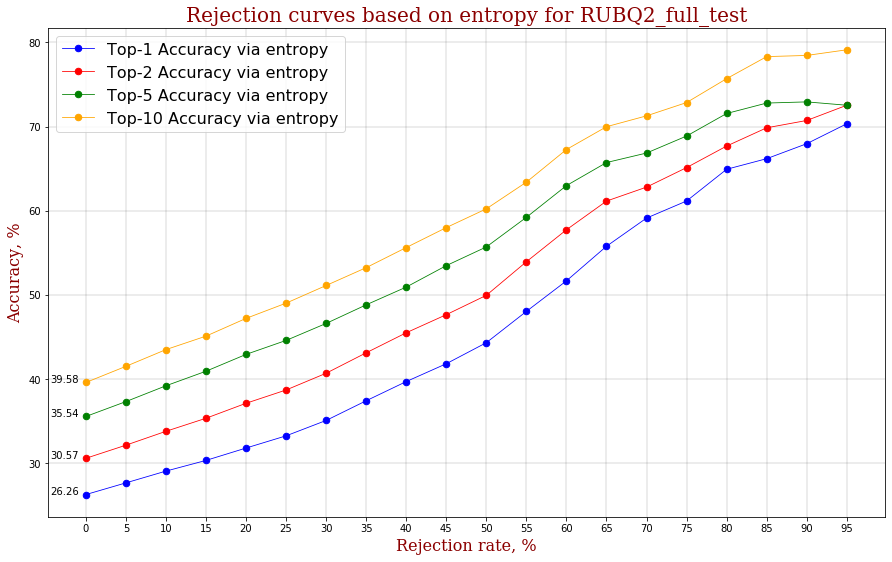

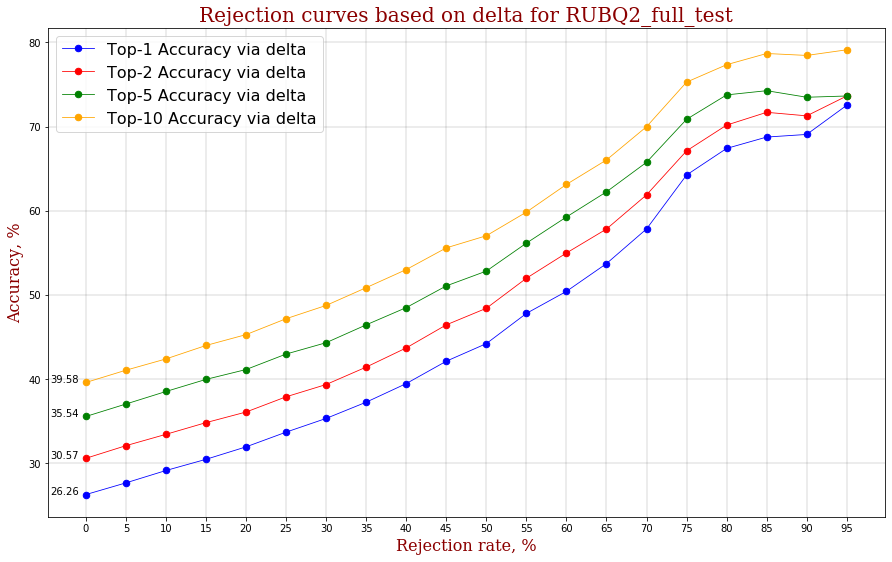

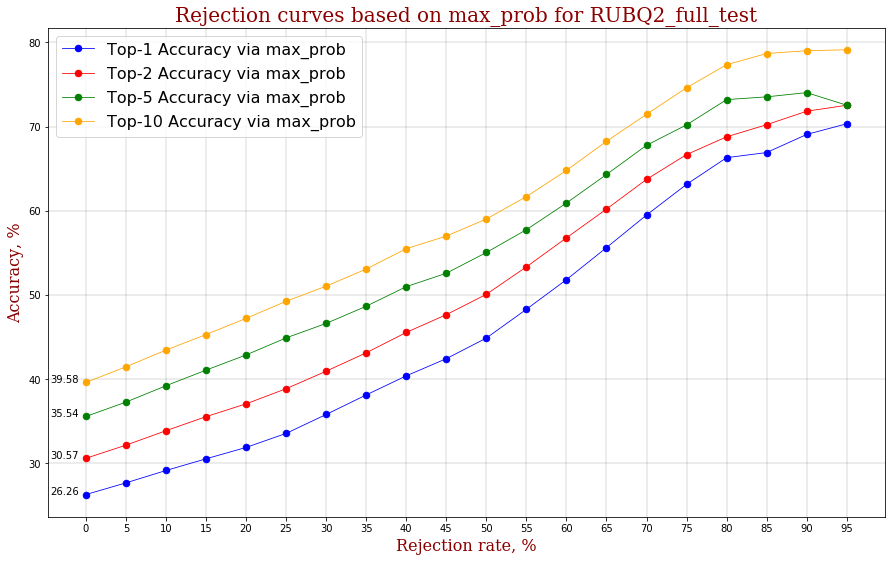

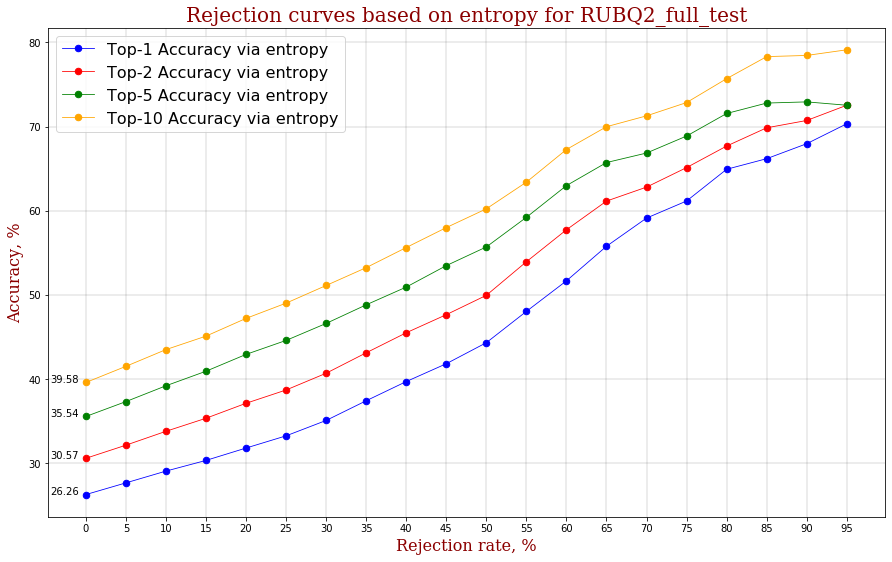

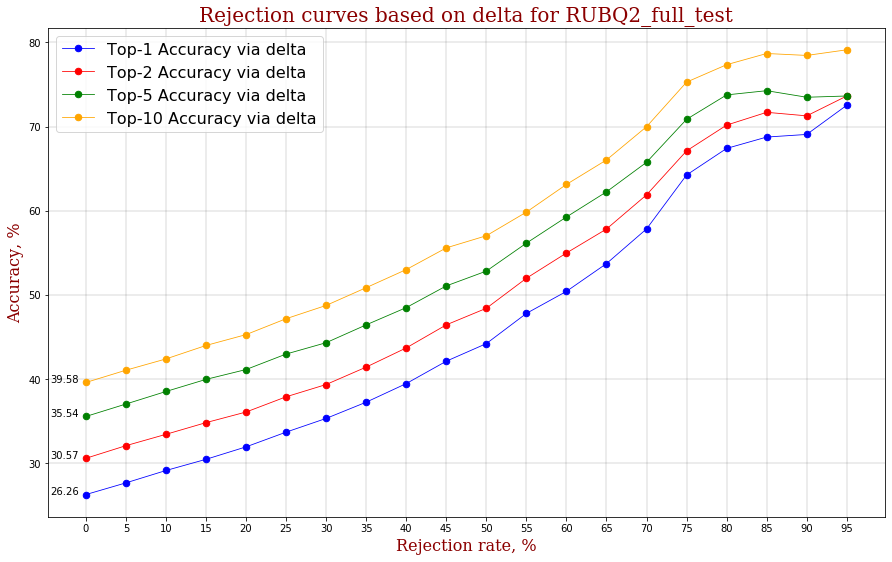

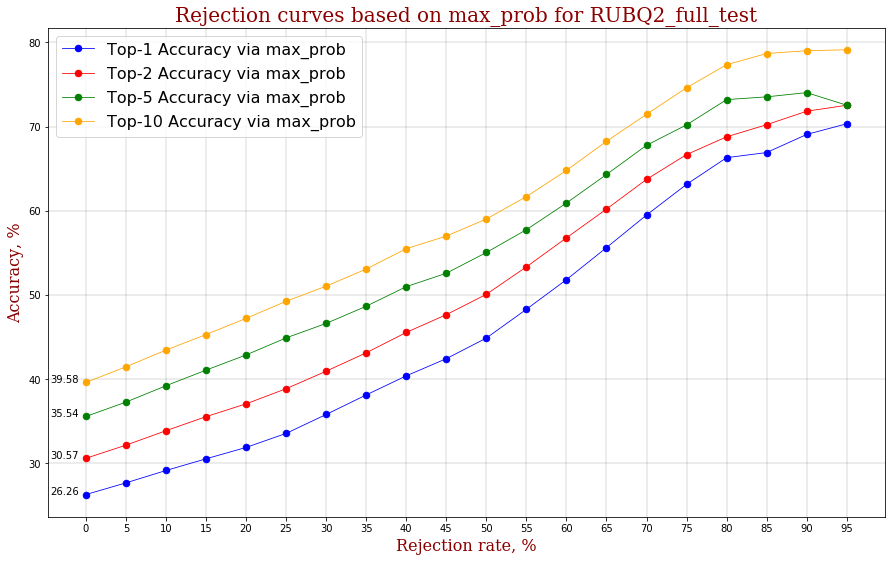

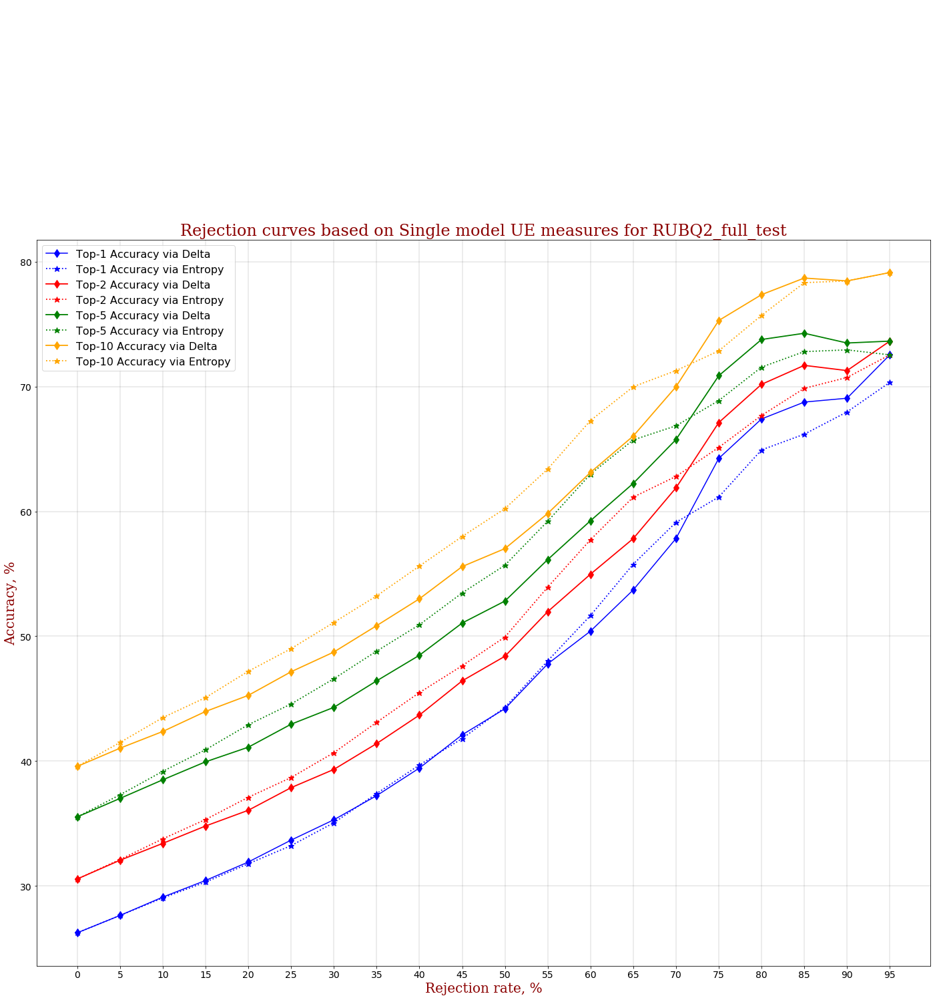

In [78]:
import json

######################### <- HERE DETERMINE DATA 

########## load data

with open('data/RuBQ_2.0_dev.json', 'r') as fp:
    rubq_full_dev = json.load(fp)
    
with open('data/RuBQ_2.0_test.json', 'r') as fp:
    rubq_full_test = json.load(fp)
    
    
dt = pd.read_json("data/RuBQ_2.0_test.json")
answers = [[dt["answers"][j][i]["value"].split("/")[-1] for i in range(len(dt["answers"][j]))] for j in range(len(dt))]

full_rubq_test = pd.read_json("data/RuBQ_2.0_test.json")[["question_text", "question_eng"]]
full_rubq_test["answer"] = answers

appropriate_variants = []
for i in range(len(full_rubq_test)):
    if full_rubq_test.loc[i, "answer"] == []:
        appropriate_variants.append(i)
    elif full_rubq_test.loc[i, "answer"][0][0] == "Q":
        appropriate_variants.append(i)
    else:
        pass

print("Full test RuBQ 2.0 length =", len(appropriate_variants), "questions")
    
    
full_rubq_test_clear = full_rubq_test.iloc[appropriate_variants,:]



questions = list(full_rubq_test.loc[appropriate_variants,"question_eng"])
sample_questions = len(questions)

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_full_test"
num_quantiles = 20
num_beams = 10
answers = list(np.array(full_rubq_test_clear.answer))
top_ks = [1, 2, 5, 10]
model_type = "t5-xl-ssm-nq"
source = "SINGLE_MODEL_RUBQ2_FULL_TEST_BS10"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res




In [38]:
# single_model_result_sq_in_qraph = {
#     "predictive_distribution":result,    
#     "predictions":predictions,
#     "probabilities":probas,
    
   
#     "entropies":entropies,
#     "max_probs":maxprobs,
#     "deltas":deltas,

    
#     "accuracy_for_each_topk_entropy":res_entropy,
#     "accuracy_for_each_topk_maxprob":res_maxprob,
#     "accuracy_for_each_topk_delta":res_delta,
    
#     "num_quantiles":num_quantiles,
#     "top_ks":top_ks,
#     "dataset_name":name_of_dataset,
#     "num_beams":num_beams,
#     "model":model_type,
#     "name_of_dataset":name_of_dataset
# }

# # with open('single_model_result_sq_in_qraph_bs_20.pickle', 'wb') as handle:
# #     pickle.dump(single_model_result_sq_in_qraph, handle, protocol=pickle.HIGHEST_PROTOCOL)




# Check the quality of ensemble

In [83]:
##! wget https://dl.fbaipublicfiles.com/GENRE/lang_title2wikidataID-normalized_with_redirect.pkl    
with open("RUBQ_2_0_FULL_TEST_DROPOUT_BS10.pkl", "rb") as f:
    RUBQ_2_0_FULL_TEST_DROPOUT_BS10 = pickle.load(f)

with open("SQ_FULL_TEST_DROPOUT_BS10.pkl", "rb") as f:
    SQ_FULL_TEST_DROPOUT_BS10 = pickle.load(f)

with open("SQ_In_GRAPH_MC_DROPOUT_BS10.pkl", "rb") as f:
    SQ_In_GRAPH_MC_DROPOUT_BS10 = pickle.load(f)
    
with open("RUBQ2_1HOP_1186_MC_DROPOUT_BS20.pkl", "rb") as f:
    RUBQ2_1HOP_1186_MC_DROPOUT_BS20 = pickle.load(f)
    
    
    
    
##! wget https://dl.fbaipublicfiles.com/GENRE/lang_title2wikidataID-normalized_with_redirect.pkl    
with open("SINGLE_MODEL_SQ_FULL_TEST_BS_10.pickle", "rb") as f:
    SINGLE_MODEL_SQ_FULL_TEST_BS_10 = pickle.load(f)

with open("SINGLE_MODEL_SQ_IN_GRAPH_TEST_BS_10.pickle", "rb") as f:
    SINGLE_MODEL_SQ_IN_GRAPH_TEST_BS_10 = pickle.load(f)

with open("SINGLE_MODEL_RUBQ2_1HOP_TEST_BS10.pickle", "rb") as f:
    SINGLE_MODEL_RUBQ2_1HOP_TEST_BS10 = pickle.load(f)
    
with open("SINGLE_MODEL_RUBQ2_FULL_TEST_BS10.pickle", "rb") as f:
    SINGLE_MODEL_RUBQ2_FULL_TEST_BS10 = pickle.load(f)

In [27]:
# useful functions
import scipy.stats
from tqdm import tqdm
from time import time
import json
import collections, functools, operator

softmax = nn.Softmax(dim = -1)

def predict_and_proba(question, model, tokenizer, device, num_beams = 10, max_sequence_length = 32):
    """This function generates sequence = answer on given question
    
    1) it encodes qustion using tokenizer
    2) converts tokenized text to device
    3) generate answer with dredefined beam size using tokenized text
    4) as output we receive answers and their probabilities
    
    """
    
    input_ids = tokenizer([question], return_tensors="pt").input_ids
    input_ids = input_ids.to(device)

    out = model.generate(input_ids,
                         num_return_sequences = num_beams,
                         num_beams = num_beams,
                         eos_token_id = tokenizer.eos_token_id,
                         pad_token_id = tokenizer.pad_token_id,
                         output_scores = True,
                         return_dict_in_generate=True,
                         early_stopping=True,
                         max_length=max_sequence_length)
    
    prediction = [tokenizer.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
    prediction = [first_letter_big(word) for word in prediction]
    probs = softmax(out.sequences_scores)
    
    return prediction, probs

def first_letter_big(word):
    try:
        return word[0].upper() + word[1:]
    except:
        return word

def stable_experiments(seed_num):
    
    torch.manual_seed(seed_num)
    random.seed(seed_num)
    np.random.seed(seed_num)

def KL(P,Q):
    """ Epsilon is used here to avoid conditional code for
    checking that neither P nor Q is equal to 0. """
    epsilon = 1e-16

    P = P+epsilon
    #print(P)
    Q = Q+epsilon
    #print(Q)

    kl_divergence = np.sum(P*np.log(P/Q))
    return kl_divergence

def div_d(my_dict, number):

    for i in my_dict:
        my_dict[i] = float(my_dict[i]/number)

    return my_dict 


def get_predictive_distribution(model, tokenizer, question, device, seed = 42,
                                ensemble_size = 5, num_beams = 20, need_report = False):
    
    stable_experiments(seed)
    
    # in order to receive MC-dropout results we have to convert model to eval mode
    model.train()
    
    matrix_of_probs = []
    matrix_of_predictions = []

    for i in range(ensemble_size):
        stable_experiments(i)
        prediction, probs = predict_and_proba(question = question, model = model,
                                              tokenizer = tokenizer, device = device,
                                              num_beams=num_beams, max_sequence_length=5)
        matrix_of_probs.append(probs)
        matrix_of_predictions.append(prediction)



    matrix_of_probs = torch.stack(matrix_of_probs)
    matrix_of_probs = softmax(matrix_of_probs)
    
    if need_report:
        print("matrix_of_probs", "\n")
        print(matrix_of_probs, "\n")

#         print("matrix_of_predictions", "\n")
#         print(matrix_of_predictions, "\n")

    # !!! below output considers the cituations ensemble_size = 3 and num_beams = 5 
    # (small numbers for brevity of examples of ouputs)

    # output example
    # matrix_of_probs = 
    # tensor([[0.2036, 0.1995, 0.1993, 0.1989, 0.1987],
    #         [0.2767, 0.1873, 0.1828, 0.1769, 0.1764],
    #         [0.2810, 0.1876, 0.1780, 0.1777, 0.1756]], device='cuda:3') 
    
    # output example
    # matrix_of_predictions = 
    # [['A change in', 'A meteorit', 'Tectonic', 'A high sea', 'A focus of'],
    #  ['Earthquakes', 'Geological activity', 'Earthquakes', 'Ge forces', 'Earthquaking'],
    #  ['Earthquakes', 'Earthquaking', 'Earthquake', 'Earthquak', 'Earthquake or']]


    prediction_matrix = np.array([[matrix_of_predictions[j][i] for i in range(num_beams)] for j in range(ensemble_size)])
    
    if need_report:
        print("prediction_matrix", "\n")
        print(prediction_matrix, "\n")

    # output example
    # prediction_matrix = 
    # [['A change in' 'A meteorit' 'Tectonic' 'A high sea' 'A focus of']
    #  ['Earthquakes' 'Geological activity' 'Earthquakes' 'Ge forces'
    #   'Earthquaking']
    #  ['Earthquakes' 'Earthquaking' 'Earthquake' 'Earthquak' 'Earthquake or']] 
    
    return matrix_of_probs, prediction_matrix
    

def UE(model, tokenizer, matrix_of_probs, prediction_matrix, device, seed = 42, ensemble_size = 5, num_beams = 20, need_report = False):
    """
    This function provides estimation of ensemble based (MC-Dropout) Uncertainty metrics:
    - Ensemble Delta
    - Ensemble maxprob
    - Expected Entropy
    - Predictive Entropy
    - Bayesian Active Learning by Disagreement (BALD)
    - Expected pairwise Kullback–Leibler divergence
    - Reversed Mutual Information
    
    """
    
    start = time()
    stable_experiments(seed)
    
    # in order to receive MC-dropout results we have to convert model to eval mode
    model.train()
    



    set_of_index = set(np.hstack(prediction_matrix))
    
    if need_report:
        print("set_of_index", "\n")
        print(set_of_index, "\n")

    # output example 
    # set_of_index = 
    # {'A meteorit', 'Tectonic', 'Earthquaking', 'A focus of', 'A change in', 'A high sea',
    #  'Earthquak', 'Earthquake or', 'Geological activity', 'Earthquake', 'Ge forces', 'Earthquakes'} 


    # initialize matrix of zeros probabilities and fill it with zero probs

    init_mat = np.zeros(shape = (ensemble_size, len(list(set_of_index))))

    # init final matrix
    probs_mat = np.zeros_like(init_mat).tolist()


    # all generated indexes (columns of our final prob matrix)
    possible_indexes = list(set_of_index)


    for raw in range(init_mat.shape[0]):
        for column in range(init_mat.shape[1]):
            probs_mat[raw][column] = {possible_indexes[column]:init_mat[raw, column]}
            
    if need_report:
        print("probs_mat", "\n")
        print(probs_mat, "\n")

    # output example:   
    # probs_mat = 
    # [[{'A meteorit': 0.0}, {'Tectonic': 0.0}, {'Earthquaking': 0.0}, {'A focus of': 0.0}, {'A change in': 0.0},
    #   {'A high sea': 0.0}, {'Earthquak': 0.0}, {'Earthquake or': 0.0}, {'Geological activity': 0.0}, 
    #   {'Earthquake': 0.0}, {'Ge forces': 0.0}, {'Earthquakes': 0.0}], 
    #  [{'A meteorit': 0.0}, {'Tectonic': 0.0}, {'Earthquaking': 0.0}, {'A focus of': 0.0}, {'A change in': 0.0},
    #   {'A high sea': 0.0}, {'Earthquak': 0.0}, {'Earthquake or': 0.0}, {'Geological activity': 0.0},
    #   {'Earthquake': 0.0}, {'Ge forces': 0.0}, {'Earthquakes': 0.0}], 
    #  [{'A meteorit': 0.0}, {'Tectonic': 0.0}, {'Earthquaking': 0.0}, {'A focus of': 0.0}, {'A change in': 0.0},
    #   {'A high sea': 0.0}, {'Earthquak': 0.0}, {'Earthquake or': 0.0}, {'Geological activity': 0.0},
    #   {'Earthquake': 0.0}, {'Ge forces': 0.0}, {'Earthquakes': 0.0}]] 


    # To optimise the process of filling probability matrix let's join dictionaries
    final_matrix_of_probs = []
    for raw in np.array(probs_mat):
        new_dict = {}

        for elem in raw:
            new_dict.update(elem)
        final_matrix_of_probs.append(new_dict)
        
    if need_report:
        print("final_matrix_of_probs", "\n")
        print(final_matrix_of_probs, "\n")

    # output example:   
    # final_matrix_of_probs = 
    # [{'A meteorit': 0.0, 'Tectonic': 0.0, 'Earthquaking': 0.0, 'A focus of': 0.0, 'A change in': 0.0,
    #   'A high sea': 0.0, 'Earthquak': 0.0, 'Earthquake or': 0.0, 'Geological activity': 0.0, 'Earthquake': 0.0,
    #   'Ge forces': 0.0, 'Earthquakes': 0.0}, 
    #  {'A meteorit': 0.0, 'Tectonic': 0.0, 'Earthquaking': 0.0,'A focus of': 0.0, 'A change in': 0.0,
    #   'A high sea': 0.0, 'Earthquak': 0.0, 'Earthquake or': 0.0, 'Geological activity': 0.0, 
    #   'Earthquake': 0.0, 'Ge forces': 0.0, 'Earthquakes': 0.0}, 
    #  {'A meteorit': 0.0, 'Tectonic': 0.0,'Earthquaking': 0.0, 'A focus of': 0.0, 'A change in': 0.0,
    #   'A high sea': 0.0, 'Earthquak': 0.0, 'Earthquake or': 0.0, 'Geological activity': 0.0, 'Earthquake': 0.0, 
    #   'Ge forces': 0.0, 'Earthquakes': 0.0}] 

    for i, prediciton in enumerate(prediction_matrix):
        for j, index in enumerate(prediciton):
            final_matrix_of_probs[i][index] += float(matrix_of_probs[i, j])

    final_matrix_of_probs = np.array(final_matrix_of_probs)
    # examples of output below considers rounding for 3 digits
    
    if need_report:
        print("final_matrix_of_probs", "\n")
        print(final_matrix_of_probs, "\n")

    # output example:   
    # final_matrix_of_probs = 
    # [{'A meteorit': 0.199, 'Tectonic': 0.199, 'Earthquaking': 0.0, 'A focus of': 0.199, 'A change in': 0.204,
    #   'A high sea': 0.199, 'Earthquak': 0.0, 'Earthquake or': 0.0, 'Geological activity': 0.0, 'Earthquake': 0.0, 
    #   'Ge forces': 0.0, 'Earthquakes': 0.0}
    #  {'A meteorit': 0.0, 'Tectonic': 0.0, 'Earthquaking': 0.176, 'A focus of': 0.0, 'A change in': 0.0, 
    #   'A high sea': 0.0, 'Earthquak': 0.0, 'Earthquake or': 0.0, 'Geological activity': 0.187,
    #   'Earthquake': 0.0, 'Ge forces': 0.177, 'Earthquakes': 0.46}
    #  {'A meteorit': 0.0, 'Tectonic': 0.0, 'Earthquaking': 0.188, 'A focus of': 0.0, 'A change in': 0.0,
    #   'A high sea': 0.0, 'Earthquak': 0.178, 'Earthquake or': 0.176, 'Geological activity': 0.0,
    #   'Earthquake': 0.178, 'Ge forces': 0.0, 'Earthquakes': 0.281}] 
    
    
    # besides uncertainty we need actually a prediction of the ensemble 
    # let's average the probabilities of the corresponding indexes of final_matrix_of_probs
    result = dict(functools.reduce(operator.add,
         map(collections.Counter, list(final_matrix_of_probs))))

    final_ensemble_prediction = div_d(result, len(list(final_matrix_of_probs)))
    
    if need_report:
        print("final_ensemble_prediction", "\n")
        print(final_ensemble_prediction, "\n")
    
    # output example 
    # final_ensemble_prediction = 
    # {'A meteorit': 0.06633333333333334, 'Tectonic': 0.06633333333333334, 'Earthquaking': 0.12133333333333333,
    #  'A focus of': 0.06633333333333334, 'A change in': 0.06799999999999999, 'A high sea': 0.06633333333333334,
    #  'Geological activity': 0.06233333333333333, 'Ge forces': 0.059, 'Earthquakes': 0.24700000000000003, 
    #  'Earthquak': 0.05933333333333333, 'Earthquake or': 0.058666666666666666, 'Earthquake': 0.05933333333333333} 
    

    #### calculation ensemble MC-dropout Uncertainty metrics
    
    # ensemble delta = mean delta over ensemble of models
    deltas = []
    
    for prob_distr in final_matrix_of_probs:

        distribution = list(prob_distr.values())
        deltas.append(
            sorted(distribution)[-1] - sorted(distribution)[-2]
        )

    ensemble_delta = np.mean(deltas)
    
    # ensemble score (ensemble maxprob) = mean maxprob over ensemble of models
    max_probs = []
    
    for prob_distr in final_matrix_of_probs:

        distribution = list(prob_distr.values())
        max_probs.append(
            sorted(distribution)[-1]
        )

    ensemble_max_prob = np.mean(max_probs)
    
    
    #Expected entropy = mean entropy over each ensemble predictive distribution

    entropies = []
    for prob_distr in final_matrix_of_probs:

        distribution = list(prob_distr.values())
        entropies.append(
            scipy.stats.entropy(distribution)
        )

    eentropy = np.mean(entropies)

    # for calculating predictive entropy we have to perate rawise, thus we need a matrix of scores 
    distribution_matrix = np.array([list(x.values()) for x in final_matrix_of_probs])
    
    if need_report:
        print("distribution_matrix", "\n")
        print(distribution_matrix, "\n")
    
    # output example 
    # distribution_matrix =
    # [[0.199 0.199 0.    0.199 0.204 0.199 0.    0.    0.    0.    0.    0.   ]
    #  [0.    0.    0.176 0.    0.    0.    0.    0.    0.187 0.    0.177 0.46 ]
    #  [0.    0.    0.188 0.    0.    0.    0.178 0.176 0.    0.178 0.    0.281]] 
    

    # for Predictive entropy we firstly count mean probability over ensemble predictions for each index
    mean_probs_of_indexes = distribution_matrix.mean(axis = 0)

    # and count entropy over it
    pentropy = scipy.stats.entropy(mean_probs_of_indexes)

    # Bayesian Active Learning by Disagreement (BALD) = Predictive entropy - Expected entropy
    bald = pentropy - eentropy

    # Expected pairwise Kullback–Leibler divergence
    # for it we need indexes of every pair of elements without repetition and coincidence N*(N-1)/2
    res = [list(dict.fromkeys([(i, min(j+i+1, (ensemble_size-1))) for j in range(ensemble_size)])) for i in range(ensemble_size)][:-1]
    indexes_that_we_want = [item for sublist in res for item in sublist]

    # when we have indexes that we want we can calculate mean KL divergence over each pair
    epkl = np.mean([KL(distribution_matrix[x[0]], distribution_matrix[x[1]]) for x in indexes_that_we_want])

    # Reversed Mutual Information = Expected pairwise Kullback–Leibler divergence - BALD
    rmi = epkl - bald

    end = time()

    if need_report:
        print("Duration of calculation = ", np.round(end - start, 4), "sec.")
        print("MC-Dropout Ensemble based Uncertainty measures:")
        print("Ensemble Delta = ", np.round(ensemble_delta, 4))
        print("Ensemble Score (Max prob) = ", np.round(ensemble_max_prob, 4))
        print("Expected Entropy = ", np.round(eentropy, 4))
        print("Predictive Entropy = ", np.round(pentropy,4))
        print("BALD = ", np.round(bald,4))
        print("EPKL = ", np.round(epkl,4))
        print("RMI = ", np.round(rmi,4))
        
    return ensemble_delta, ensemble_max_prob, eentropy, pentropy, bald, epkl, rmi, final_ensemble_prediction


def area_under_rejection_curve(data, name, topk, num_quantiles, number_of_digids_round = 4):
    """
    This function calculates absolute Area under Rejection curve to 
    estimate overall quality of uncertainty estimation
    """
    max_area = (100 - 100 / num_quantiles) * 100

    x = (100.0 - np.array(list(data[f"{name}"][topk].keys())).astype(float))[::-1]
    y = np.array(list(data[f"{name}"][topk].values())).astype(float)[::-1]
    area = np.round(trapz(y = y, x = x, dx=1) / max_area, number_of_digids_round)

    return area

softmax = nn.Softmax()
def from_text_to_id(x):
    try:
        return list(lang_title2wikidataID[("en", x)])[0]
    except:
        return "None"
    
    
def UE_ensemble(
    ensemble_metric_name: "str",
    answers: "list",
    dataset_name: "str",
    predictions,
    num_quantiles,
    number_of_questions, 
    plot_rejection_curves = True,
    ensemble_deltas = None,
    ensemble_max_probs = None,
    eentropies = None,
    pentropies = None,
    balds = None,
    epkls = None,
    rmis = None,
    top_ks = [1, 2, 5, 10, 20],
    model_type = "T5_XL_SSM_NQ_model",
    need_report = False):
    
    """
    possible ensemble metric names:
        
        "ensemble delta",
        "ensemble maxprob",
        "expected entropy",
        "predictive entropy",
        "BALD", 
        "EPKL",
        "RMI"
        
        
    """
    if (ensemble_metric_name == "ensemble delta") or (ensemble_metric_name == "ensemble maxprob"):
        quants = [thresh / num_quantiles for thresh in range(0, num_quantiles)]
    else:    
        quants = [thresh / num_quantiles for thresh in range(1, num_quantiles+1)]
        
    
    
    if  ensemble_metric_name == "ensemble delta":
        ue_metrics = ensemble_deltas
            
    if  ensemble_metric_name == "ensemble maxprob":
        ue_metrics = ensemble_max_probs
        
    if  ensemble_metric_name == "expected entropy":
        ue_metrics = eentropies
        
    if  ensemble_metric_name == "predictive entropy":
        ue_metrics = pentropies
        
    if  ensemble_metric_name == "BALD":
        ue_metrics = balds
        
    if  ensemble_metric_name == "EPKL":
        ue_metrics = epkls
    
    if  ensemble_metric_name == "RMI":
        ue_metrics = rmis
        
    
    thresholds_ue_metric = [np.quantile(ue_metrics, q) for q in quants]

    if (ensemble_metric_name == "ensemble delta") or (ensemble_metric_name == "ensemble maxprob"):
        thresholds_ue_metric = thresholds_ue_metric[::-1]

    accuracy_for_each_topk_ue_metrics = {}

    #top_k pred
    for top_k in top_ks:

        accuracy_for_each_quantile = {}

        for quantile in range(num_quantiles):
            
            if ensemble_metric_name in ["expected entropy", "predictive entropy", "BALD", "EPKL", "RMI"]:
                # list of predictions
                list_of_predictions = list(compress(predictions, ue_metrics <= thresholds_ue_metric[quantile]))
                if need_report:
                    print("list_of_predictions", list_of_predictions, "\n")

                #list of correct answers
                list_of_correct_answers = list(compress(answers[:number_of_questions], ue_metrics <= thresholds_ue_metric[quantile]))
                if need_report:
                    print("list_of_correct_answers", list_of_correct_answers, "\n")
                
            elif ensemble_metric_name in ["ensemble delta", "ensemble maxprob"]:
                
                # list of predictions
                list_of_predictions = list(compress(predictions, ue_metrics >= thresholds_ue_metric[quantile]))
                if need_report:
                    print("len(list_of_predictions)", len(list_of_predictions), "\n")

                #list of correct answers
                list_of_correct_answers = list(compress(answers[:number_of_questions], ue_metrics >= thresholds_ue_metric[quantile]))
                
            
            
            # choose top k predictions
            top_k_list_of_predictions = [i[:top_k] for i in list_of_predictions]
            if need_report:
                print("top_k_list_of_predictions", top_k_list_of_predictions, "\n")


            top_k_list_of_predicted_ids= []
            for sample in top_k_list_of_predictions:
                new = []
                for prediction in sample:
                    try:
                        x = from_text_to_id(prediction)
                    except:
                        x = "None"
                    new.append(x)

                top_k_list_of_predicted_ids.append(new)
            
            if need_report:
                print("top_k_list_of_predicted_ids", top_k_list_of_predicted_ids)
            

            right = 0
            for i in range(len(list_of_correct_answers)):
                if any(item in top_k_list_of_predicted_ids[i] for item in list_of_correct_answers[i]):
                    right += 1
                else:
                    pass

            accuracy = np.round(right/len(list_of_correct_answers), 4)*100
            
            if need_report:
                print("accuracy", accuracy, "\n")
                print(f"Top-{top_k} accuracy on the {(quantile+1)*(int(100/num_quantiles))}% the most confident from the entropy point of view = {accuracy}%", "\n")

            accuracy_for_each_quantile[(quantile+1)*(int(100/num_quantiles))] = accuracy
        accuracy_for_each_topk_ue_metrics[top_k] = accuracy_for_each_quantile
            
            
            
            
        if need_report:
            print("\n", "\n", "\n")
    
    if need_report:
        print("accuracy_for_each_topk_ue_metrics", accuracy_for_each_topk_ue_metrics, "\n")
        
    
    if plot_rejection_curves:
        
        font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 16
            }

        font_title = {'family': 'serif',
                      'color': 'darkred',
                      'weight': 'normal',
                      'size': 20
                      }


        plt.figure(figsize = (15, 9))
        plt.title(f"Rejection curves based on {ensemble_metric_name} for {dataset_name}", fontdict=font_title)

        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5))
        plt.grid(color='black', linewidth=0.15)

        
        if 1 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[1].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[1].values())),
                     label=f"Top-{1} Accuracy via {ensemble_metric_name}", c="blue", marker='.', markersize=13, linewidth=0.8);
            
        if 2 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[2].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[2].values())),
                     label=f"Top-{2} Accuracy via {ensemble_metric_name}", c="red", marker='.', markersize=13, linewidth=0.8);
        
        if 5 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[5].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[5].values())),
                     label=f"Top-{5} Accuracy via {ensemble_metric_name}", c="green", marker='.', markersize=13, linewidth=0.8);
        
        if 10 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[10].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[10].values())),
                     label=f"Top-{10} Accuracy via {ensemble_metric_name}", c="orange", marker='.', markersize=13, linewidth=0.8);
        
        if 20 in top_ks:
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ue_metrics[20].keys())),
                     np.array(list(accuracy_for_each_topk_ue_metrics[20].values())),
                     label=f"Top-{20} Accuracy via {ensemble_metric_name}", c="pink", marker='.', markersize=13, linewidth=0.8);

        if 1 in top_ks:
            accuracy_on_full_data_top_1 = np.array(list(accuracy_for_each_topk_ue_metrics[1].values()))[-1]
        if 2 in top_ks:
            accuracy_on_full_data_top_2 = np.array(list(accuracy_for_each_topk_ue_metrics[2].values()))[-1]
        if 5 in top_ks:
            accuracy_on_full_data_top_5 = np.array(list(accuracy_for_each_topk_ue_metrics[5].values()))[-1]
        if 10 in top_ks:
            accuracy_on_full_data_top_10 = np.array(list(accuracy_for_each_topk_ue_metrics[10].values()))[-1]
        if 20 in top_ks:
            accuracy_on_full_data_top_20 = np.array(list(accuracy_for_each_topk_ue_metrics[20].values()))[-1]

        if 1 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, accuracy_on_full_data_top_1));
        if 2 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2));
        if 5 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5));
        if 10 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10));
        if 20 in top_ks:
            plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20));

        plt.legend(fontsize=16);
        plt.show()

        plt.savefig(f"QA_Rejection_curves_based_on_{ensemble_metric_name}_for_{dataset_name}_{model_type}_model.png", dpi = 300)

    
    return accuracy_for_each_topk_ue_metrics, ue_metrics




    
def obtain_probs_predicts_and_metrics_from_begin(
    data: "list of questions",
    data_name,
    number_of_questions,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device=device,
    seed = 42,
    ensemble_size = 5,
    num_beams = 20,
    need_report = False
):

    ensemble_deltas, ensemble_max_probs, eentropies, pentropies, balds, epkls, rmis, predictions = [], [], [], [], [], [], [], []
    matrixes_of_probs, matrixes_of_predictions, predictions_matrix = [], [], []

    # for the case when we do not have prodictive distriution -> we have to compute it and after it estimate uncertainty

    for questions in tqdm(data[:number_of_questions]):

        matrix_of_probs, prediction_matrix = get_predictive_distribution(model = model,
                                                                         tokenizer = tokenizer,
                                                                         question = questions,
                                                                         device = device,
                                                                         seed = seed,
                                                                         ensemble_size = ensemble_size,
                                                                         num_beams = num_beams,
                                                                         need_report = need_report)
        matrix_of_probs = matrix_of_probs.to("cpu")
        matrixes_of_probs.append(matrix_of_probs)
        predictions_matrix.append(prediction_matrix)


        ensemble_delta, ensemble_max_prob, eentropy, pentropy, bald, epkl, rmi, final_ensemble_prediction = UE(model = t5_qa_model,
                                                                                                               tokenizer = t5_tok,
                                                                                                               device=device,
                                                                                                               matrix_of_probs = matrix_of_probs,
                                                                                                               prediction_matrix = prediction_matrix,
                                                                                                               need_report = need_report)
        predictions.append(final_ensemble_prediction)
        ensemble_deltas.append(ensemble_delta)
        ensemble_max_probs.append(ensemble_max_prob)
        eentropies.append(eentropy)
        pentropies.append(pentropy)
        balds.append(bald)
        epkls.append(epkl)
        rmis.append(rmi)


    # sort predictions by highest probability
    preds = [sorted(predictions[i].items(), key=lambda x: x[1], reverse=True) for i in range(len(predictions))]


    res = []
    for i in preds:
        res.append([j[0] for j in i])

    final_dictionary = {"matrixes_of_probs":matrixes_of_probs,
                        "predictions_matrix":predictions_matrix,
                        "predictions":predictions,
                        "preds":preds,
                        "res":res,
                        "ensemble_deltas":ensemble_deltas,
                        "ensemble_max_probs":ensemble_max_probs,
                        "eentropies":eentropies, 
                        "pentropies":pentropies,
                        "balds":balds, 
                        "epkls":epkls, 
                        "rmis":rmis,
                        "data_name":data_name,
                        "num_beams":num_beams,
                        "ensemble_size":ensemble_size}
    
    return final_dictionary



def obtain_probs_predicts_and_metrics_from_matrixes(
    matrixes_of_probs,
    predictions_matrix,
    number_of_questions,
    data_name,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device=device,
    need_report = False
):

    # for the case when we have predictive distribution: predictions with probabilities

    for question_index in tqdm(range(number_of_questions)):


        ensemble_delta, ensemble_max_prob, eentropy, pentropy, bald, epkl, rmi, final_ensemble_prediction = UE(model = model,
                                                                                                               tokenizer = tokenizer,
                                                                                                               device=device,
                                                                                                               matrix_of_probs = matrixes_of_probs[question_index],
                                                                                                               prediction_matrix = predictions_matrix[question_index],
                                                                                                               need_report = need_report)
        predictions.append(final_ensemble_prediction)
        ensemble_deltas.append(ensemble_delta)
        ensemble_max_probs.append(ensemble_max_prob)
        eentropies.append(eentropy)
        pentropies.append(pentropy)
        balds.append(bald)
        epkls.append(epkl)
        rmis.append(rmi)


    # sort predictions by highest probability
    preds = [sorted(predictions[i].items(), key=lambda x: x[1], reverse=True) for i in range(len(predictions))]

    res = []
    for i in preds:
        res.append([j[0] for j in i])




    final_dictionary = {"matrixes_of_probs":matrixes_of_probs,
                        "predictions_matrix":predictions_matrix,
                        "predictions":predictions,
                        "preds":preds,
                        "res":res,
                        "ensemble_deltas":ensemble_deltas,
                        "ensemble_max_probs":ensemble_max_probs,
                        "eentropies":eentropies, 
                        "pentropies":pentropies,
                        "balds":balds, 
                        "epkls":epkls, 
                        "rmis":rmis,
                        "data_name":data_name}
    
    return final_dictionary


def get_rubq_question_entities(uris):
    """Extracts gt entities from RuBQ WD uris"""
    ents = []
    if type(uris) == list:
        for uri in uris:
            ents.append(uri.split("/")[-1])
    else:
        ents = [None]

    return ents

    
    
def aggregation_plot_ensemble_measures(
    ue_metrics_to_plot: "list",
    top_k_to_plot: "list",
    name_of_dataset,
    accuracy_for_each_topk_ensemble_maxprob = None,
    accuracy_for_each_topk_ensemble_delta = None,
    accuracy_for_each_topk_eentropy = None,
    accuracy_for_each_topk_pentropy = None,
    accuracy_for_each_topk_bald = None,
    accuracy_for_each_topk_epkl = None,
    accuracy_for_each_topk_rmi = None,
    model_name = "T5_XL_SSM_NQ"
):
    font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 20
            }

    font_title = {'family': 'serif',
                  'color': 'darkred',
                  'weight': 'normal',
                  'size': 24
                  }

    plt.figure(figsize = (24, 20))
    plt.title(f"Rejection curves based on Single model UE measures for {name_of_dataset}", fontdict=font_title)
    plt.xlabel("Rejection rate, %", fontdict=font)
    plt.ylabel("Accuracy, %", fontdict=font)
    plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
    plt.yticks(size = 14)
    plt.grid(color='black', linewidth=0.15)

    linewidth = 1.8
    markersize = 9
    
    if 1 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[1].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[1].values())),
                     label=f"Top-{1} Accuracy via Expected Entropy", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[1].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[1].values())),
                     label=f"Top-{1} Accuracy via Predictive Entropy", c="blue", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[1].keys())),
                 np.array(list(accuracy_for_each_topk_bald[1].values())),
                 label=f"Top-{1} Accuracy via BALD", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[1].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[1].values())),
                     label=f"Top-{1} Accuracy via EPKL", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[1].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[1].values())),
                     label=f"Top-{1} Accuracy via RMI", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[1].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[1].values())),
                 label=f"Top-{1} Accuracy via ensemble delta", c="blue", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
            
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[1].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[1].values())),
                 label=f"Top-{1} Accuracy via ensemble maxprob", c="blue", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');



    if 2 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[2].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[2].values())),
                     label=f"Top-{2} Accuracy via Expected Entropy", c="red", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[2].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[2].values())),
                     label=f"Top-{2} Accuracy via Predictive Entropy", c="red", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[2].keys())),
                 np.array(list(accuracy_for_each_topk_bald[2].values())),
                 label=f"Top-{2} Accuracy via BALD", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[2].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[2].values())),
                     label=f"Top-{2} Accuracy via EPKL", c="red", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[2].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[2].values())),
                     label=f"Top-{2} Accuracy via RMI", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[2].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[2].values())),
                 label=f"Top-{2} Accuracy via ensemble delta", c="red", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
        
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[2].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[2].values())),
                 label=f"Top-{2} Accuracy via ensemble maxprob", c="red", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');


    
    if 5 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[5].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[5].values())),
                     label=f"Top-{5} Accuracy via Expected Entropy", c="green", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[5].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[5].values())),
                     label=f"Top-{5} Accuracy via Predictive Entropy", c="green", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[5].keys())),
                 np.array(list(accuracy_for_each_topk_bald[5].values())),
                 label=f"Top-{5} Accuracy via BALD", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[5].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[5].values())),
                     label=f"Top-{5} Accuracy via EPKL", c="green", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[5].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[5].values())),
                     label=f"Top-{5} Accuracy via RMI", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[5].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[5].values())),
                 label=f"Top-{5} Accuracy via ensemble delta", c="green", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');

        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[5].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[5].values())),
                 label=f"Top-{5} Accuracy via ensemble maxprob", c="green", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if 10 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[10].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[10].values())),
                     label=f"Top-{10} Accuracy via Expected Entropy", c="orange", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[10].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[10].values())),
                     label=f"Top-{10} Accuracy via Predictive Entropy", c="orange", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[10].keys())),
                 np.array(list(accuracy_for_each_topk_bald[10].values())),
                 label=f"Top-{10} Accuracy via BALD", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[10].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[10].values())),
                     label=f"Top-{10} Accuracy via EPKL", c="orange", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[10].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[10].values())),
                     label=f"Top-{10} Accuracy via RMI", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[10].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[10].values())),
                 label=f"Top-{10} Accuracy via ensemble delta", c="orange", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
        
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[10].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[10].values())),
                 label=f"Top-{10} Accuracy via ensemble maxprob", c="orange", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if 20 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[20].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[20].values())),
                     label=f"Top-{20} Accuracy via Expected Entropy", c="pink", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[20].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[20].values())),
                     label=f"Top-{20} Accuracy via Predictive Entropy", c="pink", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[20].keys())),
                 np.array(list(accuracy_for_each_topk_bald[20].values())),
                 label=f"Top-{20} Accuracy via BALD", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[20].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[20].values())),
                     label=f"Top-{20} Accuracy via EPKL", c="pink", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[20].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[20].values())),
                     label=f"Top-{20} Accuracy via RMI", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[20].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[20].values())),
                 label=f"Top-{20} Accuracy via ensemble delta", c="pink", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
    
    
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[20].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[20].values())),
                 label=f"Top-{20} Accuracy via ensemble maxprob", c="pink", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if accuracy_for_each_topk_ensemble_maxprob is not None:
        data_acc = accuracy_for_each_topk_ensemble_maxprob
    
    if accuracy_for_each_topk_ensemble_delta is not None:
        data_acc = accuracy_for_each_topk_ensemble_delta
        
    if accuracy_for_each_topk_rmi is not None:
        data_acc = accuracy_for_each_topk_rmi
        
    if accuracy_for_each_topk_epkl is not None:
        data_acc = accuracy_for_each_topk_epkl
        
    if accuracy_for_each_topk_bald is not None:
        data_acc = accuracy_for_each_topk_bald
        
    if accuracy_for_each_topk_eentropy is not None:
        data_acc = accuracy_for_each_topk_eentropy
        
    if accuracy_for_each_topk_pentropy is not None:
        data_acc = accuracy_for_each_topk_pentropy
        



    if 1 in top_k_to_plot:
        accuracy_on_full_data_top_1 = np.array(list(data_acc[1].values()))[-1]
    if 2 in top_k_to_plot:
        accuracy_on_full_data_top_2 = np.array(list(data_acc[2].values()))[-1]
    if 5 in top_k_to_plot:
        accuracy_on_full_data_top_5 = np.array(list(data_acc[5].values()))[-1]
    if 10 in top_k_to_plot:
        accuracy_on_full_data_top_10 = np.array(list(data_acc[10].values()))[-1]
    if 20 in top_k_to_plot:
        accuracy_on_full_data_top_20 = np.array(list(data_acc[20].values()))[-1]
    
    if 1 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, accuracy_on_full_data_top_1), size = 14);
    if 2 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2), size = 14);
    if 5 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5), size = 14);
    if 10 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10), size = 14);
    if 20 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20), size = 14);

    plt.legend(fontsize=14, loc = 2);

    plt.savefig(f"QA_Rejection_curves_based_on_single_model_UE_mes_for_{name_of_dataset}_{model_name}_model.png", dpi = 300)


def total_experiment_uncertainty_mc_dropout(

    data : "list",
    answers : "list",
    data_name : "str",
    output_file_name = "SQ_In_GRAPH_MC_DROPOUT_BS10",
    model = t5_qa_model,
    tokenizer = t5_tok,
    model_type = "T5_XL_SSM_NQ_model",
    num_quantiles = 20,
    seed = 42,
    ensemble_size = 5,
    num_beams = 10,
    need_report = False,
    plot_rejection_curves = True,
    top_ks = [1, 2, 5, 10],
    top_k_to_plot = [1,2,5,10],
    
    
):
    number_of_questions = len(data)
    
    main_data_uncertainty = obtain_probs_predicts_and_metrics_from_begin(
                                        data = data,
                                        data_name = data_name,
                                        number_of_questions = number_of_questions,
                                        model = model,
                                        tokenizer = tokenizer,
                                        device=device,
                                        seed = seed,
                                        ensemble_size = ensemble_size,
                                        num_beams = num_beams,
                                        need_report = need_report)


    res = main_data_uncertainty["res"]
    ensemble_deltas = main_data_uncertainty["ensemble_deltas"]
    ensemble_max_probs = main_data_uncertainty["ensemble_max_probs"]
    eentropies = main_data_uncertainty["eentropies"]
    pentropies = main_data_uncertainty["pentropies"]
    balds = main_data_uncertainty["balds"]
    epkls = main_data_uncertainty["epkls"]
    rmis = main_data_uncertainty["rmis"]

    accuracy_for_each_topk = {}

    for metric in ["ensemble delta", "ensemble maxprob", "expected entropy", "predictive entropy", "BALD", "EPKL", "RMI"]:

        accuracy_for_each_topk_metric, ue_metrics = UE_ensemble(
                                                    ensemble_metric_name = metric,
                                                    answers = answers,
                                                    dataset_name = data_name,
                                                    number_of_questions = number_of_questions,
                                                    plot_rejection_curves = plot_rejection_curves,
                                                    predictions = res,
                                                    num_quantiles = num_quantiles,
                                                    ensemble_deltas = ensemble_deltas,
                                                    ensemble_max_probs = ensemble_max_probs,
                                                    eentropies = eentropies,
                                                    pentropies = pentropies,
                                                    balds = balds,
                                                    epkls = epkls,
                                                    rmis = rmis,
                                                    top_ks = top_ks,
                                                    model_type = model_type,
                                                    need_report = need_report)

        accuracy_for_each_topk[metric] = accuracy_for_each_topk_metric

    aggregation_plot_ensemble_measures(
        ue_metrics_to_plot = ["expected entropy", "predictive entropy", "BALD",
                              "EPKL", "RMI", "ensemble delta", "ensemble maxprob"],
        top_k_to_plot = top_k_to_plot,
        name_of_dataset = data_name,
        accuracy_for_each_topk_ensemble_maxprob = accuracy_for_each_topk["ensemble maxprob"],
        accuracy_for_each_topk_ensemble_delta = accuracy_for_each_topk["ensemble delta"],
        accuracy_for_each_topk_eentropy = accuracy_for_each_topk["expected entropy"],
        accuracy_for_each_topk_pentropy = accuracy_for_each_topk["predictive entropy"],
        accuracy_for_each_topk_bald = accuracy_for_each_topk["BALD"],
        accuracy_for_each_topk_epkl = accuracy_for_each_topk["EPKL"],
        accuracy_for_each_topk_rmi = accuracy_for_each_topk["RMI"]
    )


    main_data_uncertainty["ensemble maxprob"] = accuracy_for_each_topk["ensemble maxprob"]
    main_data_uncertainty["ensemble delta"] = accuracy_for_each_topk["ensemble delta"]
    main_data_uncertainty["expected entropy"] = accuracy_for_each_topk["expected entropy"]
    main_data_uncertainty["predictive entropy"] = accuracy_for_each_topk["predictive entropy"]
    main_data_uncertainty["BALD"] = accuracy_for_each_topk["BALD"]
    main_data_uncertainty["EPKL"] = accuracy_for_each_topk["EPKL"]
    main_data_uncertainty["RMI"] = accuracy_for_each_topk["RMI"]
    main_data_uncertainty["top_ks"] = top_ks
    main_data_uncertainty["seed"] = seed
    main_data_uncertainty["num_quantiles"] = num_quantiles

    #save data
    with open(f'{output_file_name}.pkl', 'wb') as handle:
        pickle.dump(main_data_uncertainty, handle, protocol=pickle.HIGHEST_PROTOCOL)

    #load data
    with open(f'{output_file_name}.pkl', 'rb') as handle:
        data = pickle.load(handle)

    names = [
        "ensemble maxprob",
        "ensemble delta",
        "expected entropy",
        "predictive entropy",
        "BALD",
        "EPKL",
        "RMI"
    ]
    
    if num_beams == 20:
    
        dropout_data = [[area_under_rejection_curve(data = data, name = name, topk=topk, num_quantiles = data["num_quantiles"]) for topk in data["top_ks"]] for name in names]


        df = pd.DataFrame(dropout_data)
        df["UE"] = ["score", "delta", "eentropy", "pentropy", "bald", "epkl", "rmi"]
        df.set_index("UE", inplace=True)
        df.columns = ["{} top-1 acc".format(data["data_name"]), "{} top-2 acc".format(data["data_name"]),
                      "{} top-5 acc".format(data["data_name"]), "{} top-10 acc".format(data["data_name"]),
                      "{} top-20 acc".format(data["data_name"])]
        mux = pd.MultiIndex.from_product([["{}".format(data["data_name"])], ['top-1 acc', 'top-2 acc', 'top-5 acc', 'top-10 acc', 'top-20 acc']])

        dta = df.reset_index()[["{} top-1 acc".format(data["data_name"]), "{} top-2 acc".format(data["data_name"]),
                      "{} top-5 acc".format(data["data_name"]), "{} top-10 acc".format(data["data_name"]),
                      "{} top-20 acc".format(data["data_name"])]]

        result_table = pd.DataFrame(np.array(dta), columns=mux)
        result_table["Model"] = ["EoP"]*7
        result_table["Beam Size"] = data["num_beams"]
        result_table["UE"] = ["score", "delta", "eentropy", "pentropy", "bald", "epkl", "rmi"]

        result_table = result_table[["Model", "Beam Size", "UE", "{}".format(data["data_name"])]]

        result_table.to_csv(f'AURC_{output_file_name}.csv', index=False)
        
    elif num_beams == 10:
        
        dropout_data = [[area_under_rejection_curve(data = data, name = name, topk=topk, num_quantiles = data["num_quantiles"]) for topk in data["top_ks"]] for name in names]


        df = pd.DataFrame(dropout_data)
        df["UE"] = ["score", "delta", "eentropy", "pentropy", "bald", "epkl", "rmi"]
        df.set_index("UE", inplace=True)
        df.columns = ["{} top-1 acc".format(data["data_name"]), "{} top-2 acc".format(data["data_name"]),
                      "{} top-5 acc".format(data["data_name"]), "{} top-10 acc".format(data["data_name"])]
        mux = pd.MultiIndex.from_product([["{}".format(data["data_name"])], ['top-1 acc', 'top-2 acc', 'top-5 acc', 'top-10 acc']])

        dta = df.reset_index()[["{} top-1 acc".format(data["data_name"]), "{} top-2 acc".format(data["data_name"]),
                      "{} top-5 acc".format(data["data_name"]), "{} top-10 acc".format(data["data_name"])]]

        result_table = pd.DataFrame(np.array(dta), columns=mux)
        result_table["Model"] = ["EoP"]*7
        result_table["Beam Size"] = data["num_beams"]
        result_table["UE"] = ["score", "delta", "eentropy", "pentropy", "bald", "epkl", "rmi"]

        result_table = result_table[["Model", "Beam Size", "UE", "{}".format(data["data_name"])]]

        result_table.to_csv(f'AURC_{output_file_name}.csv', index=False)
    
    return main_data_uncertainty, result_table


def aggregation_plot_ensemble_measures(
    ue_metrics_to_plot: "list",
    top_k_to_plot: "list",
    name_of_dataset,
    accuracy_for_each_topk_ensemble_maxprob = None,
    accuracy_for_each_topk_ensemble_delta = None,
    accuracy_for_each_topk_eentropy = None,
    accuracy_for_each_topk_pentropy = None,
    accuracy_for_each_topk_bald = None,
    accuracy_for_each_topk_epkl = None,
    accuracy_for_each_topk_rmi = None,
    model_name = "T5_XL_SSM_NQ",
    subplots = False,
    subplots_n_rows = 2,
    subplots_n_cols = 2,
    subplots_index = 1
):
    font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 18
            }

    font_title = {'family': 'serif',
                  'color': 'darkred',
                  'weight': 'normal',
                  'size': 16
                  }
    if subplots:
        #plt.figure(figsize = (16, 12))
        plt.subplot(subplots_n_rows, subplots_n_cols, subplots_index)
        
        plt.title(f"Rejection curves based on MC-Dropout UE measures for {name_of_dataset}", fontdict=font_title)
        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
        plt.yticks(size = 14)
        plt.grid(color='black', linewidth=0.15)

    else:
        plt.figure(figsize = (24, 20))
        plt.title(f"Rejection curves based on MC-Dropout UE measures for {name_of_dataset}", fontdict=font_title)
        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
        plt.yticks(size = 14)
        plt.grid(color='black', linewidth=0.15)

    linewidth = 1.8
    markersize = 9
    
    if 1 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[1].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[1].values())),
                     label=f"Top-{1} Accuracy via Expected Entropy", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[1].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[1].values())),
                     label=f"Top-{1} Accuracy via Predictive Entropy", c="blue", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[1].keys())),
                 np.array(list(accuracy_for_each_topk_bald[1].values())),
                 label=f"Top-{1} Accuracy via BALD", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[1].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[1].values())),
                     label=f"Top-{1} Accuracy via EPKL", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[1].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[1].values())),
                     label=f"Top-{1} Accuracy via RMI", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[1].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[1].values())),
                 label=f"Top-{1} Accuracy via ensemble delta", c="blue", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
            
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[1].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[1].values())),
                 label=f"Top-{1} Accuracy via ensemble maxprob", c="blue", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');



    if 2 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[2].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[2].values())),
                     label=f"Top-{2} Accuracy via Expected Entropy", c="orange", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[2].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[2].values())),
                     label=f"Top-{2} Accuracy via Predictive Entropy", c="orange", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[2].keys())),
                 np.array(list(accuracy_for_each_topk_bald[2].values())),
                 label=f"Top-{2} Accuracy via BALD", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[2].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[2].values())),
                     label=f"Top-{2} Accuracy via EPKL", c="orange", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[2].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[2].values())),
                     label=f"Top-{2} Accuracy via RMI", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[2].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[2].values())),
                 label=f"Top-{2} Accuracy via ensemble delta", c="orange", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
        
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[2].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[2].values())),
                 label=f"Top-{2} Accuracy via ensemble maxprob", c="orange", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');


    
    if 5 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[5].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[5].values())),
                     label=f"Top-{5} Accuracy via Expected Entropy", c="green", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[5].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[5].values())),
                     label=f"Top-{5} Accuracy via Predictive Entropy", c="green", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[5].keys())),
                 np.array(list(accuracy_for_each_topk_bald[5].values())),
                 label=f"Top-{5} Accuracy via BALD", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[5].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[5].values())),
                     label=f"Top-{5} Accuracy via EPKL", c="green", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[5].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[5].values())),
                     label=f"Top-{5} Accuracy via RMI", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[5].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[5].values())),
                 label=f"Top-{5} Accuracy via ensemble delta", c="green", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');

        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[5].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[5].values())),
                 label=f"Top-{5} Accuracy via ensemble maxprob", c="green", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if 10 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[10].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[10].values())),
                     label=f"Top-{10} Accuracy via Expected Entropy", c="red", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[10].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[10].values())),
                     label=f"Top-{10} Accuracy via Predictive Entropy", c="red", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[10].keys())),
                 np.array(list(accuracy_for_each_topk_bald[10].values())),
                 label=f"Top-{10} Accuracy via BALD", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[10].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[10].values())),
                     label=f"Top-{10} Accuracy via EPKL", c="red", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[10].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[10].values())),
                     label=f"Top-{10} Accuracy via RMI", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[10].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[10].values())),
                 label=f"Top-{10} Accuracy via ensemble delta", c="red", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
        
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[10].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[10].values())),
                 label=f"Top-{10} Accuracy via ensemble maxprob", c="red", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if 20 in top_k_to_plot:
        
        if "expected entropy" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_eentropy[20].keys())),
                     np.array(list(accuracy_for_each_topk_eentropy[20].values())),
                     label=f"Top-{20} Accuracy via Expected Entropy", c="pink", marker='d', markersize=markersize, linewidth=1.5);

        if "predictive entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_pentropy[20].keys())),
                     np.array(list(accuracy_for_each_topk_pentropy[20].values())),
                     label=f"Top-{20} Accuracy via Predictive Entropy", c="pink", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "BALD" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_bald[20].keys())),
                 np.array(list(accuracy_for_each_topk_bald[20].values())),
                 label=f"Top-{20} Accuracy via BALD", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');
            
        if "EPKL" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_epkl[20].keys())),
                     np.array(list(accuracy_for_each_topk_epkl[20].values())),
                     label=f"Top-{20} Accuracy via EPKL", c="pink", marker='d', markersize=markersize, linewidth=1.5);

        if "RMI" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_rmi[20].keys())),
                     np.array(list(accuracy_for_each_topk_rmi[20].values())),
                     label=f"Top-{20} Accuracy via RMI", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "ensemble delta" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_delta[20].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_delta[20].values())),
                 label=f"Top-{20} Accuracy via ensemble delta", c="pink", marker='<', markersize=markersize, linewidth=linewidth, linestyle = '-');
    
    
        if "ensemble maxprob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_ensemble_maxprob[20].keys())),
                 np.array(list(accuracy_for_each_topk_ensemble_maxprob[20].values())),
                 label=f"Top-{20} Accuracy via ensemble maxprob", c="pink", marker='<', markersize=markersize, linewidth=linewidth, linestyle = ':');

        
    if accuracy_for_each_topk_ensemble_maxprob is not None:
        data_acc = accuracy_for_each_topk_ensemble_maxprob
    
    if accuracy_for_each_topk_ensemble_delta is not None:
        data_acc = accuracy_for_each_topk_ensemble_delta
        
    if accuracy_for_each_topk_rmi is not None:
        data_acc = accuracy_for_each_topk_rmi
        
    if accuracy_for_each_topk_epkl is not None:
        data_acc = accuracy_for_each_topk_epkl
        
    if accuracy_for_each_topk_bald is not None:
        data_acc = accuracy_for_each_topk_bald
        
    if accuracy_for_each_topk_eentropy is not None:
        data_acc = accuracy_for_each_topk_eentropy
        
    if accuracy_for_each_topk_pentropy is not None:
        data_acc = accuracy_for_each_topk_pentropy
        



    if 1 in top_k_to_plot:
        accuracy_on_full_data_top_1 = np.array(list(data_acc[1].values()))[-1]
    if 2 in top_k_to_plot:
        accuracy_on_full_data_top_2 = np.array(list(data_acc[2].values()))[-1]
    if 5 in top_k_to_plot:
        accuracy_on_full_data_top_5 = np.array(list(data_acc[5].values()))[-1]
    if 10 in top_k_to_plot:
        accuracy_on_full_data_top_10 = np.array(list(data_acc[10].values()))[-1]
    if 20 in top_k_to_plot:
        accuracy_on_full_data_top_20 = np.array(list(data_acc[20].values()))[-1]
    
    if 1 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, 1+accuracy_on_full_data_top_1), size = 14);
    if 2 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2), size = 14);
    if 5 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5), size = 14);
    if 10 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10), size = 14);
    if 20 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20), size = 14);

    plt.legend(fontsize=16, loc = 2);

    plt.savefig(f"QA_Rejection_curves_based_on_single_model_UE_mes_for_{name_of_dataset}_{model_name}_model.png", dpi = 300)


    
    
def aggregation_plot_single_measures(
    ue_metrics_to_plot: "list",
    top_k_to_plot: "list",
    name_of_dataset,
    accuracy_for_each_topk_delta = None,
    accuracy_for_each_topk_maxprob = None,
    accuracy_for_each_topk_entropy = None,
    model_name = "T5_XL_SSM_NQ",
    subplots = False,
    subplots_n_rows = 2,
    subplots_n_cols = 2,
    subplots_index = 1
):
    font = {'family': 'serif',
            'color': 'darkred',
            'weight': 'normal',
            'size': 18
            }

    font_title = {'family': 'serif',
                  'color': 'darkred',
                  'weight': 'normal',
                  'size': 16
                  }

    
    if subplots:
        #plt.figure(figsize = (16, 12))
        plt.subplot(subplots_n_rows, subplots_n_cols, subplots_index)
        
        plt.title(f"Rejection curves based on Single model UE measures for {name_of_dataset}", fontdict=font_title)
        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
        plt.yticks(size = 14)
        plt.grid(color='black', linewidth=0.15)

    else:
        plt.figure(figsize = (24, 20))
        plt.title(f"Rejection curves based on Single model UE measures for {name_of_dataset}", fontdict=font_title)
        plt.xlabel("Rejection rate, %", fontdict=font)
        plt.ylabel("Accuracy, %", fontdict=font)
        plt.xticks(ticks=np.arange(0, 100, step=5), size = 14)
        plt.yticks(size = 14)
        plt.grid(color='black', linewidth=0.15)

    linewidth = 1.8
    markersize = 9


    
    if 1 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[1].keys())),
                     np.array(list(accuracy_for_each_topk_delta[1].values())),
                     label=f"Top-{1} Accuracy via Delta", c="blue", marker='d', markersize=markersize, linewidth=1.5);

        if "max_prob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[1].keys())),
                     np.array(list(accuracy_for_each_topk_maxprob[1].values())),
                     label=f"Top-{1} Accuracy via Maxprob", c="blue", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[1].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[1].values())),
                 label=f"Top-{1} Accuracy via Entropy", c="blue", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    if 2 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[2].keys())),
                 np.array(list(accuracy_for_each_topk_delta[2].values())),
                 label=f"Top-{2} Accuracy via Delta", c="green", marker='d', markersize=markersize, linewidth=linewidth);
        
        if "max_prob" in ue_metrics_to_plot:

            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[2].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[2].values())),
                 label=f"Top-{2} Accuracy via Maxprob", c="green", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[2].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[2].values())),
                 label=f"Top-{2} Accuracy via Entropy", c="green", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    
    if 5 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[5].keys())),
                 np.array(list(accuracy_for_each_topk_delta[5].values())),
                 label=f"Top-{5} Accuracy via Delta", c="orange", marker='d', markersize=markersize, linewidth=linewidth);

        if "max_prob" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[5].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[5].values())),
                 label=f"Top-{5} Accuracy via Maxprob", c="orange", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[5].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[5].values())),
                 label=f"Top-{5} Accuracy via Entropy", c="orange", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');


    if 10 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[10].keys())),
                 np.array(list(accuracy_for_each_topk_delta[10].values())),
                 label=f"Top-{10} Accuracy via Delta", c="red", marker='d', markersize=markersize, linewidth=linewidth);

        if "max_prob" in ue_metrics_to_plot:
        
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[10].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[10].values())),
                 label=f"Top-{10} Accuracy via Maxprob", c="red", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[10].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[10].values())),
                 label=f"Top-{10} Accuracy via Entropy", c="red", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');

    if 20 in top_k_to_plot:
        
        if "delta" in ue_metrics_to_plot:
    
            plt.plot(100 - np.array(list(accuracy_for_each_topk_delta[20].keys())),
                 np.array(list(accuracy_for_each_topk_delta[20].values())),
                 label=f"Top-{20} Accuracy via Delta", c="pink", marker='d', markersize=markersize, linewidth=linewidth);
        
        if "max_prob" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_maxprob[20].keys())),
                 np.array(list(accuracy_for_each_topk_maxprob[20].values())),
                 label=f"Top-{20} Accuracy via Maxprob", c="pink", marker='.', markersize=markersize, linewidth=linewidth, linestyle = '--');
        
        if "entropy" in ue_metrics_to_plot:
            
            plt.plot(100 - np.array(list(accuracy_for_each_topk_entropy[20].keys())),
                 np.array(list(accuracy_for_each_topk_entropy[20].values())),
                 label=f"Top-{20} Accuracy via Entropy", c="pink", marker='*', markersize=markersize, linewidth=linewidth, linestyle = ':');



    if 1 in top_k_to_plot:
        accuracy_on_full_data_top_1 = list(accuracy_for_each_topk_entropy[1].values())[-1]
    if 2 in top_k_to_plot:
        accuracy_on_full_data_top_2 = list(accuracy_for_each_topk_entropy[2].values())[-1]
    if 5 in top_k_to_plot:
        accuracy_on_full_data_top_5 =list(accuracy_for_each_topk_entropy[5].values())[-1]
    if 10 in top_k_to_plot:
        accuracy_on_full_data_top_10 = list(accuracy_for_each_topk_entropy[10].values())[-1]
    if 20 in top_k_to_plot:
        accuracy_on_full_data_top_20 = list(accuracy_for_each_topk_entropy[20].values())[-1]
    
    if 1 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_1, 2)), (0 - 4.5, accuracy_on_full_data_top_1), size = 14);
    if 2 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_2, 2)), (0 - 4.5, accuracy_on_full_data_top_2), size = 14);
    if 5 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_5, 2)), (0 - 4.5, accuracy_on_full_data_top_5), size = 14);
    if 10 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_10, 2)), (0 - 4.5, accuracy_on_full_data_top_10), size = 14);
    if 20 in top_k_to_plot:
        plt.annotate("{}".format(np.round(accuracy_on_full_data_top_20, 2)), (0 - 4.5, accuracy_on_full_data_top_20), size = 14);

    plt.legend(fontsize=16, loc = 2);

    plt.savefig(f"QA_Rejection_curves_based_on_single_model_UE_mes_for_{name_of_dataset}_{model_name}_model.png", dpi = 200)



In [85]:
RUBQ_2_0_FULL_TEST_DROPOUT_BS10.keys()

dict_keys(['matrixes_of_probs', 'predictions_matrix', 'predictions', 'preds', 'res', 'ensemble_deltas', 'ensemble_max_probs', 'eentropies', 'pentropies', 'balds', 'epkls', 'rmis', 'data_name', 'num_beams', 'ensemble_size', 'ensemble maxprob', 'ensemble delta', 'expected entropy', 'predictive entropy', 'BALD', 'EPKL', 'RMI', 'top_ks', 'seed', 'num_quantiles'])

In [86]:
SINGLE_MODEL_RUBQ2_FULL_TEST_BS10.keys()

dict_keys(['predictive_distribution', 'predictions', 'probabilities', 'entropies', 'max_probs', 'deltas', 'accuracy_for_each_topk_entropy', 'accuracy_for_each_topk_maxprob', 'accuracy_for_each_topk_delta', 'num_quantiles', 'top_ks', 'dataset_name', 'num_beams', 'model', 'name_of_dataset'])

In [16]:
aggregation_plot_single_measures(
    ue_metrics_to_plot = ["delta", "max_prob", "entropy"],
    top_k_to_plot = [1,10],
    name_of_dataset = "RUBQ2_full_test",
    accuracy_for_each_topk_entropy = SINGLE_MODEL_RUBQ2_FULL_TEST_BS10["accuracy_for_each_topk_entropy"],
    accuracy_for_each_topk_maxprob = SINGLE_MODEL_RUBQ2_FULL_TEST_BS10["accuracy_for_each_topk_maxprob"],
    accuracy_for_each_topk_delta = SINGLE_MODEL_RUBQ2_FULL_TEST_BS10["accuracy_for_each_topk_delta"],
    model_name = "T5_XL_SSM_NQ",
    subplots=False)

NameError: name 'SINGLE_MODEL_RUBQ2_FULL_TEST_BS10' is not defined

In [ ]:
import json

######################### <- HERE DETERMINE DATA 

########## load data

with open('data/RuBQ_2.0_dev.json', 'r') as fp:
    rubq_full_dev = json.load(fp)
    
with open('data/RuBQ_2.0_test.json', 'r') as fp:
    rubq_full_test = json.load(fp)
    
    
dt = pd.read_json("data/RuBQ_2.0_test.json")
answers = [[dt["answers"][j][i]["value"].split("/")[-1] for i in range(len(dt["answers"][j]))] for j in range(len(dt))]

full_rubq_test = pd.read_json("data/RuBQ_2.0_test.json")[["question_text", "question_eng"]]
full_rubq_test["answer"] = answers

appropriate_variants = []
for i in range(len(full_rubq_test)):
    if full_rubq_test.loc[i, "answer"] == []:
        appropriate_variants.append(i)
    elif full_rubq_test.loc[i, "answer"][0][0] == "Q":
        appropriate_variants.append(i)
    else:
        pass

print("Full test RuBQ 2.0 length =", len(appropriate_variants), "questions")
    
    
full_rubq_test_clear = full_rubq_test.iloc[appropriate_variants,:]



questions = list(full_rubq_test.loc[appropriate_variants,"question_eng"])
sample_questions = len(questions)

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_full_test"
num_quantiles = 20
num_beams = 10
answers = list(np.array(full_rubq_test_clear.answer))
top_ks = [1, 2, 5, 10]
model_type = "t5-xl-ssm-nq"
source = "One_model_from_ensemble_vs_single"


res = total_experiment_uncertainty_single_model(
    metrics=["entropy", "delta", "maxprob"],
    top_k_to_plot = [1, 2, 5, 10],
    need_fitting = True,
    questions = questions,
    sample_questions = len(questions),
    answers = answers,
    source = source,
    model = t5_qa_model,
    tokenizer = t5_tok,
    device = device,
    num_beams = num_beams,
    seed = 42,
    name_of_dataset = name_of_dataset,
    num_quantiles = num_quantiles,
    top_ks = top_ks,
    plot_rejection_curves = True,
    model_name = model_type,
    plot_all = True)

res






total_experiment_uncertainty_mc_dropout(

    data : "list",
    answers : "list",
    data_name : "str",
    output_file_name = "SQ_In_GRAPH_MC_DROPOUT_BS10",
    model = t5_qa_model,
    tokenizer = t5_tok,
    model_type = "T5_XL_SSM_NQ_model",
    num_quantiles = 20,
    seed = 42,
    ensemble_size = 5,
    num_beams = 10,
    need_report = False,
    plot_rejection_curves = True,
    top_ks = [1, 2, 5, 10],
    top_k_to_plot = [1,2,5,10],
    
    
)

# Compare single model with models from ensemble

## single model

In [7]:
with open('SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20.pickle', 'rb') as handle:
    SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20 = pickle.load(handle)


SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20.keys()

dict_keys(['predictive_distribution', 'predictions', 'probabilities', 'entropies', 'max_probs', 'deltas', 'accuracy_for_each_topk_entropy', 'accuracy_for_each_topk_maxprob', 'accuracy_for_each_topk_delta', 'num_quantiles', 'top_ks', 'dataset_name', 'num_beams', 'model', 'name_of_dataset'])

In [9]:
accuracy_for_each_topk_entropy = SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20["accuracy_for_each_topk_entropy"]

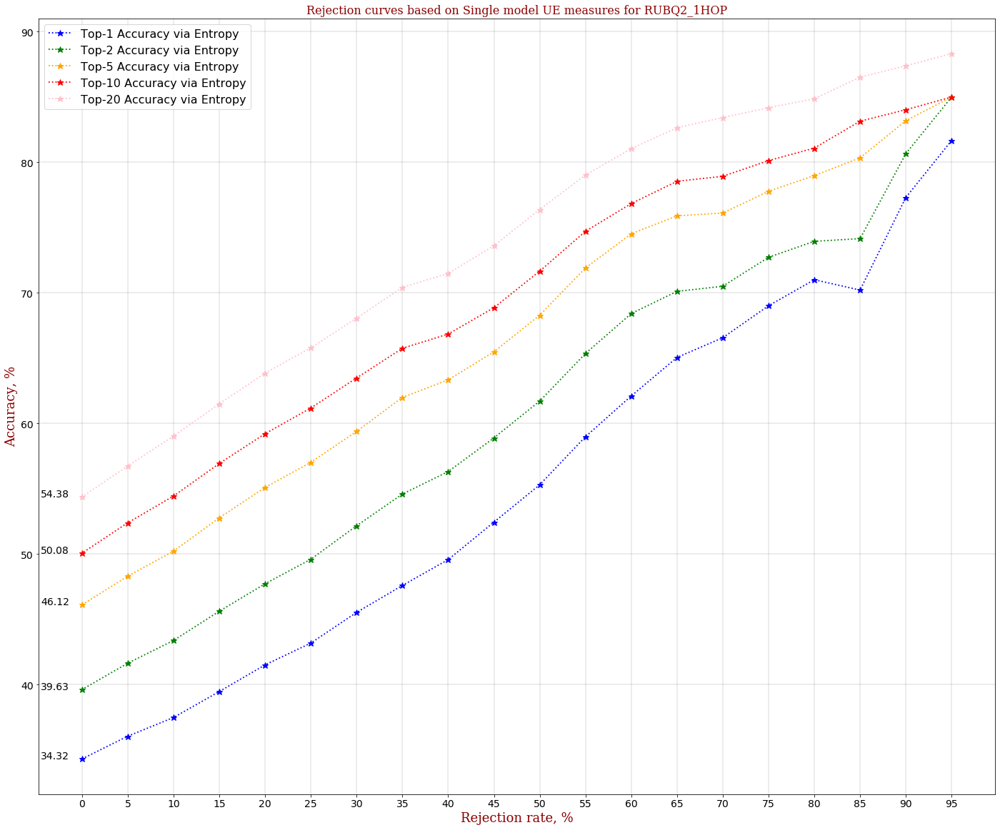

In [61]:
aggregation_plot_single_measures(
    ue_metrics_to_plot = ["entropy"],
    top_k_to_plot = [1, 2, 5, 10, 20],
    name_of_dataset = "RUBQ2_1HOP",
    accuracy_for_each_topk_delta = None,
    accuracy_for_each_topk_maxprob = None,
    accuracy_for_each_topk_entropy = accuracy_for_each_topk_entropy,
    model_name = "T5_XL_SSM_NQ",
    subplots = False,
    subplots_n_rows = 2,
    subplots_n_cols = 2,
    subplots_index = 1
)

In [68]:
SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20["predictions"]

[['Earthquakes',
  'Earthquakes',
  'Plate tectonics',
  'Earthquakes and volcanic eruptions',
  'Earthquakes and earthquakes',
  'Tectonics',
  'Earthquakes earthquakes',
  'Geological earthquakes',
  'Earthquakes numerous forms',
  'Earthquakes)',
  'Geological activity',
  'Earthquakes',
  'Earthquakes:',
  'Geothermal activity',
  'Earthquakes,',
  'Earthquake',
  'A earthquake',
  'Powerful earthquakes',
  'Geological events',
  'Earthquaking'],
 ['Harriet Beecher Stowe',
  'Harriott Beecher Stowe',
  'Harriet Beecher Stowell',
  'Harrieth Beecher Stowe',
  'Charles W. Chesnutt',
  'Harriet Beecher Stove',
  'Harriet Beecher Stobie',
  'Harriet Beecher StoWe',
  'Harrie T. Beecher',
  'Harrieth Anne Wells',
  'Sarah Orne Jewett',
  'Harrieth Anne Porter',
  'Harrieth Martineau',
  'Margaret Elizabeth Gaskell',
  'Harriet Beecham',
  'William Wells Brown',
  'Sherwood Anderson',
  'F. Scott Fitzgerald',
  'Stowe, Virginia',
  'Stowe,'],
 ['William Shakespeare',
  'Christopher Marlo

In [69]:
SINGLE_MODEL_RUBQ2_1HOP_TEST_BS20["probabilities"]


[tensor([0.6271, 0.0718, 0.0392, 0.0355, 0.0332, 0.0272, 0.0271, 0.0213, 0.0196,
         0.0136, 0.0129, 0.0112, 0.0108, 0.0105, 0.0105, 0.0079, 0.0058, 0.0054,
         0.0049, 0.0045]),
 tensor([0.5159, 0.0619, 0.0513, 0.0428, 0.0427, 0.0371, 0.0360, 0.0353, 0.0283,
         0.0274, 0.0265, 0.0199, 0.0159, 0.0144, 0.0119, 0.0078, 0.0077, 0.0071,
         0.0069, 0.0032]),
 tensor([0.9056, 0.0215, 0.0163, 0.0083, 0.0063, 0.0050, 0.0048, 0.0042, 0.0037,
         0.0031, 0.0027, 0.0026, 0.0025, 0.0025, 0.0024, 0.0023, 0.0022, 0.0016,
         0.0015, 0.0010]),
 tensor([6.3644e-01, 6.1602e-02, 4.7117e-02, 4.4961e-02, 4.1162e-02, 4.0788e-02,
         3.6880e-02, 2.1409e-02, 2.0918e-02, 1.3485e-02, 1.1620e-02, 1.1210e-02,
         5.9911e-03, 4.0936e-03, 1.0496e-03, 8.4394e-04, 2.8751e-04, 7.9041e-05,
         6.5233e-05, 4.3815e-09]),
 tensor([7.2840e-01, 1.4486e-01, 2.5333e-02, 1.8517e-02, 1.0291e-02, 8.8667e-03,
         8.1228e-03, 7.6053e-03, 7.2427e-03, 6.7562e-03, 6.4018e-03, 5.817

## ensemble

#### first model

In [29]:
with open('RUBQ2_1HOP_1186_MC_DROPOUT_BS20.pickle', 'rb') as handle:
    RUBQ2_1HOP_1186_MC_DROPOUT_BS20 = pickle.load(handle)


RUBQ2_1HOP_1186_MC_DROPOUT_BS20.keys()

dict_keys(['matrixes_of_probs', 'predictions_matrix', 'predictions', 'preds', 'res', 'ensemble_deltas', 'ensemble_max_probs', 'eentropies', 'pentropies', 'balds', 'epkls', 'rmis', 'data_name', 'num_beams', 'ensemble_size', 'ensemble maxprob', 'ensemble delta', 'expected entropy', 'predictive entropy', 'BALD', 'EPKL', 'RMI', 'top_ks'])

In [70]:
data = RUBQ2_1HOP_1186_MC_DROPOUT_BS20["matrixes_of_probs"]
data

[tensor([[0.0509, 0.0506, 0.0506, 0.0505, 0.0505, 0.0505, 0.0501, 0.0501, 0.0501,
          0.0500, 0.0499, 0.0499, 0.0498, 0.0497, 0.0496, 0.0496, 0.0496, 0.0493,
          0.0493, 0.0493],
         [0.0607, 0.0513, 0.0508, 0.0503, 0.0496, 0.0496, 0.0496, 0.0495, 0.0495,
          0.0493, 0.0491, 0.0491, 0.0491, 0.0491, 0.0490, 0.0489, 0.0489, 0.0489,
          0.0488, 0.0488],
         [0.0672, 0.0522, 0.0505, 0.0505, 0.0501, 0.0491, 0.0491, 0.0489, 0.0488,
          0.0487, 0.0487, 0.0486, 0.0486, 0.0485, 0.0485, 0.0484, 0.0484, 0.0484,
          0.0484, 0.0484],
         [0.0562, 0.0519, 0.0516, 0.0498, 0.0497, 0.0497, 0.0496, 0.0495, 0.0495,
          0.0495, 0.0494, 0.0494, 0.0493, 0.0493, 0.0493, 0.0493, 0.0493, 0.0492,
          0.0492, 0.0492],
         [0.0613, 0.0512, 0.0504, 0.0502, 0.0496, 0.0495, 0.0494, 0.0494, 0.0494,
          0.0493, 0.0493, 0.0492, 0.0492, 0.0492, 0.0491, 0.0490, 0.0489, 0.0489,
          0.0487, 0.0487]]),
 tensor([[0.0515, 0.0507, 0.0507, 0.0506, 0

In [71]:
probs = [i.tolist()[0] for i in data]
probs

[[0.05091342329978943,
  0.05058569461107254,
  0.050576675683259964,
  0.050543371587991714,
  0.050523821264505386,
  0.0505126528441906,
  0.05010894685983658,
  0.050071198493242264,
  0.050068411976099014,
  0.04999019578099251,
  0.04994436353445053,
  0.049860838800668716,
  0.04982843995094299,
  0.049730025231838226,
  0.04964572563767433,
  0.049601130187511444,
  0.04957686364650726,
  0.04932203143835068,
  0.04931539297103882,
  0.04928077012300491],
 [0.05147599056363106,
  0.05071984976530075,
  0.05067547783255577,
  0.05055375024676323,
  0.05015376955270767,
  0.05000491067767143,
  0.04997626692056656,
  0.04994726926088333,
  0.0498233363032341,
  0.049822572618722916,
  0.04977254569530487,
  0.049770619720220566,
  0.049732506275177,
  0.04971060901880264,
  0.04971021041274071,
  0.0496993325650692,
  0.049666326493024826,
  0.0496339313685894,
  0.04959661513566971,
  0.049554016441106796],
 [0.08408395200967789,
  0.04863429069519043,
  0.04852195084095001,
  0

In [51]:
preds = RUBQ2_1HOP_1186_MC_DROPOUT_BS20["predictions_matrix"]
preds

[array([['A change in', 'A meteorit', 'Tectonic', 'A high sea',
         'A focus of', 'A focus shift', 'A powerful earthquake',
         'A focus on', 'A focus in', 'Earthquakes', 'A strong enough',
         'Plate tect', 'A hole in', 'A focus point', 'A large sea',
         'A large oil', 'A high-', 'Typho', 'A megath', 'A high ocean'],
        ['Earthquakes', 'Geothermal bombard', 'Geological activity',
         'Earthquakes', 'Geothermal ', 'Earthquakes or proximity',
         'Ge forces', 'Ge blast a', 'Earthquaking',
         'Earthquakes or earthquake', 'Earthquakes or precipit',
         'Earthquakes or orbit', 'Ge specific har', 'Geological uphe',
         'Geological eruptions', 'Ge specific kinetic',
         'Earthquakes and plate', 'Ge become a', 'Powerful Earthquakes',
         'Conchoidal fracture'],
        ['Earthquakes', 'Earthquaking', 'Earthquake', 'Earthquak',
         'Earthquake or', 'Earthquakes initiate', 'Earthquake ',
         'Earthquake activity', 'Earthqua

In [53]:
predictions = [i[0] for i in preds]
predictions

[array(['A change in', 'A meteorit', 'Tectonic', 'A high sea',
        'A focus of', 'A focus shift', 'A powerful earthquake',
        'A focus on', 'A focus in', 'Earthquakes', 'A strong enough',
        'Plate tect', 'A hole in', 'A focus point', 'A large sea',
        'A large oil', 'A high-', 'Typho', 'A megath', 'A high ocean'],
       dtype='<U25'),
 array(['L. Frank Baum', 'L. Frank Dick', 'Author Harriet', 'Harriet Bee',
        'The American author Har', 'Authors Samuel Butler', 'L. Frankau',
        'Nathaniel', 'Authors George Stowe', 'A. P.',
        'Authors George Stoll', ', Harriet', 'Authors George Elio',
        'L. Frank Lewis', 'L. Frank Word', 'A. Dod', 'L. Frank Gil',
        'L. Frank Lock', 'L. Frank Fountain', 'Authors George Stod'],
       dtype='<U25'),
 array(['William Shakespeare', 'Actor Paul Henry',
        'William William Shakespeare', 'Professional football player Ben',
        'Actor Paul Vincent', 'Actor George S',
        'The English poet Shakespear

In [55]:
rubq_test = np.load("all_EN_rubq_test_questions_1_hop_uri.npy")
rubq_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
entities_test_rubq = np.load("entities_test_rubq.npy")
rubq_test_answers = np.load("all_rubq_test_answers_1_hop_uri.npy", allow_pickle=True)
rubq_test = pd.DataFrame({"subject":entities_test_rubq, "question":rubq_test})

sample_questions = len(list(rubq_test.question))
questions = list(rubq_test.question)[:sample_questions]

########################## parameters <- HERE DEFINE PARAMS
name_of_dataset = "RUBQ2_1hop_test"
num_quantiles = 20
num_beams = 20
answers = list(rubq_test_answers)

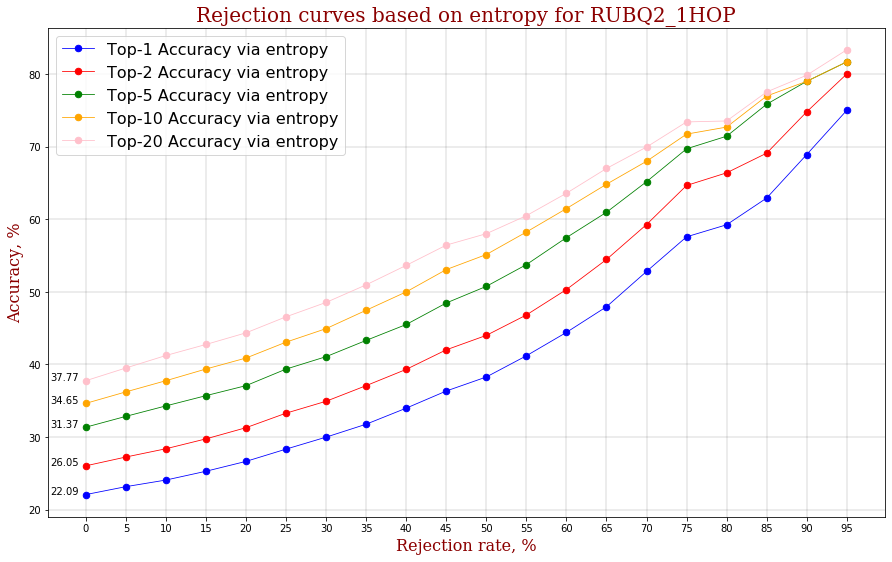

In [63]:
_, _ = sinlge_model_ue(
    name_of_metric = "entropy",
    name_of_dataset = "RUBQ2_1HOP",
    probas = probs,
    predictions = predictions,
    num_quantiles = 20,
    answers = answers,
    top_ks = [1, 2, 5, 10, 20],
    sample_questions = sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
)

#### second model

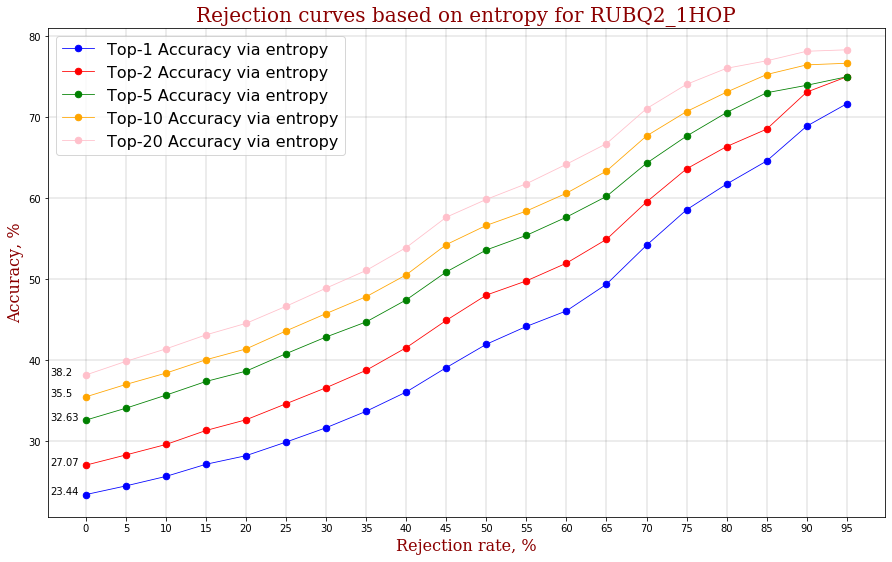

In [64]:
number_of_model = 1

probs = [i.tolist()[number_of_model] for i in data]
predictions = [i[number_of_model] for i in preds]


_, _ = sinlge_model_ue(
    name_of_metric = "entropy",
    name_of_dataset = "RUBQ2_1HOP",
    probas = probs,
    predictions = predictions,
    num_quantiles = 20,
    answers = answers,
    top_ks = [1, 2, 5, 10, 20],
    sample_questions = sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
)

#### 3 model

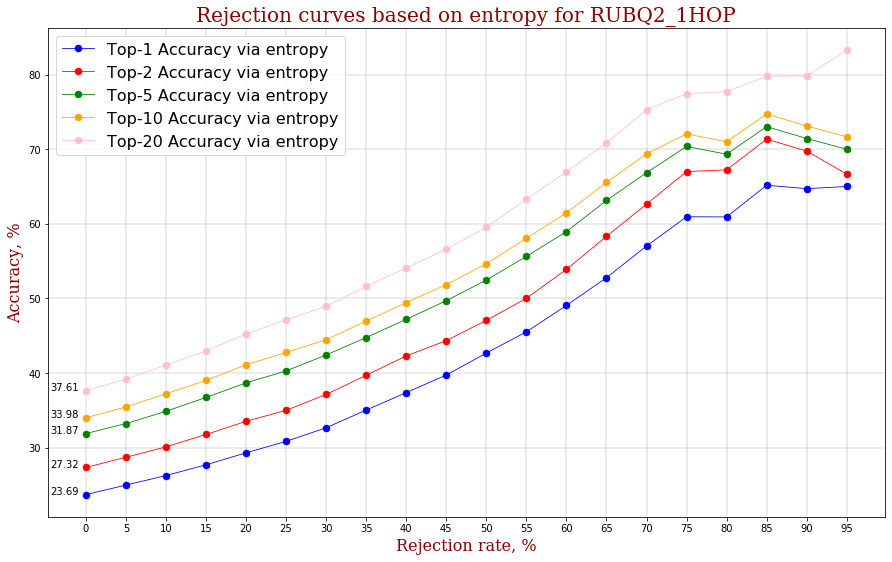

In [65]:
number_of_model = 2

probs = [i.tolist()[number_of_model] for i in data]
predictions = [i[number_of_model] for i in preds]


_, _ = sinlge_model_ue(
    name_of_metric = "entropy",
    name_of_dataset = "RUBQ2_1HOP",
    probas = probs,
    predictions = predictions,
    num_quantiles = 20,
    answers = answers,
    top_ks = [1, 2, 5, 10, 20],
    sample_questions = sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
)

#### 4 model

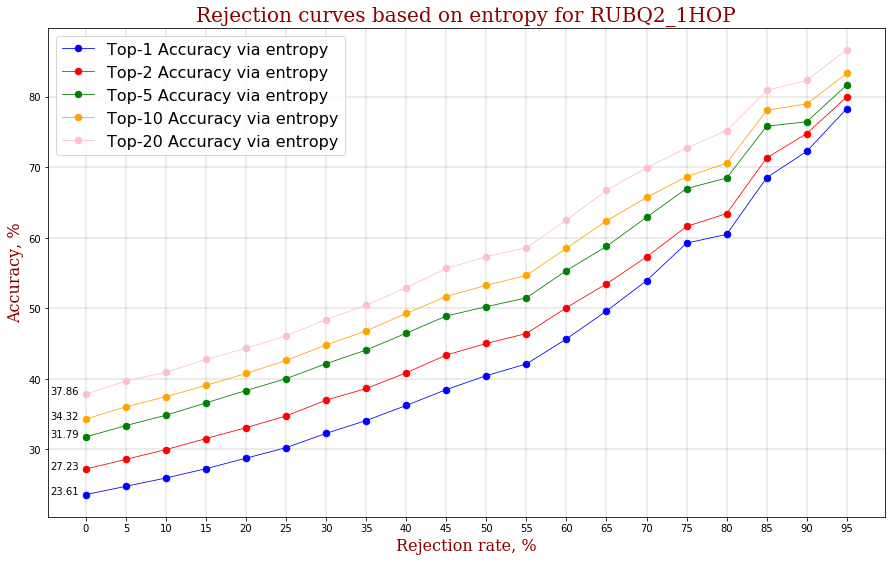

In [66]:
number_of_model = 3

probs = [i.tolist()[number_of_model] for i in data]
predictions = [i[number_of_model] for i in preds]


_, _ = sinlge_model_ue(
    name_of_metric = "entropy",
    name_of_dataset = "RUBQ2_1HOP",
    probas = probs,
    predictions = predictions,
    num_quantiles = 20,
    answers = answers,
    top_ks = [1, 2, 5, 10, 20],
    sample_questions = sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
)

#### 5 model

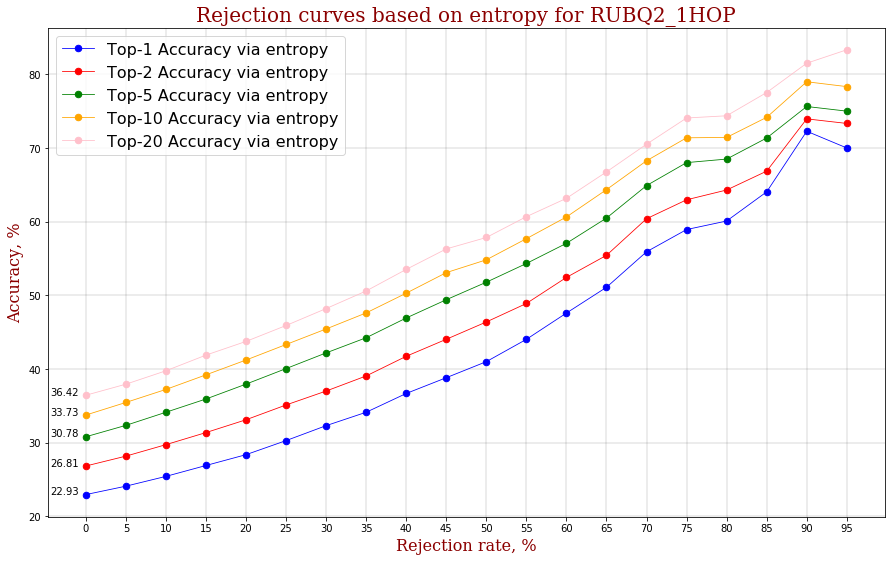

In [67]:
number_of_model = 4

probs = [i.tolist()[number_of_model] for i in data]
predictions = [i[number_of_model] for i in preds]


_, _ = sinlge_model_ue(
    name_of_metric = "entropy",
    name_of_dataset = "RUBQ2_1HOP",
    probas = probs,
    predictions = predictions,
    num_quantiles = 20,
    answers = answers,
    top_ks = [1, 2, 5, 10, 20],
    sample_questions = sample_questions,
    plot_rejection_curves = True,
    model_name = "T5_XL_SSM_NQ"
)

# Additional experiment

In [75]:
input_ids = t5_tok(["What did Alexander Bell invent?"], return_tensors="pt").input_ids
input_ids = input_ids.to(device)

out = t5_qa_model.generate(input_ids,
                     num_return_sequences = num_beams,
                     num_beams = num_beams,
                     eos_token_id = t5_tok.eos_token_id,
                     pad_token_id = t5_tok.pad_token_id,
                     output_scores = True,
                     return_dict_in_generate=True,
                     early_stopping=True,
                     max_length=32)

prediction = [t5_tok.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
print("prediction", prediction, "\n")
prediction = [first_letter_big(word) for word in prediction]
print("prediction", prediction, "\n")
probs = softmax(out.sequences_scores)
print("probs", probs, "\n")

prediction ['the telephone', 'the first telephone', 'the telegraph', 'the phone', 'wired telephone system', 'a communication device', 'a communication system', 'the first phone', 'the Volta', 'a telephone', 'wired telephone network', 'wired communication', 'the first communication device', 'speaking telephone', 'mobile phone', 'an audion microscope', 'telephone', 'Voltameter', 'the first communication system', 'the mobile phone'] 

prediction ['The telephone', 'The first telephone', 'The telegraph', 'The phone', 'Wired telephone system', 'A communication device', 'A communication system', 'The first phone', 'The Volta', 'A telephone', 'Wired telephone network', 'Wired communication', 'The first communication device', 'Speaking telephone', 'Mobile phone', 'An audion microscope', 'Telephone', 'Voltameter', 'The first communication system', 'The mobile phone'] 

probs tensor([0.1760, 0.1247, 0.0607, 0.0598, 0.0514, 0.0479, 0.0407, 0.0405, 0.0373,
        0.0369, 0.0347, 0.0336, 0.0333, 0.

In [76]:
t5_qa_model.training

False

### switch to train mode

In [79]:
t5_qa_model.train()

T5ForConditionalGeneration(
  (shared): Embedding(32128, 2048)
  (encoder): T5Stack(
    (embed_tokens): Embedding(32128, 2048)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=2048, out_features=2048, bias=False)
              (k): Linear(in_features=2048, out_features=2048, bias=False)
              (v): Linear(in_features=2048, out_features=2048, bias=False)
              (o): Linear(in_features=2048, out_features=2048, bias=False)
              (relative_attention_bias): Embedding(32, 32)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseGatedActDense(
              (wi_0): Linear(in_features=2048, out_features=5120, bias=False)
              (wi_1): Linear(in_features=2048, out_features=5120, bias=False)
       

In [80]:
t5_qa_model.training

True

In [81]:
input_ids = t5_tok(["What did Alexander Bell invent?"], return_tensors="pt").input_ids
input_ids = input_ids.to(device)

out = t5_qa_model.generate(input_ids,
                     num_return_sequences = num_beams,
                     num_beams = num_beams,
                     eos_token_id = t5_tok.eos_token_id,
                     pad_token_id = t5_tok.pad_token_id,
                     output_scores = True,
                     return_dict_in_generate=True,
                     early_stopping=True,
                     max_length=32)

prediction = [t5_tok.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
print("prediction", prediction, "\n")
prediction = [first_letter_big(word) for word in prediction]
print("prediction", prediction, "\n")
probs = softmax(out.sequences_scores)
print("probs", probs, "\n")

prediction ['the first telephone', 'the first phone', 'a communication device', 'phone', 'the first mobile phone', 'the first phone call', 'the first domestic phone', 'phoney bombs', 'plate-electric camera', 'Alexanderson phone', 'a communication telephone', 'what is phone number', 'Voltameter', 'a communication system', 'a communication phone', 'the telephone', 'plate glass', 'changes in direction', 'telephone', 'The telephone'] 

prediction ['The first telephone', 'The first phone', 'A communication device', 'Phone', 'The first mobile phone', 'The first phone call', 'The first domestic phone', 'Phoney bombs', 'Plate-electric camera', 'Alexanderson phone', 'A communication telephone', 'What is phone number', 'Voltameter', 'A communication system', 'A communication phone', 'The telephone', 'Plate glass', 'Changes in direction', 'Telephone', 'The telephone'] 

probs tensor([0.0963, 0.0837, 0.0813, 0.0782, 0.0667, 0.0605, 0.0503, 0.0473, 0.0449,
        0.0431, 0.0422, 0.0417, 0.0415, 0.

In [82]:
input_ids = t5_tok(["What did Alexander Bell invent?"], return_tensors="pt").input_ids
input_ids = input_ids.to(device)

out = t5_qa_model.generate(input_ids,
                     num_return_sequences = num_beams,
                     num_beams = num_beams,
                     eos_token_id = t5_tok.eos_token_id,
                     pad_token_id = t5_tok.pad_token_id,
                     output_scores = True,
                     return_dict_in_generate=True,
                     early_stopping=True,
                     max_length=32)

prediction = [t5_tok.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
print("prediction", prediction, "\n")
prediction = [first_letter_big(word) for word in prediction]
print("prediction", prediction, "\n")
probs = softmax(out.sequences_scores)
print("probs", probs, "\n")

prediction ['telephone', 'phone handset', 'the telephone', 'phonetic alphabet', 'Volta', 'phone number verification', 'phone', 'phoney', 'his telephone', 'telephone plugs', 'phone number tapping', 'phone', 'telephone taping', 'conducting electrical current', 'a telephone', 'thought visor', 'phone number tap', 'phoney engine', 'telephone tap', 'the phone'] 

prediction ['Telephone', 'Phone handset', 'The telephone', 'Phonetic alphabet', 'Volta', 'Phone number verification', 'Phone', 'Phoney', 'His telephone', 'Telephone plugs', 'Phone number tapping', 'Phone', 'Telephone taping', 'Conducting electrical current', 'A telephone', 'Thought visor', 'Phone number tap', 'Phoney engine', 'Telephone tap', 'The phone'] 

probs tensor([0.1707, 0.0934, 0.0861, 0.0619, 0.0597, 0.0470, 0.0466, 0.0465, 0.0440,
        0.0408, 0.0370, 0.0357, 0.0354, 0.0328, 0.0304, 0.0284, 0.0273, 0.0269,
        0.0264, 0.0228], device='cuda:2') 



In [83]:
input_ids = t5_tok(["What did Alexander Bell invent?"], return_tensors="pt").input_ids
input_ids = input_ids.to(device)

out = t5_qa_model.generate(input_ids,
                     num_return_sequences = num_beams,
                     num_beams = num_beams,
                     eos_token_id = t5_tok.eos_token_id,
                     pad_token_id = t5_tok.pad_token_id,
                     output_scores = True,
                     return_dict_in_generate=True,
                     early_stopping=True,
                     max_length=32)

prediction = [t5_tok.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
print("prediction", prediction, "\n")
prediction = [first_letter_big(word) for word in prediction]
print("prediction", prediction, "\n")
probs = softmax(out.sequences_scores)
print("probs", probs, "\n")

prediction ['telephone', 'the first telephone', 'a telephone', 'a phone', 'electrostatic charging', 'electrostatic telephone', 'digital communication system', 'digital electrical clock', 'microwave ovens', 'electronic radio', 'electrostatic printing', 'electronic music', 'electrostatics', 'electrostatic switches', 'digital equipment', 'electronic communication', 'the first phone', 'electrostatic device', 'electrophone', 'communication telephone'] 

prediction ['Telephone', 'The first telephone', 'A telephone', 'A phone', 'Electrostatic charging', 'Electrostatic telephone', 'Digital communication system', 'Digital electrical clock', 'Microwave ovens', 'Electronic radio', 'Electrostatic printing', 'Electronic music', 'Electrostatics', 'Electrostatic switches', 'Digital equipment', 'Electronic communication', 'The first phone', 'Electrostatic device', 'Electrophone', 'Communication telephone'] 

probs tensor([0.2873, 0.0840, 0.0603, 0.0574, 0.0443, 0.0427, 0.0401, 0.0389, 0.0384,
        

In [84]:
input_ids = t5_tok(["What did Alexander Bell invent?"], return_tensors="pt").input_ids
input_ids = input_ids.to(device)

out = t5_qa_model.generate(input_ids,
                     num_return_sequences = num_beams,
                     num_beams = num_beams,
                     eos_token_id = t5_tok.eos_token_id,
                     pad_token_id = t5_tok.pad_token_id,
                     output_scores = True,
                     return_dict_in_generate=True,
                     early_stopping=True,
                     max_length=32)

prediction = [t5_tok.decode(out.sequences[i], skip_special_tokens=True) for i in range(num_beams)]
print("prediction", prediction, "\n")
prediction = [first_letter_big(word) for word in prediction]
print("prediction", prediction, "\n")
probs = softmax(out.sequences_scores)
print("probs", probs, "\n")

prediction ['phone', 'telephone', 'mobile phone', 'a communication device', 'a phone', 'a closed circuit', 'a digital telephone', 'a stereoscope', 'a telephone', 'a mobile phone', 'a camera', 'a new phone', 'A communication device', 'the cell phone', 'mobile telephone', 'Mobile phone', 'mechanics', 'the phone', 'ography', 'phone'] 

prediction ['Phone', 'Telephone', 'Mobile phone', 'A communication device', 'A phone', 'A closed circuit', 'A digital telephone', 'A stereoscope', 'A telephone', 'A mobile phone', 'A camera', 'A new phone', 'A communication device', 'The cell phone', 'Mobile telephone', 'Mobile phone', 'Mechanics', 'The phone', 'Ography', 'Phone'] 

probs tensor([0.3160, 0.1009, 0.0620, 0.0602, 0.0572, 0.0562, 0.0481, 0.0423, 0.0395,
        0.0372, 0.0363, 0.0345, 0.0290, 0.0218, 0.0197, 0.0126, 0.0110, 0.0101,
        0.0027, 0.0026], device='cuda:2') 



In [86]:
out.keys()

odict_keys(['sequences', 'sequences_scores', 'scores', 'beam_indices'])

In [87]:
out["sequences"]

tensor([[    0,   951,     1,     0,     0,     0],
        [    0,  6596,     1,     0,     0,     0],
        [    0,  1156,   951,     1,     0,     0],
        [    0,     3,     9,  1901,  1407,     1],
        [    0,     3,     9,   951,     1,     0],
        [    0,     3,     9,  3168,  4558,     1],
        [    0,     3,     9,  1125,  6596,     1],
        [    0,     3,     9, 16687, 11911,     1],
        [    0,     3,     9,  6596,     1,     0],
        [    0,     3,     9,  1156,   951,     1],
        [    0,     3,     9,  1861,     1,     0],
        [    0,     3,     9,   126,   951,     1],
        [    0,    71,  1901,  1407,     1,     0],
        [    0,     8,  2358,   951,     1,     0],
        [    0,  1156,  6596,     1,     0,     0],
        [    0,  4873,   951,     1,     0,     0],
        [    0, 11754,     7,     1,     0,     0],
        [    0,     8,   951,     1,     0,     0],
        [    0,  5984,     1,     0,     0,     0],
        [   

In [90]:
len(out["sequences"]) == num_beams

True